# TFM - EVALUACIÓN Y DESARROLLO DE UN MODELO AUTOMATICO PARA LA CLASIFICACIÓN DE LA ENFERMEDAD DE PARKINSON MEDIANTE GAMMAGRAFÍA MIOCARDICA CON METAYODOBENCILGUANIDINA (BRAIN-FIRST/BODY-FIRST)

- Master en Inteligencia Artificial

- Autora: Ángela Sáenz Muñoz

In [720]:
# Importamos las librerías necesarias
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt


## 1- CREACION DE MI BD BASE (MERGE DE VARIAS BDs)

In [721]:
# Carga de bd
# BD inicial
mjff_bd= pd.read_excel('MJFF_BDs_Sara/candidatos.xlsx')
mjff_bd['CIC'] = mjff_bd['CIC'].apply(lambda x: str(int(x)) if pd.notnull(x) else None)
mjff_bd['GRUPO'].value_counts()

# Selecciono columnas utiles y pacientes solo de MJFF (Todos)
mjff_filtrado = mjff_bd[
    (mjff_bd['Study'].isin(['MJFF'])) & (mjff_bd['GRUPO'].isin(['iPD', 'Ipd', 'IPD','E46K','LRRK2','PARK2','DCL','RBD','AMS']))
][['Study', 'CIC', 'GRUPO', 'ID']].reset_index(drop=True)
mjff_filtrado.head(10)
print(np.shape(mjff_filtrado))

(73, 4)


In [722]:
print("Duplicados en mjff_filtrado:", mjff_filtrado['CIC'].duplicated().sum())
mjff_filtrado_unique = mjff_filtrado.drop_duplicates(subset=['CIC'])

Duplicados en mjff_filtrado: 0


In [723]:
# Elimino los sufijos de ID
mjff_filtrado_unique['ID'] = mjff_filtrado_unique['ID'].str.replace(r'_\d+$', '', regex=True)
# print(mjff_filtrado_unique['ID'].unique())

In [724]:
# Matcheo con demographics
demographics_bd= pd.read_excel('MJFF_BDs/E46K_Neuroimage_Baseline_Demographics_20190926.xlsx')

# demographics_bd.head(10)

df_id_3 = pd.merge(
    mjff_filtrado_unique,
    demographics_bd[[ 'ID','sex_coded','birthdate','studydate']],
    on='ID',
    how='left' 
)

# Ver resultado
# df_id_3.head(30)
#print(np.shape(df_id_3))

In [725]:
# Matcheo con demographics
NRL_bd= pd.read_excel('MJFF_BDs/E46K_Neuroimage_baseline_NRL_ANS_2021.07.01 (ANS ONLY OLD).xlsx')

NRL_bd.head(10)
NRL_bd.rename(columns={'ID_NRL': 'ID'}, inplace=True)
NRL_bd.head(10)
# print(list(NRL_bd.columns))

df_id_4 = pd.merge(
    df_id_3,
    NRL_bd[[ 'ID','dis_onset','side_onset', # GENERAL
            'UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY', 'UP1_COG', 'UP1_THO', 'UP1_DEP', 'UP1_MOT', 'UP2_SPE',  # UPDRS
            'UP2_SAL', 'UP2_SWA', 'UP2_WRI', 'UP2_FEE', 'UP2_DRE', 'UP2_HYG', 'UP2_BED', 'UP2_FALL', 'UP2_FRE', 'UP2_WAL', 'UP2_TRE', 'UP2_SEN', 'UP3_SPE', 
            'UP3_EXP', 'UP3_STA', 'UP3_PS', 'UP3_WAL', 'UP3_POSREF', 'UP3_HYP', 'UP3_RIG', 'UP3_TRE', 'UP3_DEXR', 'UP3_DEXL', 'UP3_HANR', 'UP3_HANL', 
            'UP3_PROR', 'UP3_PROL', 'UP3_FEER', 'UP3_FEEL', 'UP3_RIGUPR', 'UP3_RIGUPL', 'UP3_RIGLOR', 'UP3_RIGLOL', 'UP3_TRERUPR', 'UP3_TRERUPL', 
            'UP3_TRERLOR', 'UP3_TRERLOL', 'UP3_TREAR', 'UP3_TREAL', 'UP4_DYSDUR', 'UP4_DYSDIS', 'UP4_DYSPAIN', 'UP4_DYSMOR', 'UP4_FLUPRE', 'UP4_FLUUNP', 
            'UP4_FLUSUD', 'UP4_FLUDAY', 'UP4_FLUDIG', 'UP4_FLUSLE', 'UP4_FLUORT', 'Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L', 
            'UPDRSIII_R', 'UPDRSIII_L', 'UPDRS_III_midline', 'UPDRS_III_limbs', 'UPDRS_III_limb_tremor', 
            'more_affected', 'TD', 'AR', 'TD/AR_ratio', 'TD/AR', # dominancia
            'FSS_Fatiga_total', # FSS
            'LARS_apathy_Total', # LARS
            'GDS_notinverted', # GDS
            'EI_ratio_correct', # E/I RATIO
            'OH_5min', 'OH_10min', 'OH_20min',# Hipotension ortostatica
            'Vals_PRT_correct',
            'SBP_II_late_correct', 'SBP_IV_correct', 'DBP_II_late_correct', 'DBP_IV_correct','Vals_baselinePHR_correct', 'Vals_baselineSBP_correct', 'Vals_baselineDBP_correct', # nuevas del valsalva
            # 'Vals_PSBP_Phase2late_correct','Vals_PHR_Phase2early_correct', # Valsalva, las elimino 
            'ESC_aver_feet', 'ESC_aver_hands',# Sudoscan
            'SCAU_TOTAL', # Scopa-aut
            'MIBI_alterado_MJFF','MIBG_LAST_Date','MIBG_LAST_H_M_15m','MIBG_LAST_H_M_4h','MIBG_LAST_H_L_15min','MIBG_LAST_H_L_4h']], # MIBG
    on='ID',
    how='left'  # Esto mantiene todas las filas de df_id
)

# Ver resultado
# df_id_4.head(30)
#print(np.shape(df_id_4))

In [726]:
# df_id_4[['CIC','MIBG_LAST_Date','MIBG_LAST_H_M_15m','MIBG_LAST_H_M_4h','MIBG_LAST_H_L_15min','MIBG_LAST_H_L_4h']]

In [727]:
# Matcheo con NPSICO
NPSICO_bd= pd.read_excel('MJFF_BDs/E46K_Neuroimage_baseline_NPSICO_2021.07.01.xlsx')

NPSICO_bd.head(10)
NPSICO_bd.rename(columns={'ID_NPSICO': 'ID'}, inplace=True)
NPSICO_bd.head(10)
print(list(NPSICO_bd.columns))

df_id_5 = pd.merge(
    df_id_4,
    NPSICO_bd[[ 'ID','MoCA_TOTAL',# MOCA
               'GDS.Si', 'GDS.No', 'GDS_Total']], # GDS
    on='ID',
    how='left'  
)

# Ver resultado
# df_id_5.head(30)

['ID', 'Neuropsychologist', 'MoCA_Visuoespacial_E', 'MoCA_Identificación', 'MoCA_Atención', 'MoCA_Lenguaje', 'MoCA_Abstracción', 'MoCA_Recuerdo_diferido', 'MoCA_Orientación', 'MoCA_TOTAL', 'E.TICS', 'E.TICS.Interpretación', 'TAP_Total', 'Salthouse_Cadena3', 'Salthouse_Errores', 'Salthouse_Cadena6', 'Salthouse_Errores2', 'Salthouse_Total', 'UD_Stroop_P', 'UD_Stroop_C', 'UD_Stroop_PC', 'UD_StroopPCprima', 'UD_Stroopinterferencia', 'Figura.Taylor_Copia_Total', 'Figura.Taylor_Copia_Tiempo', 'Figura.Taylor_Memoria_Total', 'Figura.Taylor_Memoria_Tiempo', 'HVLT2_E1', 'HVLT2_E2', 'HVLT2_E3', 'HVLT2_Ap.recuerdo.total', 'HVLT2_E4', 'HVLT2_A', 'HVLT2_FPsemanticos', 'HVLT2_FPnosemanticos', 'HVLT2_Total_FP', 'HVLT2_FN', 'HVLT2_Reteción', 'HVLT2_Ind_discriminac_reconocimiento', 'BVMT_RCP1', 'BVMT_RCP2', 'BVMT_RCP3', 'BVMT_Total', 'BVMT_Ap', 'BVMT_RLP', 'BVMT_Porcentaje_Retenido', 'BVMT_reconocimiento', 'BVMT_Falsas_Alarmas', 'BVMT_IndiceDiscriminación', 'TMTA_Tiempo', 'TMTA_Tiempo_Recodificada', 'TM

In [728]:
np.shape(df_id_5)

(73, 113)

In [729]:
# list(df_id_5.columns)

### 1.1- CALCULO DE VARIABLES QUE NO TENGO

In [730]:
# Calculo de variables que no tengo

# Study_age: edad que tenia el paciente cuando se le hizo el estudio
df_id_5['studydate'] = pd.to_datetime(df_id_5['studydate'])
df_id_5['birthdate'] = pd.to_datetime(df_id_5['birthdate'])

df_id_5['Study_age'] = (df_id_5['studydate'] - df_id_5['birthdate']).dt.days / 365.25
df_id_5['Study_age'] = df_id_5['Study_age'].round(1) 

# EP_duration : duracion de la enfermedad dede el dx
df_id_5['dis_onset'] = pd.to_datetime(df_id_5['dis_onset'])

df_id_5['EP_duration'] = (df_id_5['studydate'] - df_id_5['dis_onset']).dt.days / 365.25
df_id_5['EP_duration'] = df_id_5['EP_duration'].round(1) 
df_id_5

# CALCULO DE SUBTIPO MOTOR

# 1. Reemplazar comas por puntos
df_id_5["TD/AR_ratio"] = df_id_5["TD/AR_ratio"].astype(str).str.replace(",", ".")

# 2. Convertir a float
df_id_5["TD/AR_ratio"] = pd.to_numeric(df_id_5["TD/AR_ratio"], errors="coerce")

# 3. Clasificar subtipo motor
def clasificar_subtipo(td_ar_ratio):
    if pd.isnull(td_ar_ratio):
        return None
    elif td_ar_ratio >= 1.5:
        return "Temblor-dominante"
    elif td_ar_ratio <= 0.9:
        return "Acinesia-rigidez"
    else:
        return "Marcha-postural"

df_id_5["Subtipo_motor"] = df_id_5["TD/AR_ratio"].apply(clasificar_subtipo)
df_id_5

# CALCULO DE ASIMETRIA MOTORA
def clasificar_asimetria(valor):
    if pd.isnull(valor):
        return None
    elif valor == 1:
        return "Derecha"
    elif valor == 2:
        return "Izquierda"
    elif valor == 0:
        return "Simétrica"
    else:
        return "Desconocido"

df_id_5["Asimetría_motora"] = df_id_5["more_affected"].apply(clasificar_asimetria)
df_id_5

# CALCULO DE DIRECCION DE PROPAGACION
def direccion_propagacion(row):
    score = 0
    
    # Central -> periférico (brain-first) aumenta score
    try:
        if str(row['side_onset']).lower() in ['left', 'right']:
            score += 1
    except:
        pass

    try:
        if str(row['Asimetría_motora']) in ['Izquierda', 'Derecha']:
            score += 1
    except:
        pass

    try:
        if int(row['UP4_FLUSLE']) == 0:
            score += 1
    except:
        pass

    try:
        if float(row['SCAU_TOTAL']) < 15:
            score += 1
    except:
        pass

    try:
        if float(row['ESC_aver_feet']) >= 60 and float(row['ESC_aver_hands']) >= 60:
            score += 1
    except:
        pass

    try:
        if float(row['Captación_total_MIBG']) > 120:
            score += 1
    except:
        pass

    try:
        if abs(float(row['Asimetría_MIBG_%'])) > 15:
            score += 1
    except:
        pass

    try:
        if int(row['MoCA_TOTAL']) >= 26:
            score += 1
    except:
        pass

    # Periférico -> central (body-first) resta score
    try:
        if str(row['side_onset']).lower() in ['symmetric', 'bilateral']:
            score -= 1
    except:
        pass

    try:
        if str(row['Asimetría_motora_num']) == 'Simétrica':
            score -= 1
    except:
        pass

    try:
        if int(row['UP4_FLUSLE']) == 1:
            score -= 1
    except:
        pass

    try:
        if float(row['SCAU_TOTAL']) > 20:
            score -= 1
    except:
        pass

    try:
        if float(row['ESC_aver_feet']) < 60 or float(row['ESC_aver_hands']) < 60:
            score -= 1
    except:
        pass

    try:
        if float(row['Captación_total_MIBG']) < 100:
            score -= 1
    except:
        pass

    try:
        if abs(float(row['Asimetría_MIBG_%'])) < 10:
            score -= 1
    except:
        pass

    try:
        if int(row['MoCA_TOTAL']) < 26:
            score -= 1
    except:
        pass
    
    # Clasificación basada en score
    if score > 0:
        return 1
    elif score < 0:
        return 0
    else:
        return 2

# Aplicación
df_id_5['direccion_propagacion'] = df_id_5.apply(direccion_propagacion, axis=1)





In [731]:
df_id_5['direccion_propagacion'] 

0     1
1     1
2     1
3     1
4     1
     ..
68    0
69    2
70    1
71    1
72    1
Name: direccion_propagacion, Length: 73, dtype: int64

### 1.2- ORDENO LAS COLUMNAS

In [732]:
nuevo_orden = [
    "Study", "CIC", "ID", "GRUPO", "sex_coded", "birthdate", "studydate", "Study_age",
    "dis_onset", "side_onset", "EP_duration", "OH_5min", "OH_10min", "OH_20min",
    "Vals_PRT_correct", 'SBP_II_late_correct', 'SBP_IV_correct', 'DBP_II_late_correct', 'DBP_IV_correct','Vals_baselinePHR_correct', 'Vals_baselineSBP_correct', 'Vals_baselineDBP_correct',
    "ESC_aver_feet", "ESC_aver_hands", "EI_ratio_correct", "GDS.Si", "GDS.No", "GDS_Total",
    "GDS_notinverted", "FSS_Fatiga_total", "LARS_apathy_Total", "SCAU_TOTAL", "MoCA_TOTAL",
    "UPDRS_I", "UPDRS_II", "UPDRS_III", "UPDRS_IV", "HY",
    "UP1_COG", "UP1_THO", "UP1_DEP", "UP1_MOT",
    "UP2_SPE", "UP2_SAL", "UP2_SWA", "UP2_WRI", "UP2_FEE", "UP2_DRE", "UP2_HYG", "UP2_BED", "UP2_FALL",
    "UP2_FRE", "UP2_WAL", "UP2_TRE", "UP2_SEN",
    "UP3_SPE", "UP3_EXP", "UP3_STA", "UP3_PS", "UP3_WAL", "UP3_POSREF", "UP3_HYP", "UP3_RIG", "UP3_TRE",
    "UP3_DEXR", "UP3_DEXL", "UP3_HANR", "UP3_HANL", "UP3_PROR", "UP3_PROL", "UP3_FEER", "UP3_FEEL",
    "UP3_RIGUPR", "UP3_RIGUPL", "UP3_RIGLOR", "UP3_RIGLOL", "UP3_TRERUPR", "UP3_TRERUPL",
    "UP3_TRERLOR", "UP3_TRERLOL", "UP3_TREAR", "UP3_TREAL",
    "UP4_DYSDUR", "UP4_DYSDIS", "UP4_DYSPAIN", "UP4_DYSMOR", "UP4_FLUPRE", "UP4_FLUUNP",
    "UP4_FLUSUD", "UP4_FLUDAY", "UP4_FLUDIG", "UP4_FLUSLE", "UP4_FLUORT",
    "Bradikin_R", "Bradikin_L", "Rigidity_R", "Rigidity_L", "Tremor_R", "Tremor_L",
    "UPDRSIII_R", "UPDRSIII_L", "UPDRS_III_midline", "UPDRS_III_limbs", "UPDRS_III_limb_tremor",
    "more_affected", "TD", "AR", "TD/AR_ratio", "TD/AR", "Subtipo_motor", "Asimetría_motora",'direccion_propagacion',
    'MIBG_LAST_Date','MIBG_LAST_H_M_15m','MIBG_LAST_H_M_4h','MIBG_LAST_H_L_15min','MIBG_LAST_H_L_4h'
]


# Reordenar columnas
df = df_id_5[nuevo_orden]
# df

In [733]:
# df[['CIC','MIBG_LAST_Date','MIBG_LAST_H_M_15m','MIBG_LAST_H_M_4h','MIBG_LAST_H_L_15min','MIBG_LAST_H_L_4h']]

### 1.3- INCLUYENDO MIBG DEL MODELO AHA /FIJI

#### 1.3.1- Unir todos los CSV por paciente en un solo DataFrame

In [734]:
# Ruta donde están los CSV individuales generados por Fiji
carpeta_resultados = "C:/Users/angel/OneDrive/Escritorio/TFM/codigo/Results"
archivos = [f for f in os.listdir(carpeta_resultados) if f.endswith(".csv")]

# Leer y combinar todos los CSV
df_total = pd.concat([
    pd.read_csv(os.path.join(carpeta_resultados, f)).assign(CIC=f.replace(".csv", ""))
    for f in archivos
], ignore_index=True)

# Guardar base combinada
df_total.to_csv("todos_los_segmentos.csv", index=False)
print(np.shape(df_total))
# df_total.head(20)


(425, 10)


#### 1.3.2- Calcular la captación total y lateralizada

- Captación total: media de la intensidad de todos los segmentos

- Captación izquierda y derecha: media según si el segmento es del lado izquierdo o derecho

- Asimetría (%): ((izquierda - derecha) / total) * 100

In [ ]:
# Regiones del lado izquierdo del corazón 
regiones_izquierda = [
    "Basal anterolateral", "Medio anterolateral", "Apical lateral",
    "Basal inferolateral", "Medio inferolateral"
]

# Regiones del lado derecho
regiones_derecha = [
    "Basal anteroseptal", "Medio anteroseptal", "Apical septal",
    "Basal inferoseptal", "Medio inferoseptal"
]

# Calcular medidas por paciente
resultados = []

for paciente, grupo in df_total.groupby("CIC"):
    total = grupo["Mean"].mean()
    izquierda = grupo[grupo["Region"].isin(regiones_izquierda)]["Mean"].mean()
    derecha = grupo[grupo["Region"].isin(regiones_derecha)]["Mean"].mean()
    asimetria = ((izquierda - derecha) / total) * 100 if total != 0 else None

    resultados.append({
        "CIC": paciente,
        "Captación_total_MIBG": total,
        "Captación_izquierda": izquierda,
        "Captación_derecha": derecha,
        "Asimetría_MIBG_%": asimetria
    })

df_resultados = pd.DataFrame(resultados)
df_resultados.to_csv("Resumen_Captacion_MIBG.csv", index=False)

# df_resultados.head(30)



#### 1.3.3- Pivotar y unir todas

In [736]:
df_pivot = df_total.pivot_table(
    index="CIC", columns="Region", values="Mean"
).reset_index()

df_pivot.to_csv("Captacion_por_segmento.csv", index=False)
# df_pivot


In [737]:
df_unido = df_pivot.merge(df_resultados, on='CIC', how='left')
# df_unido

In [738]:
# list(df_unido.columns)

In [739]:
# Convertir a string y limpiar espacios
df['CIC'] = df['CIC'].astype(str).str.strip()
df_unido['CIC'] = df_unido['CIC'].astype(str).str.strip()

# La uno a mi base de datos
df_total =  df.merge(df_unido, on='CIC', how='left')
# df_total

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\3869726724.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CIC'] = df['CIC'].astype(str).str.strip()


In [740]:
df_total[['CIC','MIBG_LAST_Date','MIBG_LAST_H_M_15m','MIBG_LAST_H_M_4h','MIBG_LAST_H_L_15min','MIBG_LAST_H_L_4h']]

,CIC,MIBG_LAST_Date,MIBG_LAST_H_M_15m,MIBG_LAST_H_M_4h,MIBG_LAST_H_L_15min,MIBG_LAST_H_L_4h
0,1681179,2015-02-25 00:00:00,"1,68","1,65","0,8","0,86"
1,2103111,2015-03-16 00:00:00,"2,03","2,27","0,97","1,16"
2,122515,2015-09-03 00:00:00,"1,51","1,23","0,87","0,77"
3,1603598,2014-04-30 00:00:00,"1,75","1,78","1,03","1,21"
4,11017957,2015-11-03 00:00:00,"1,17","1,38","0,73","0,79"
...,...,...,...,...,...,...
68,292153,2016-11-02 00:00:00,"1,65","1,33","0,77","0,82"
69,71778,,,,,
70,162500,2014-08-05 00:00:00,2,"2,05","0,83",1
71,274655,,,,,


In [742]:
df_total[['CIC','MIBG_LAST_Date','MIBG_LAST_H_M_15m','MIBG_LAST_H_M_4h','MIBG_LAST_H_L_15min','MIBG_LAST_H_L_4h']]

,CIC,MIBG_LAST_Date,MIBG_LAST_H_M_15m,MIBG_LAST_H_M_4h,MIBG_LAST_H_L_15min,MIBG_LAST_H_L_4h
0,1681179,2015-02-25 00:00:00,"1,68","1,65","0,8","0,86"
1,2103111,2015-03-16 00:00:00,"2,03","2,27","0,97","1,16"
2,122515,2015-09-03 00:00:00,"1,51","1,23","0,87","0,77"
3,1603598,2014-04-30 00:00:00,"1,75","1,78","1,03","1,21"
4,11017957,2015-11-03 00:00:00,"1,17","1,38","0,73","0,79"
...,...,...,...,...,...,...
68,292153,2016-11-02 00:00:00,"1,65","1,33","0,77","0,82"
69,71778,,,,,
70,162500,2014-08-05 00:00:00,2,"2,05","0,83",1
71,274655,,,,,


## 2-PREPROCESADO

### 2.1- Inspeccion de la base de datos

In [743]:
np.shape(df_total)

(73, 138)

In [744]:
# df_total

### 2.2- Eliminar filas y columnas que no tienen > de un 30% de datos

In [745]:
columnas_mibg = [
    'Apex', 'Apical anterior', 'Apical inferior', 'Apical lateral', 'Apical septal',
    'Basal anterior', 'Basal anterolateral', 'Basal anteroseptal', 'Basal inferior',
    'Basal inferolateral', 'Basal inferoseptal', 'Medio anterior', 'Medio anterolateral',
    'Medio anteroseptal', 'Medio inferior', 'Medio inferolateral', 'Medio inferoseptal',
    'Captación_total_MIBG', 'Captación_izquierda', 'Captación_derecha', 'Asimetría_MIBG_%'
]

columnas_a_considerar = df_total.columns.difference(columnas_mibg)
columnas_a_considerar

Index(['AR', 'Asimetría_motora', 'Bradikin_L', 'Bradikin_R', 'CIC',
       'DBP_II_late_correct', 'DBP_IV_correct', 'EI_ratio_correct',
       'EP_duration', 'ESC_aver_feet',
       ...
       'Vals_baselineDBP_correct', 'Vals_baselinePHR_correct',
       'Vals_baselineSBP_correct', 'birthdate', 'direccion_propagacion',
       'dis_onset', 'more_affected', 'sex_coded', 'side_onset', 'studydate'],
      dtype='object', length=117)

In [746]:
umbral = 0.7
min_datos = int(umbral * df_total.shape[1])
print('numero de columnas para no tener un 70% de datos: ', min_datos) # Se eliminar las filas que tengan al menos 96 columnas vascias
df_filtrado = df_total.dropna(thresh=min_datos)
print('Nueva base: ', np.shape(df_filtrado))

numero de columnas para no tener un 70% de datos:  96
Nueva base:  (67, 138)


In [747]:
cols = ['CIC', 'MIBG_LAST_Date', 'MIBG_LAST_H_M_15m', 'MIBG_LAST_H_M_4h', 'MIBG_LAST_H_L_15min', 'MIBG_LAST_H_L_4h']

# Porcentaje de valores vacíos por columna
percent_missing = df_filtrado[cols].isnull().mean() * 100

print(percent_missing)

CIC                    0.0
MIBG_LAST_Date         0.0
MIBG_LAST_H_M_15m      0.0
MIBG_LAST_H_M_4h       0.0
MIBG_LAST_H_L_15min    0.0
MIBG_LAST_H_L_4h       0.0
dtype: float64


In [748]:
df_filtrado = df_filtrado.replace(
    to_replace=["", " ", "NA", "NaN", "nan", "n/a", "N/A"],
    value=np.nan
)

missing_counts = df_filtrado.isna().sum()
missing_counts = missing_counts[missing_counts > 0]  # solo columnas con NaNs
print(len(missing_counts), 'columnas tienen valores faltantes')

# Ver cuántos valores faltan por variable
missing_counts = df_filtrado.isna().sum()

# Ver también el porcentaje de valores faltantes
missing_percent = (df_filtrado.isna().sum() / len(df_filtrado)) * 100

missing_summary = pd.DataFrame({
    'N_missings': missing_counts,
    '%_missings': missing_percent
}).sort_values('%_missings', ascending=False)


missing_summary.head(30)

84 columnas tienen valores faltantes


C:\Users\angel\AppData\Local\Temp\ipykernel_11116\3460264815.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_filtrado = df_filtrado.replace(


,N_missings,%_missings
Medio anterior,43,64.179104
Medio anterolateral,43,64.179104
Medio anteroseptal,43,64.179104
Medio inferior,43,64.179104
Medio inferolateral,43,64.179104
Asimetría_MIBG_%,43,64.179104
Medio inferoseptal,43,64.179104
Captación_derecha,43,64.179104
Captación_izquierda,43,64.179104
Captación_total_MIBG,43,64.179104


### 2.3- Corregir tipo de cada columna

In [749]:
# df_filtrado.iloc[:, 30:40]

In [750]:
df_filtrado['MIBG_LAST_H_M_15m'].value_counts()

MIBG_LAST_H_M_15m
2,04    2
1,29    2
1,33    2
1,51    1
1,68    1
1,17    1
1,3     1
1,14    1
1,73    1
1,87    1
1,66    1
1,71    1
1.75    1
2,03    1
1,6     1
1,49    1
1,86    1
1,04    1
1,35    1
1,62    1
1,77    1
1,42    1
1,16    1
1,59    1
1,39    1
1,2     1
1,21    1
1,57    1
1,65    1
2       1
Name: count, dtype: int64

In [751]:
df=df_filtrado.copy()
# df

In [752]:
# column_types = dict(df.dtypes)
# for col, dtype in column_types.items():
#     print(f"{col}: {dtype}")

In [753]:
# CAMBIAR TIPOS

df['sex_coded'] = df['sex_coded'].astype(int)
df['OH_5min'] = df['OH_5min'].astype('Int64')
df['OH_10min'] = df['OH_10min'].astype('Int64')
df['OH_20min'] = df['OH_20min'].astype('Int64')

df['Vals_PRT_correct'] = df['Vals_PRT_correct'].astype(str)
df['Vals_PRT_correct'] = df['Vals_PRT_correct'].str.replace(',', '.').astype(float)

df['SBP_II_late_correct'] = df['SBP_II_late_correct'].astype(str)
df['SBP_II_late_correct'] = df['SBP_II_late_correct'].str.replace(',', '.').astype(float)

df['SBP_IV_correct'] = df['SBP_IV_correct'].astype(str)
df['SBP_IV_correct'] = df['SBP_IV_correct'].str.replace(',', '.').astype(float)

df['DBP_II_late_correct'] = df['DBP_II_late_correct'].astype(str)
df['DBP_II_late_correct'] = df['DBP_II_late_correct'].str.replace(',', '.').astype(float)

df['DBP_IV_correct'] = df['DBP_IV_correct'].astype(str)
df['DBP_IV_correct'] = df['DBP_IV_correct'].str.replace(',', '.').astype(float)

df['Vals_baselinePHR_correct'] = df['Vals_baselinePHR_correct'].astype(str)
df['Vals_baselinePHR_correct'] = df['Vals_baselinePHR_correct'].str.replace(',', '.').astype(float)

df['Vals_baselineSBP_correct'] = df['Vals_baselineSBP_correct'].astype(str)
df['Vals_baselineSBP_correct'] = df['Vals_baselineSBP_correct'].str.replace(',', '.').astype(float)

df['Vals_baselineDBP_correct'] = df['Vals_baselineDBP_correct'].astype(str)
df['Vals_baselineDBP_correct'] = df['Vals_baselineDBP_correct'].str.replace(',', '.').astype(float)

df['EI_ratio_correct'] = df['EI_ratio_correct'].astype(str)
df['EI_ratio_correct'] = df['EI_ratio_correct'].str.replace(',', '.').astype(float)

df['HY'] = df['HY'].astype(str)
df['HY'] = df['HY'].str.replace(',', '.').astype(float)

df['TD'] = df['TD'].astype(str)
df['TD'] = df['TD'].str.replace(',', '.').astype(float)

df['AR'] = df['AR'].astype(str)
df['AR'] = df['AR'].str.replace(',', '.').astype(float)


df['MIBG_LAST_H_M_15m'] = df['MIBG_LAST_H_M_15m'].astype(str)
df['MIBG_LAST_H_M_15m'] = df['MIBG_LAST_H_M_15m'].str.replace(',', '.').astype(float)

df['MIBG_LAST_H_M_4h'] = df['MIBG_LAST_H_M_4h'].astype(str)
df['MIBG_LAST_H_M_4h'] = df['MIBG_LAST_H_M_4h'].str.replace(',', '.').astype(float)

df['MIBG_LAST_H_L_15min'] = df['MIBG_LAST_H_L_15min'].astype(str)
df['MIBG_LAST_H_L_15min'] = df['MIBG_LAST_H_L_15min'].str.replace(',', '.').astype(float)

df['MIBG_LAST_H_L_4h'] = df['MIBG_LAST_H_L_4h'].astype(str)
df['MIBG_LAST_H_L_4h'] = df['MIBG_LAST_H_L_4h'].str.replace(',', '.').astype(float)

df['side_onset'] = df['side_onset'].astype(str)

# diferencias de presion
df['diff_DBP_II_late'] = df['DBP_II_late_correct'] - df['Vals_baselineDBP_correct']
df['diff_SBP_II_late'] = df['SBP_II_late_correct'] - df['Vals_baselineSBP_correct']
df['diff_SBP_IV'] = df['SBP_IV_correct'] - df['Vals_baselineSBP_correct']
df['diff_DBP_IV'] = df['DBP_IV_correct'] - df['Vals_baselineDBP_correct']




In [754]:
# df.iloc[:, :10]

In [755]:
# column_types = dict(df.dtypes)
# for col, dtype in column_types.items():
#     print(f"{col}: {dtype}")

In [756]:
# df

### 2.4- MAPEO DE VARIABLES

In [757]:
# Sirve para ver qué variables son categoricas
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
print(cat_cols)

['Study', 'CIC', 'ID', 'GRUPO', 'side_onset', 'TD/AR', 'Subtipo_motor', 'Asimetría_motora']


In [758]:
# MAPEO
# Asimetría_motora_num

mapping_asim = {
    'Izquierda': 1,
    'Derecha': 2,
    'Simétrica': 0,
    'Desconocido': np.nan
}

df['Asimetría_motora'] = df['Asimetría_motora'].map(mapping_asim)
df['Asimetría_motora'] = df['Asimetría_motora'].astype('Int64')

# side_onset
mapping_side = {
    'left': 1,
    'right': 2,
    'symmetric': 0
}

df['side_onset'] = df['side_onset'].str.lower().map(mapping_side)
df['side_onset'] = df['side_onset'].astype('Int64')


# Subtipo motor
mapping_subtipo = {
    'temblor-dominante': 2,
    'acinesia-rigidez': 1,
    'marcha-postural': 1
}

df['Subtipo_motor'] = df['Subtipo_motor'].str.lower().map(mapping_subtipo)
df['Subtipo_motor'] = df['Subtipo_motor'].astype('Int64')

# TD/AR
mapping_subtipo = {
    'TD': 1,
    'AR': 2
}

df['TD/AR'] = df['TD/AR'].map(mapping_subtipo)
df['TD/AR'] = df['TD/AR'].astype('Int64')




In [759]:
df['TD/AR'].value_counts()

TD/AR
2    55
1     8
Name: count, dtype: Int64

In [760]:
# column_types = dict(df.dtypes)
# for col, dtype in column_types.items():
#     print(f"{col}: {dtype}")

In [761]:
# Sirve para ver qué variables son categoricas
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
print(cat_cols)

['Study', 'CIC', 'ID', 'GRUPO']


In [762]:
# list(df.columns)

## 4- ANALISIS EXPLORATORIO (EDA)

In [763]:
print("Número de pacientes (filas):", df.shape[0])
print("Número de variables (columnas):", df.shape[1])

Número de pacientes (filas): 67
Número de variables (columnas): 142


In [764]:
# Tipo de cada columna
df.dtypes

Study                object
CIC                  object
ID                   object
GRUPO                object
sex_coded             int64
                     ...   
Asimetría_MIBG_%    float64
diff_DBP_II_late    float64
diff_SBP_II_late    float64
diff_SBP_IV         float64
diff_DBP_IV         float64
Length: 142, dtype: object

In [765]:
# Porcentaje de valores perdidos
porcentaje_nulos = df.isnull().mean() * 100
porcentaje_nulos = porcentaje_nulos[porcentaje_nulos > 0].sort_values(ascending=False)
porcentaje_nulos.head(35)

Apical anterior         64.179104
Basal inferior          64.179104
Medio inferolateral     64.179104
Medio inferior          64.179104
Apex                    64.179104
Apical septal           64.179104
Basal anteroseptal      64.179104
Basal anterolateral     64.179104
Basal anterior          64.179104
Captación_total_MIBG    64.179104
Captación_izquierda     64.179104
Captación_derecha       64.179104
Asimetría_MIBG_%        64.179104
Medio inferoseptal      64.179104
Apical lateral          64.179104
Apical inferior         64.179104
Basal inferolateral     64.179104
Medio anterolateral     64.179104
Medio anterior          64.179104
Basal inferoseptal      64.179104
Medio anteroseptal      64.179104
LARS_apathy_Total       59.701493
MIBG_LAST_H_L_15min     58.208955
MIBG_LAST_H_L_4h        58.208955
MIBG_LAST_H_M_15m       50.746269
MIBG_LAST_H_M_4h        50.746269
MIBG_LAST_Date          50.746269
OH_20min                20.895522
OH_10min                16.417910
OH_5min       

In [766]:
df.describe().T[['mean', 'std', 'min', 'max']]

,mean,std,min,max
sex_coded,1.328358,0.47316,1.0,2.0
birthdate,1955-08-19 19:42:05.373134336,NaN,1931-05-07 00:00:00,1983-04-25 00:00:00
studydate,2015-12-24 06:48:21.492537344,NaN,2015-02-18 00:00:00,2018-10-23 00:00:00
Study_age,60.344776,10.541826,31.8,84.7
dis_onset,2009-04-07 06:54:32.727272704,NaN,1993-06-15 00:00:00,2016-05-15 00:00:00
...,...,...,...,...
Asimetría_MIBG_%,13.679668,24.723418,-25.71351,86.76673
diff_DBP_II_late,-77.732203,24.406002,-145.8,-15.2
diff_SBP_II_late,-140.013559,34.42036,-277.4,-50.2
diff_SBP_IV,-119.80678,31.125441,-246.6,-65.6


In [767]:
cat_cols = ['sex_coded', 'side_onset', 'more_affected', 'Subtipo_motor', 'Asimetría_motora', 'direccion_propagacion']
for col in cat_cols:
    print(f"\n{col}:\n", df[col].value_counts())
    
#'sex_coded': 1= hombre y 2= mujer
# side_onset: 1=izquierda, 2= derecha y 3= bilateral
# more_affected: 1=drcha, 2= izquierda y 0= bilateral
# Subtipo_motor:  'temblor-dominante': 2,'acinesia-rigidez o marcha-postural': 1,
# direccion_propagacion: 1= brain-first (Central -> periférico) y 0= body-first y 2=indeterminado
    



sex_coded:
 sex_coded
1    45
2    22
Name: count, dtype: int64

side_onset:
 side_onset
1    32
2    27
0     3
Name: count, dtype: Int64

more_affected:
 more_affected
2.0     40
1.0     19
0.0      4
22.0     1
Name: count, dtype: int64

Subtipo_motor:
 Subtipo_motor
1    60
2     3
Name: count, dtype: Int64

Asimetría_motora:
 Asimetría_motora
1    40
2    19
0     4
Name: count, dtype: Int64

direccion_propagacion:
 direccion_propagacion
1    51
0     9
2     7
Name: count, dtype: int64


Variables numéricas seleccionadas: 134


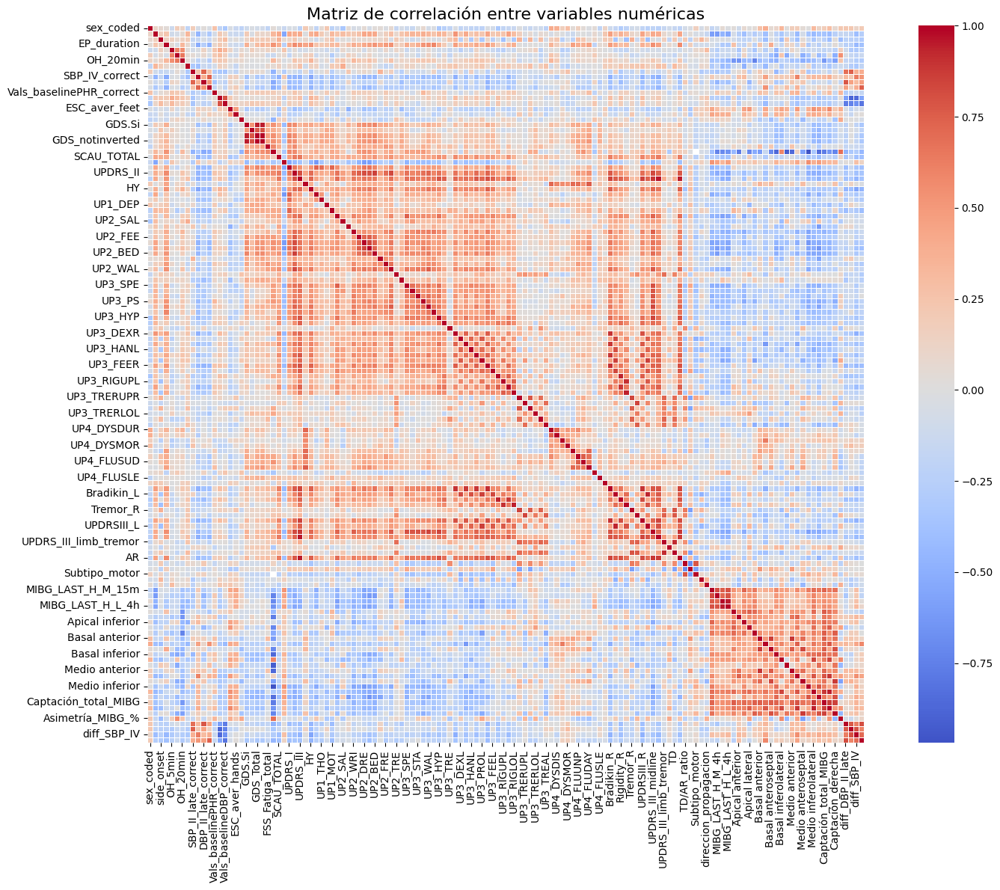

In [ ]:
# Selecciono solo columnas numéricas 
df_numericas = df.select_dtypes(include='number')
print(f"Variables numéricas seleccionadas: {df_numericas.shape[1]}")


# Matriz de correlación
matriz_corr = df_numericas.corr(method='pearson')

plt.figure(figsize=(16, 12))
sns.heatmap(matriz_corr, cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.title('Matriz de correlación entre variables numéricas', fontsize=16)
plt.tight_layout()
plt.show()


                Variable_1           Variable_2  Correlación
2680             GDS_Total      GDS_notinverted     1.000000
2813       GDS_notinverted            GDS_Total     1.000000
3817             UPDRS_III      UPDRS_III_limbs     0.955713
12662      UPDRS_III_limbs            UPDRS_III     0.955713
3821             UPDRS_III                   AR     0.953671
13194                   AR            UPDRS_III     0.953671
14469     MIBG_LAST_H_L_4h  MIBG_LAST_H_L_15min     0.950313
14336  MIBG_LAST_H_L_15min     MIBG_LAST_H_L_4h     0.950313
3180     LARS_apathy_Total       Medio inferior    -0.967498
16380       Medio inferior    LARS_apathy_Total    -0.967498
(9, 9)


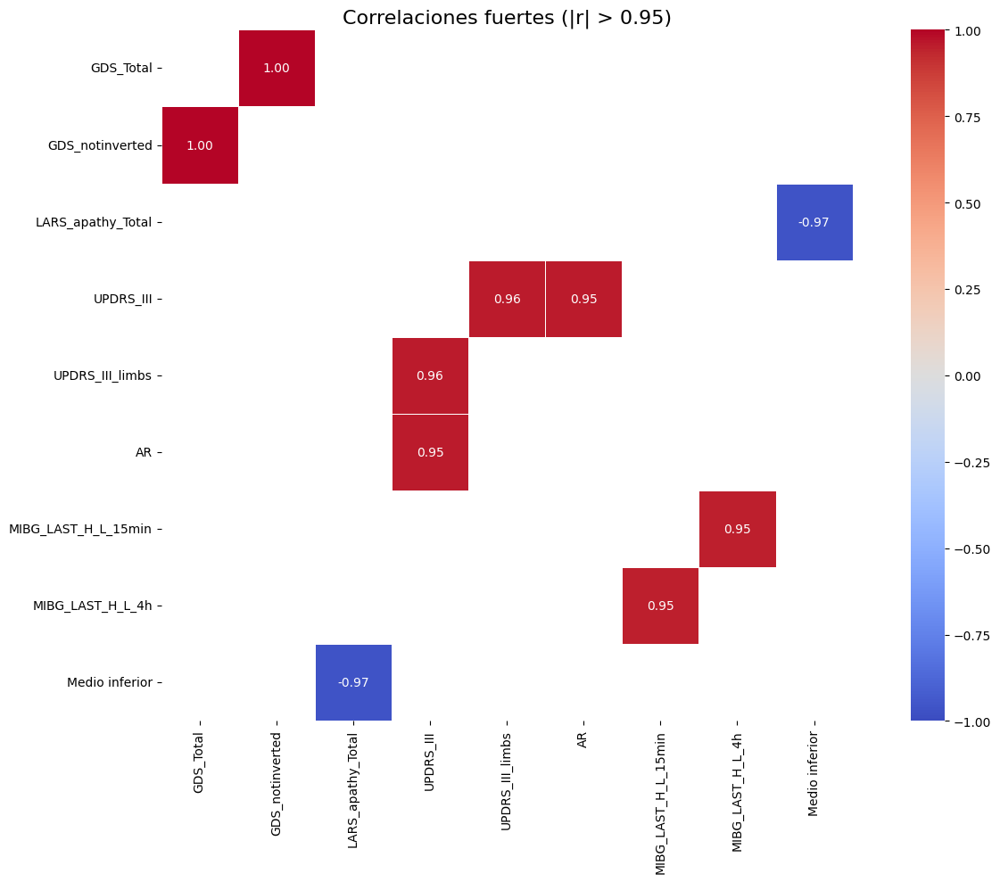

In [ ]:
# Correlaciones fuertes

correlaciones = (
    matriz_corr.where(~np.eye(matriz_corr.shape[0], dtype=bool))  # eliminar la diagonal
    .stack()
    .reset_index()
)
correlaciones.columns = ['Variable_1', 'Variable_2', 'Correlación']

correlaciones_fuertes = correlaciones[correlaciones['Correlación'].abs() > 0.95]
correlaciones_fuertes = correlaciones_fuertes.sort_values(by='Correlación', ascending=False)

print(correlaciones_fuertes.head(40))

# Correlaciones con |r| > 0.95
filtro_fuertes = matriz_corr.abs() > 0.95
np.fill_diagonal(filtro_fuertes.values, False)  # eliminamos la diagonal (siempre 1.0)
matriz_fuertes = matriz_corr.where(filtro_fuertes)

# Eliminar columnas y filas vacías
matriz_fuertes = matriz_fuertes.dropna(axis=0, how='all').dropna(axis=1, how='all')
print(np.shape(matriz_fuertes))

plt.figure(figsize=(14, 10))
sns.heatmap(matriz_fuertes, cmap='coolwarm', center=0, square=True, linewidths=0.5, annot=True, fmt=".2f", vmin=-1)
plt.title('Correlaciones fuertes (|r| > 0.95)', fontsize=16)
plt.tight_layout()
plt.show()

In [770]:
# Elimino columnas con correlaciones muy fuertes
cols_to_drop = [
    'GDS_notinverted', 'GDS.Si', 'UPDRS_III_limbs', 
    'UP3_RIGLOL', 'UP3_RIGUPR', 
    'UP3_FEER', 'UP3_RIGUPL'
]

cols_present = [col for col in cols_to_drop if col in df.columns]
df.drop(columns=cols_present, inplace=True)

print(f'Se han eliminado las columnas: {cols_present}')
print(f'Tamaño del DataFrame ahora: {df.shape}')

Se han eliminado las columnas: ['GDS_notinverted', 'GDS.Si', 'UPDRS_III_limbs', 'UP3_RIGLOL', 'UP3_RIGUPR', 'UP3_FEER', 'UP3_RIGUPL']
Tamaño del DataFrame ahora: (67, 135)


## EDA MIBG

In [771]:
# list(df.columns)

In [772]:
# Visualizar cómo se relacionan los valores de captación MIBG con síntomas autonómicos
captation_vars = [
    'MIBG_LAST_H_M_15m',
    'MIBG_LAST_H_M_4h',
    'MIBG_LAST_H_L_15min',
    'MIBG_LAST_H_L_4h'
]

In [773]:
autonomic_vars = [
    'OH_5min', 'OH_10min', 'OH_20min',
    'Vals_PRT_correct', 'ESC_aver_feet', 'ESC_aver_hands',
    'SBP_II_late_correct', 'SBP_IV_correct',
    'DBP_II_late_correct', 'DBP_IV_correct',
    'Vals_baselineSBP_correct', 'Vals_baselineDBP_correct',
    'Vals_PRT_correct', 
    'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV',
    'EI_ratio_correct',
    'FSS_Fatiga_total', 'SCAU_TOTAL'
]

In [774]:
vars_interes = captation_vars + autonomic_vars
mibg_vars = ['MIBG_LAST_H_M_15m', 'MIBG_LAST_H_M_4h', 'MIBG_LAST_H_L_15min', 'MIBG_LAST_H_L_4h']

# Filtrar pacientes que tienen datos de MIBG
df_mibg = df.dropna(subset=mibg_vars, how='any')

print(f"Número de pacientes con MIBG completo: {df_mibg.shape[0]}")


Número de pacientes con MIBG completo: 28


In [ ]:
cic_imagenes = df_resultados['CIC'].unique()

# Filtrar df solo para esos CIC
df_mibg = df[df['CIC'].isin(df_resultados['CIC'])].copy()

print(f"Número de pacientes con imágenes: {df_mibg['CIC'].nunique()}")


Número de pacientes con imágenes: 24


In [776]:
df_mibg.shape

(24, 135)

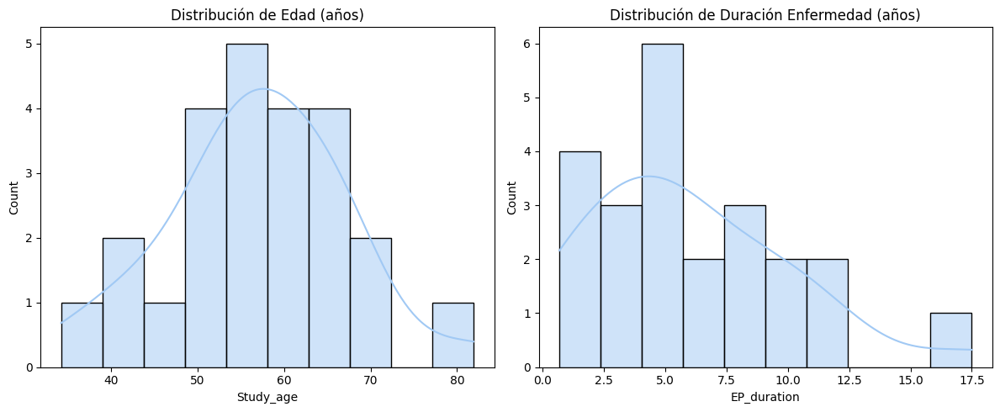

In [ ]:
# Distribución de edad y duración de enfermedad
fig, axs = plt.subplots(1, 2, figsize=(12,5))

sns.histplot(df_mibg['Study_age'], bins=10, ax=axs[0], kde=True)
axs[0].set_title('Distribución de Edad (años)')

sns.histplot(df_mibg['EP_duration'], bins=10, ax=axs[1], kde=True)
axs[1].set_title('Distribución de Duración Enfermedad (años)')

plt.tight_layout()
plt.show()


In [778]:
print("Frecuencia de edad")
print(df_mibg['Study_age'].value_counts(bins=10, sort=False))

print("\nFrecuencia de duración de enfermedad")
print(df_mibg['EP_duration'].value_counts(bins=10, sort=False))


Frecuencia de edad
(34.151, 38.97]    1
(38.97, 43.74]     2
(43.74, 48.51]     1
(48.51, 53.28]     4
(53.28, 58.05]     5
(58.05, 62.82]     4
(62.82, 67.59]     4
(67.59, 72.36]     2
(72.36, 77.13]     0
(77.13, 81.9]      1
Name: count, dtype: int64

Frecuencia de duración de enfermedad
(0.682, 2.38]     4
(2.38, 4.06]      3
(4.06, 5.74]      6
(5.74, 7.42]      2
(7.42, 9.1]       3
(9.1, 10.78]      2
(10.78, 12.46]    2
(12.46, 14.14]    0
(14.14, 15.82]    0
(15.82, 17.5]     1
Name: count, dtype: int64


In [779]:
# Bins absolutos desde 30 hasta 85 de 5 en 5 para la edad
bins_age = list(range(30, 90, 5))  # 30, 35, ..., 85
df_mibg['Edad_5y_bin'] = pd.cut(df_mibg['Study_age'], bins=bins_age, right=False)

# Bins para duración de enfermedad (DE 5 EN 5)
bins_duration = list(range(0, 25, 5))  # 0, 5, 10, 15, 20
df_mibg['EP_duration_5y_bin'] = pd.cut(df_mibg['EP_duration'], bins=bins_duration, right=False)

print("Frecuencia por intervalos de edad (desde 30)")
print(df_mibg['Edad_5y_bin'].value_counts().sort_index())

print("\nFrecuencia por duración de enfermedad (desde 0)")
print(df_mibg['EP_duration_5y_bin'].value_counts().sort_index())

Frecuencia por intervalos de edad (desde 30)
Edad_5y_bin
[30, 35)    1
[35, 40)    0
[40, 45)    2
[45, 50)    1
[50, 55)    5
[55, 60)    6
[60, 65)    3
[65, 70)    5
[70, 75)    0
[75, 80)    0
[80, 85)    1
Name: count, dtype: int64

Frecuencia por duración de enfermedad (desde 0)
EP_duration_5y_bin
[0, 5)      12
[5, 10)      7
[10, 15)     3
[15, 20)     1
Name: count, dtype: int64


In [780]:
df_mibg['EP_duration'].isna().sum()

np.int64(1)

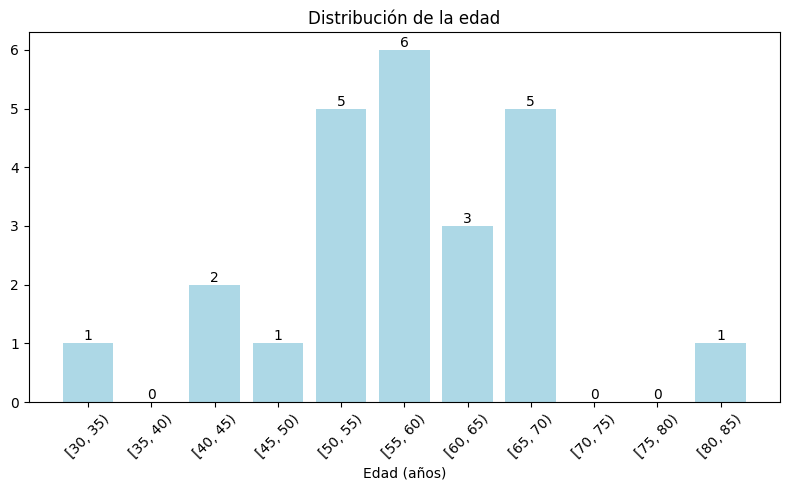

In [781]:
fig, ax = plt.subplots(figsize=(8,5))

# Edad 
edad_counts = df_mibg['Edad_5y_bin'].value_counts().sort_index()

color_edad = '#add8e6'

bars = ax.bar(edad_counts.index.astype(str), edad_counts.values, color=color_edad)
ax.set_title('Distribución de la edad')
ax.set_xlabel('Edad (años)')
ax.tick_params(axis='x', rotation=45)

# Añadir número encima de cada barra
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height - 0.0, 
            int(height), ha='center', va='bottom')

plt.tight_layout()
plt.show()



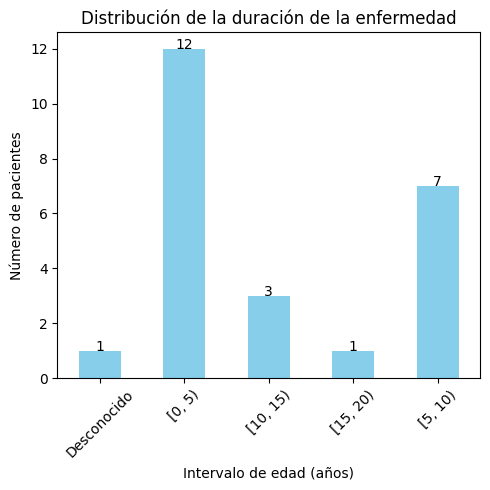

In [ ]:
duraciones = df_mibg['EP_duration']
bins = [0, 5, 10, 15, 20]
labels = ['[0, 5)', '[5, 10)', '[10, 15)', '[15, 20)']

# Clasificar en intervalos
duracion_categorizada = pd.cut(duraciones, bins=bins, labels=labels)

# Reemplazar los NaN por 'Desconocido'
duracion_categorizada = duracion_categorizada.astype(object).fillna('Desconocido')

# Contar frecuencias
frecuencias = duracion_categorizada.value_counts().sort_index()

plt.figure(figsize=(5,5))
ax = frecuencias.plot(kind='bar', color='skyblue')
plt.title('Distribución de la duración de la enfermedad')
plt.xlabel('Intervalo de edad (años)')
plt.ylabel('Número de pacientes')
plt.xticks(rotation=45)

# Añadir número encima de cada barra
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2., height + 0.0,  
            int(height), ha="center")

plt.tight_layout()
plt.show()


C:\Users\angel\AppData\Local\Temp\ipykernel_11116\3452670853.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=sex_counts.index, y=sex_counts.values, palette='pastel')


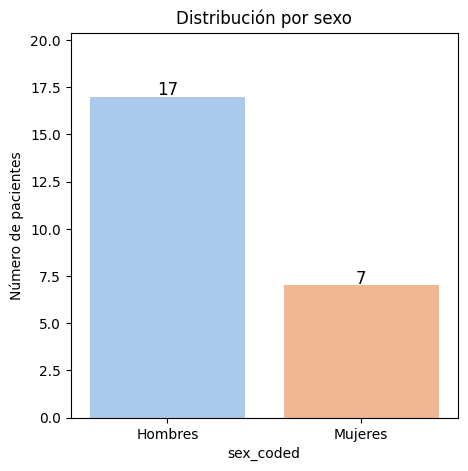

In [783]:
sex_counts = df_mibg['sex_coded'].value_counts().sort_index()

plt.figure(figsize=(5,5))
ax = sns.barplot(x=sex_counts.index, y=sex_counts.values, palette='pastel')
plt.xticks([0,1], ['Hombres', 'Mujeres'])
plt.ylabel('Número de pacientes')
plt.title('Distribución por sexo')

# Añadir números encima de cada barra
for i, v in enumerate(sex_counts.values):
    ax.text(i, v + 0.1, str(v), ha='center', fontsize=12)

plt.ylim(0, max(sex_counts.values)*1.2)  # un poco de espacio arriba para los números
plt.show()


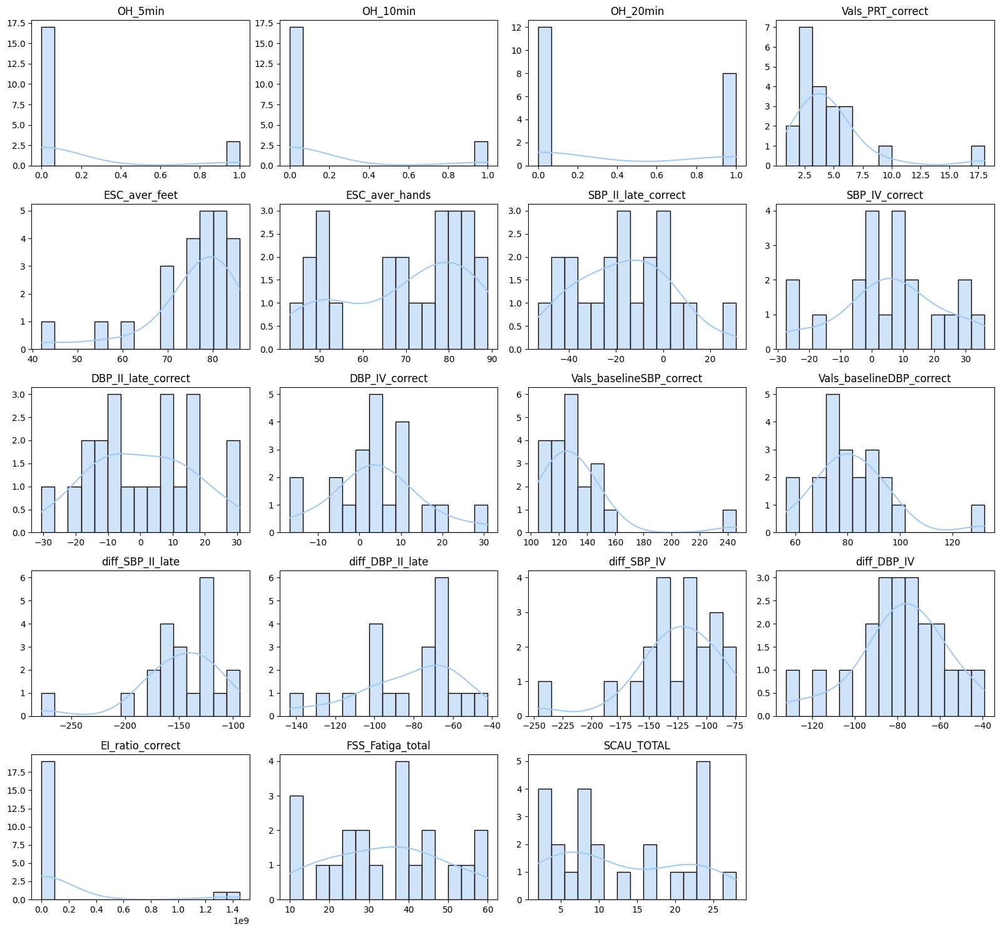

In [784]:
# DISTRIBUCION DE VARIABLES
autonomic_vars = [
    'OH_5min', 'OH_10min', 'OH_20min',
    'Vals_PRT_correct', 'ESC_aver_feet', 'ESC_aver_hands',
    'SBP_II_late_correct', 'SBP_IV_correct',
    'DBP_II_late_correct', 'DBP_IV_correct',
    'Vals_baselineSBP_correct', 'Vals_baselineDBP_correct',
    'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV',
    'EI_ratio_correct',
    'FSS_Fatiga_total', 'SCAU_TOTAL'
]

n_vars = len(autonomic_vars)
n_cols = 4
n_rows = (n_vars + n_cols - 1) // n_cols

plt.figure(figsize=(4*n_cols, 3*n_rows))

for i, var in enumerate(autonomic_vars):
    plt.subplot(n_rows, n_cols, i+1)
    sns.histplot(df_mibg[var].dropna(), kde=True, bins=15)
    plt.title(var)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()


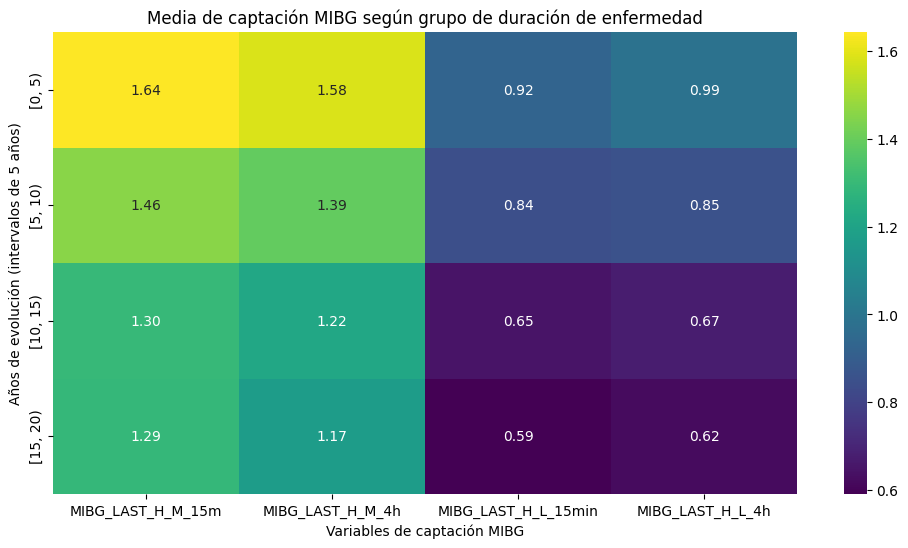

In [785]:
# CAPTACION MIBG FRENTE A DURACIÓN DE LA ENFERMEDAD
# Variables de captación MIBG
captation_vars = ['MIBG_LAST_H_M_15m', 'MIBG_LAST_H_M_4h', 'MIBG_LAST_H_L_15min', 'MIBG_LAST_H_L_4h']
mean_by_duration = df_mibg.groupby('EP_duration_5y_bin', observed=False)[captation_vars].mean() # Agrupo por bins de duracion

plt.figure(figsize=(12, 6))
sns.heatmap(mean_by_duration, annot=True, fmt=".2f", cmap='viridis')
plt.title('Media de captación MIBG según grupo de duración de enfermedad')
plt.ylabel('Años de evolución (intervalos de 5 años)')
plt.xlabel('Variables de captación MIBG')
plt.show()


In [786]:
print(mean_by_duration.round(3))

                    MIBG_LAST_H_M_15m  MIBG_LAST_H_M_4h  MIBG_LAST_H_L_15min  \
EP_duration_5y_bin                                                             
[0, 5)                          1.643             1.582                0.924   
[5, 10)                         1.456             1.391                0.843   
[10, 15)                        1.297             1.217                0.647   
[15, 20)                        1.290             1.170                0.590   

                    MIBG_LAST_H_L_4h  
EP_duration_5y_bin                    
[0, 5)                         0.985  
[5, 10)                        0.855  
[10, 15)                       0.673  
[15, 20)                       0.620  


C:\Users\angel\AppData\Local\Temp\ipykernel_11116\1599977780.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_segment_by_duration = df_mibg.groupby('EP_duration_5y_bin')[segmentos].mean()


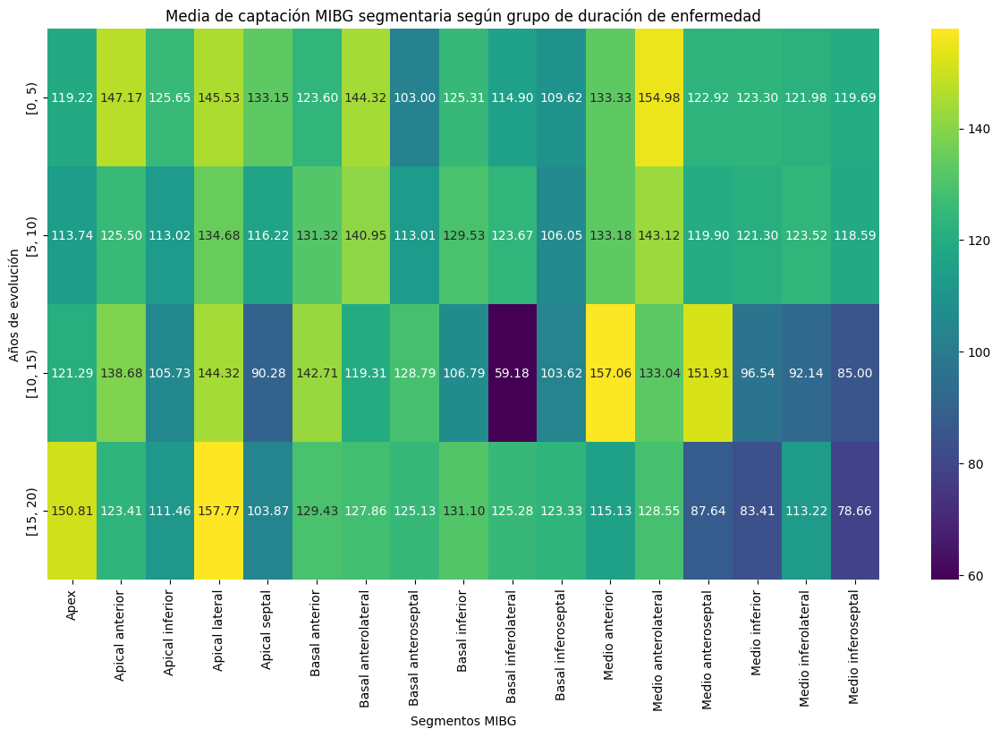

In [787]:
# Mismo pero con segmentos de captación
segmentos = ['Apex','Apical anterior','Apical inferior','Apical lateral','Apical septal',
             'Basal anterior','Basal anterolateral','Basal anteroseptal','Basal inferior',
             'Basal inferolateral','Basal inferoseptal','Medio anterior','Medio anterolateral',
             'Medio anteroseptal','Medio inferior','Medio inferolateral','Medio inferoseptal']

mean_segment_by_duration = df_mibg.groupby('EP_duration_5y_bin')[segmentos].mean()

plt.figure(figsize=(15, 8))
sns.heatmap(mean_segment_by_duration, annot=True, fmt=".2f", cmap='viridis')
plt.title('Media de captación MIBG segmentaria según grupo de duración de enfermedad')
plt.ylabel('Años de evolución')
plt.xlabel('Segmentos MIBG')
plt.show()



In [788]:
mean_segments = df_mibg.groupby('EP_duration_5y_bin', observed=True)[segmentos].mean()
print(mean_segments)

                          Apex  Apical anterior  Apical inferior  \
EP_duration_5y_bin                                                 
[0, 5)              119.220667       147.170667       125.647167   
[5, 10)             113.738000       125.501571       113.022857   
[10, 15)            121.294000       138.676000       105.728000   
[15, 20)            150.807000       123.411000       111.462000   

                    Apical lateral  Apical septal  Basal anterior  \
EP_duration_5y_bin                                                  
[0, 5)                  145.526333     133.154917      123.597250   
[5, 10)                 134.677429     116.217571      131.323000   
[10, 15)                144.323333      90.283333      142.713333   
[15, 20)                157.772000     103.872000      129.429000   

                    Basal anterolateral  Basal anteroseptal  Basal inferior  \
EP_duration_5y_bin                                                            
[0, 5)            

In [789]:
df_mibg['TD/AR_ratio'].value_counts()

TD/AR_ratio
0.0    9
0.2    2
0.6    2
0.4    2
2.2    1
1.1    1
1.3    1
6.0    1
0.8    1
0.9    1
0.7    1
0.3    1
Name: count, dtype: int64

In [790]:
# Análisis con dominios clínicos y captación MIBG


# Variables MIBG que quieres analizar
captation_vars = ['MIBG_LAST_H_M_15m', 'MIBG_LAST_H_M_4h', 'MIBG_LAST_H_L_15min', 'MIBG_LAST_H_L_4h']

# Variables clínicas a analizar
clinical_vars = [
    'EP_duration' ,
    'UP4_FLUSLE',         
    'OH_5min', 'OH_10min', 'OH_20min',  
    'Vals_PRT_correct', 
    'ESC_aver_feet',  'ESC_aver_hands',   
    'FSS_Fatiga_total', 'SCAU_TOTAL',  
    'MoCA_TOTAL',        
    'GDS_Total',          
    'side_onset',         
    'more_affected',     
    'TD/AR_ratio',       
    'SBP_II_late_correct', 'SBP_IV_correct',
    'DBP_II_late_correct', 'DBP_IV_correct',
    'Vals_baselineSBP_correct', 'Vals_baselineDBP_correct',
    'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV',
    'EI_ratio_correct',
    'UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY',
    'Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L', 'UPDRSIII_R', 'UPDRSIII_L',
    'LARS_apathy_Total'    
]

bins_duration = [0, 3, 6, 20]
labels_duration = ['0-3', '3-6', '>6']

bins_TDAR = [0, 0.8, 1.2, 10]  
labels_TDAR = ['Akinética', 'Indeterminado', 'Tremor dominante']

df_analyze = df_mibg.copy()

df_analyze['EP_duration_group'] = pd.cut(df_analyze['EP_duration'], bins=bins_duration, labels=labels_duration, right=False)
df_analyze['TD_AR_group'] = pd.cut(df_analyze['TD/AR_ratio'], bins=bins_TDAR, labels=labels_TDAR, right=False)

df_analyze['RBD_group'] = df_analyze['UP4_FLUSLE'].apply(lambda x: 'Presente' if x == 1 else 'Ausente')

grouping_vars = ['EP_duration_group', 'RBD_group', 'side_onset', 'more_affected', 'TD_AR_group']

for var in ['OH_5min', 'ESC_aver_feet', 'FSS_Fatiga_total', 'MoCA_TOTAL', 'GDS_Total']:
    # hacer qcut sin labels para evitar error
    grouped, bins = pd.qcut(df_analyze[var], q=4, duplicates='drop', retbins=True)
    df_analyze[var+'_group'] = grouped
    grouping_vars.append(var+'_group')
    

# for var in grouping_vars:
#     print(f'\n\n=== Agrupación por {var} ===')
#     mean_vals = df_analyze.groupby(var, observed=True)[captation_vars].mean()
#     print(mean_vals)



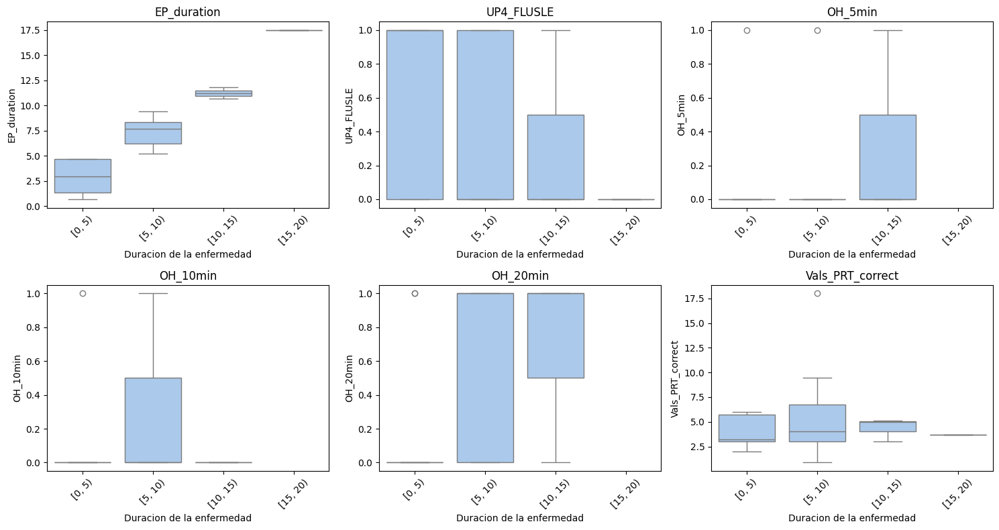

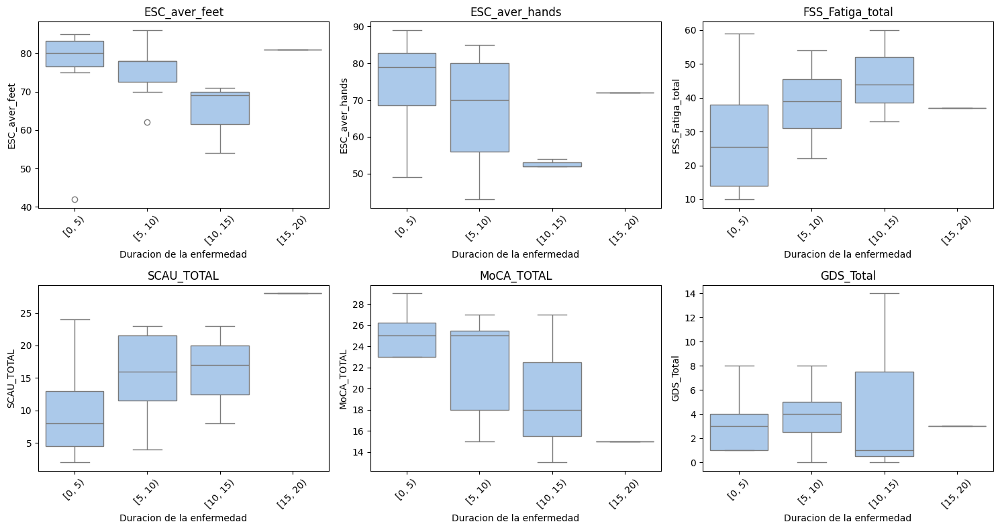

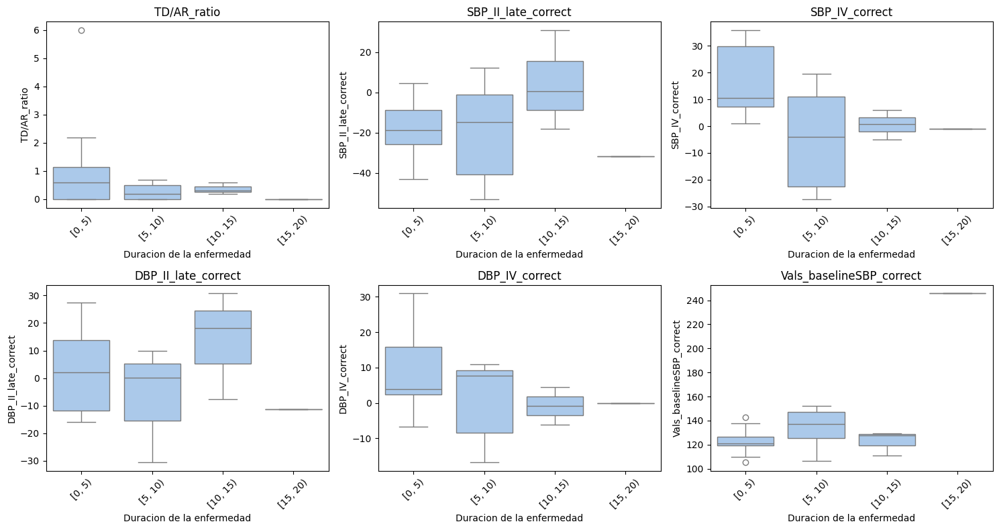

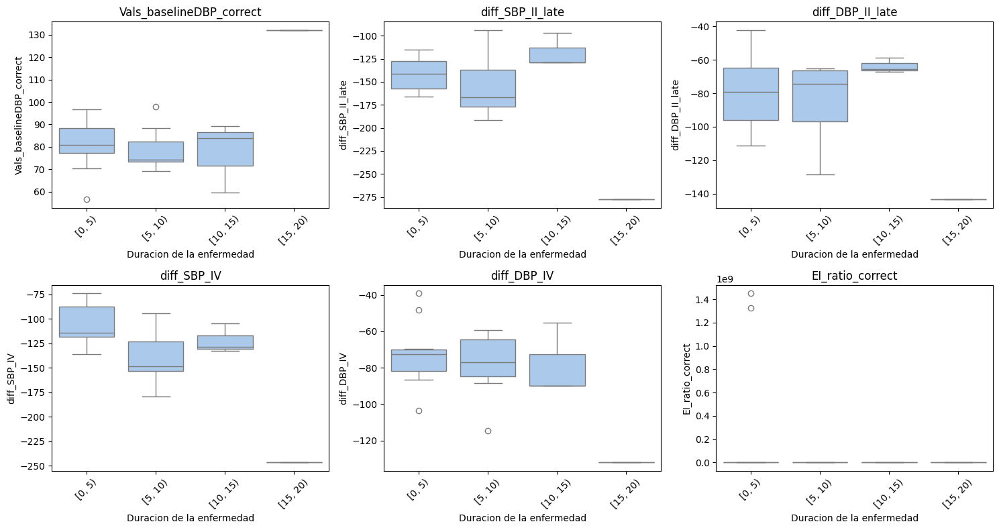

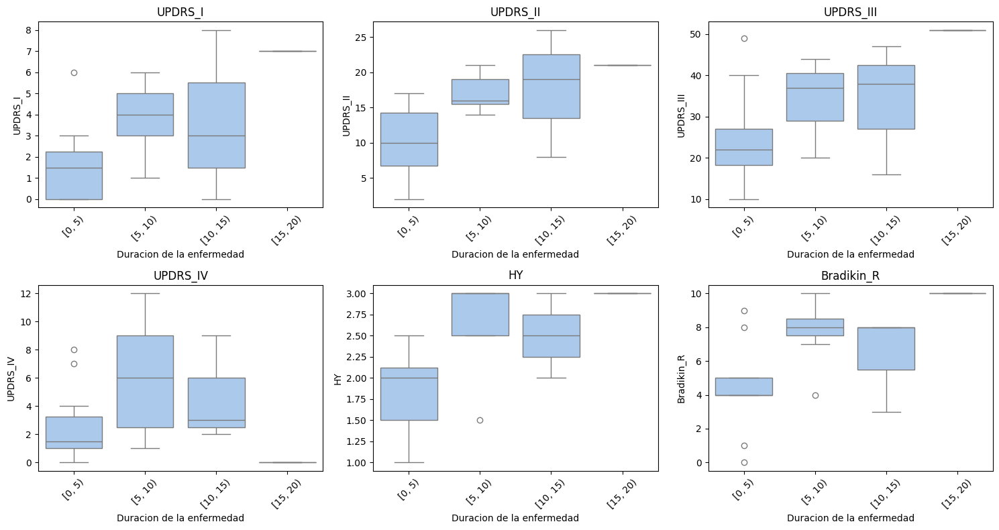

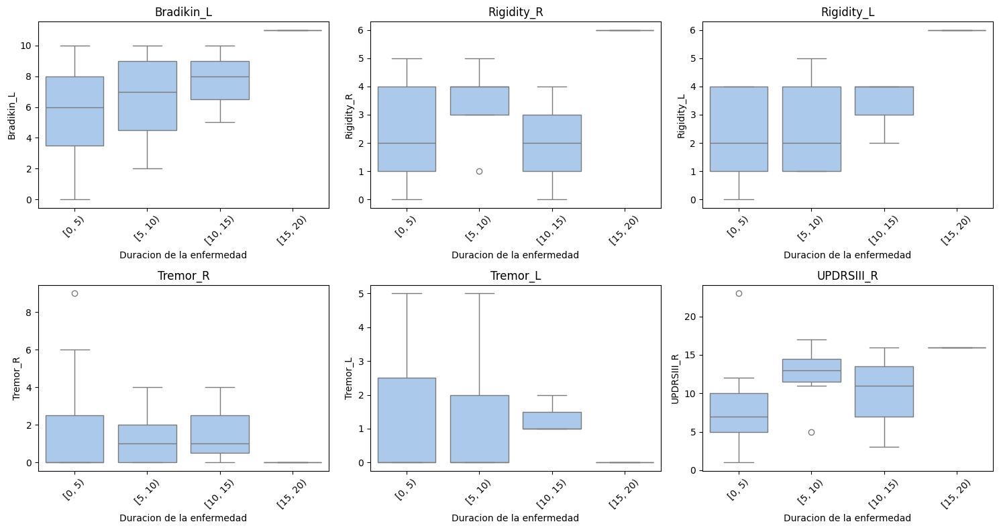

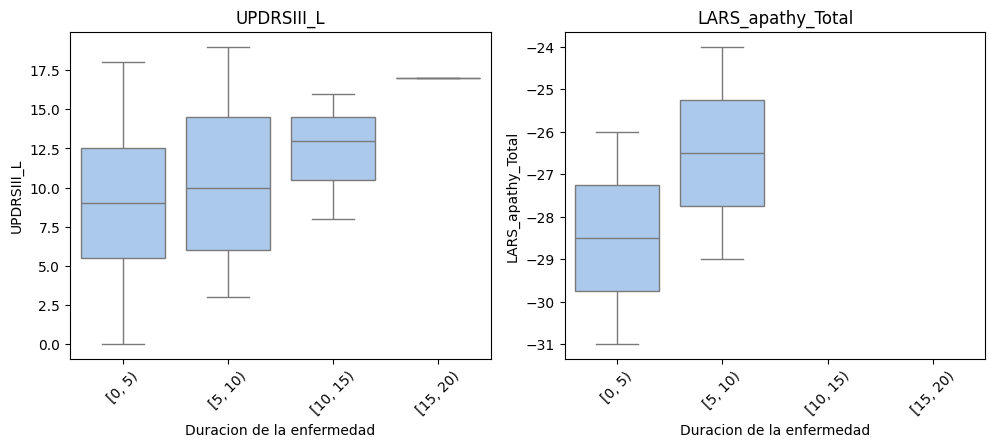

In [791]:
# VISUALIZACION DE VARIABLES CLINICAS QUE VARIAN DE FORMA MAS RELEVANTE CON RESPECTO A LA DURACION DE LA ENFERMEDAD

sns.set_palette("pastel")

clinical_vars = [
    'EP_duration', 'UP4_FLUSLE',
    'OH_5min', 'OH_10min', 'OH_20min', 'Vals_PRT_correct',
    'ESC_aver_feet', 'ESC_aver_hands',
    'FSS_Fatiga_total', 'SCAU_TOTAL',
    'MoCA_TOTAL', 'GDS_Total',
    'TD/AR_ratio',
    'SBP_II_late_correct', 'SBP_IV_correct',
    'DBP_II_late_correct', 'DBP_IV_correct',
    'Vals_baselineSBP_correct', 'Vals_baselineDBP_correct',
    'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV',
    'EI_ratio_correct',
    'UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY',
    'Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L', 'UPDRSIII_R', 'UPDRSIII_L',
    'LARS_apathy_Total'
]

group_var = 'EP_duration_5y_bin'  

vars_per_fig = 6

for i in range(0, len(clinical_vars), vars_per_fig):
    subset_vars = clinical_vars[i:i+vars_per_fig]
    plt.figure(figsize=(15, 8))
    for idx, var in enumerate(subset_vars, 1):
        plt.subplot(2, 3, idx)
        sns.boxplot(x=group_var, y=var, data=df_mibg)
        plt.xticks(rotation=45)
        plt.title(var)
        plt.xlabel('Duracion de la enfermedad')
    plt.tight_layout()
    plt.show()

In [792]:
group_var = 'EP_duration_5y_bin'
clinical_vars = [
    'EP_duration', 'UP4_FLUSLE', 'OH_5min', 'OH_10min', 'OH_20min',  
    'Vals_PRT_correct', 'ESC_aver_feet', 'ESC_aver_hands',    
    'FSS_Fatiga_total', 'SCAU_TOTAL', 'MoCA_TOTAL', 'GDS_Total',  
    'TD/AR_ratio', 'SBP_II_late_correct', 'SBP_IV_correct',
    'DBP_II_late_correct', 'DBP_IV_correct',
    'Vals_baselineSBP_correct', 'Vals_baselineDBP_correct',
    'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV',
    'EI_ratio_correct', 'UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY',
    'Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L',
    'UPDRSIII_R', 'UPDRSIII_L', 'LARS_apathy_Total'
]

for var in clinical_vars:
    stats_per_group = df_mibg.groupby(group_var, observed=False)[var].agg(
        count='count',
        mean='mean',
        median='median',
        std='std',
        min='min',
        Q1=lambda x: x.quantile(0.25),
        Q3=lambda x: x.quantile(0.75),
        max='max'
    )
# print(f"\nVariable: {var}\n", stats_per_group)



In [793]:
# # Lista de variables agrupadas que ya tienes (categorías creadas con qcut o binning)
variables_categorizadas = ['RBD_group', 'OH_5min_group', 'ESC_aver_feet_group',
                           'FSS_Fatiga_total_group', 'MoCA_TOTAL_group', 'GDS_Total_group']



In [794]:
# for var in variables_categorizadas:
#     print(f'\nEstadísticos de MIBG_LAST_H_M_4h por {var}')
#     grouped = df_analyze.groupby(var)['MIBG_LAST_H_M_4h']
#     stats = grouped.describe()  # count, mean, std, min, 25%, 50%, 75%, max
#     print(stats)

## 3- MODELOS DE APRENDIZAJE NO SUPERVISADO

### 3.1- PCA POR DOMINIOS

In [795]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


dominios = {
    'Lateralidad_y_Fenotipo': ['side_onset', 'more_affected', 'TD', 'AR', 'TD/AR', 'TD/AR_ratio'],
    'UPDRS_HY': ['UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY'],
    'Sintomas_Motores_Laterales': ['Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L', 'UPDRSIII_R', 'UPDRSIII_L'],
    'SNAS': ['OH_5min', 'OH_10min', 'OH_20min', 'ESC_aver_feet', 'ESC_aver_hands', 'Vals_PRT_correct', 'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV'],
    'SNAP': ['EI_ratio_correct'],  # No PCA, solo una variable
    'Sintomas_Mixtos': ['FSS_Fatiga_total', 'SCAU_TOTAL'], # No PCA, solo dos variables
    'Neuropsiquiatria_Cognicion': ['GDS_Total', 'LARS_apathy_Total', 'MoCA_TOTAL'], # No PCA, solo 3 variables
    'RBD': ['UP4_FLUSLE'],  # No PCA, solo una variable
    'MIBG_Global': ['Captación_total_MIBG', 'MIBG_LAST_H_M_4h'], # No PCA, solo dos variables
    'MIBG_segmentos': ['Apex','Apical anterior', 'Apical inferior', 'Apical lateral', 'Apical septal', 'Basal anterior', 'Basal anterolateral', 'Basal anteroseptal', 'Basal inferior', 'Basal inferolateral', 'Basal inferoseptal',
                       'Medio anterior', 'Medio anterolateral', 'Medio anteroseptal','Medio inferior', 'Medio inferolateral', 'Medio inferoseptal']
}


resultados_pca = {}

for dominio, variables in dominios.items():
    # Quitamos filas con NA solo para las variables de ese dominio
    X = df[variables].dropna()
    
    if len(variables) < 4:
        # No PCA, usamos variables originales
        resultados_pca[dominio] = X
        print(f"No PCA para dominio '{dominio}' (pocas variables, usar originales).")
    else:
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA()
        pca.fit(X_scaled)
        
        varianza_acum = np.cumsum(pca.explained_variance_ratio_)
        n_comp = np.searchsorted(varianza_acum, 0.8) + 1  # componentes para 80% varianza
        
        print(f"Dominio {dominio}: usar {n_comp} componentes para explicar {varianza_acum[n_comp-1]:.2f} de varianza acumulada")
        
        componentes = pca.transform(X_scaled)[:, :n_comp]
        columnas_pc = [f"{dominio}_PC{i+1}" for i in range(n_comp)]
        df_pca = pd.DataFrame(componentes, index=X.index, columns=columnas_pc)
        resultados_pca[dominio] = df_pca

# Combinar todo
df_pca_total = pd.concat(resultados_pca.values(), axis=1)
print(df_pca_total.head())


Dominio Lateralidad_y_Fenotipo: usar 4 componentes para explicar 0.93 de varianza acumulada
Dominio UPDRS_HY: usar 2 componentes para explicar 0.80 de varianza acumulada
Dominio Sintomas_Motores_Laterales: usar 3 componentes para explicar 0.88 de varianza acumulada
Dominio SNAS: usar 5 componentes para explicar 0.83 de varianza acumulada
No PCA para dominio 'SNAP' (pocas variables, usar originales).
No PCA para dominio 'Sintomas_Mixtos' (pocas variables, usar originales).
No PCA para dominio 'Neuropsiquiatria_Cognicion' (pocas variables, usar originales).
No PCA para dominio 'RBD' (pocas variables, usar originales).
No PCA para dominio 'MIBG_Global' (pocas variables, usar originales).
Dominio MIBG_segmentos: usar 4 componentes para explicar 0.81 de varianza acumulada
   Lateralidad_y_Fenotipo_PC1  Lateralidad_y_Fenotipo_PC2  \
0                    0.846343                    0.128593   
2                   -1.125779                   -0.018620   
4                   -0.306580          


Dominio: Lateralidad_y_Fenotipo
Para retener al menos 80% de varianza, necesitas 4 componentes.


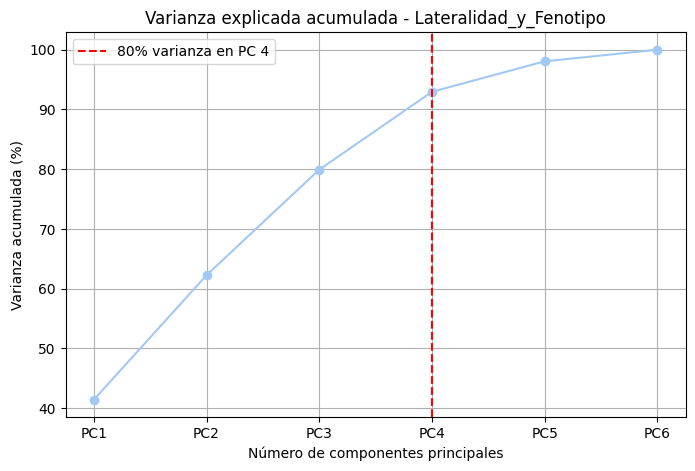

Varianza explicada por componente:
PC1: 0.414
PC2: 0.208
PC3: 0.177
PC4: 0.130
PC5: 0.051
PC6: 0.019

Dominio: UPDRS_HY
Para retener al menos 80% de varianza, necesitas 2 componentes.


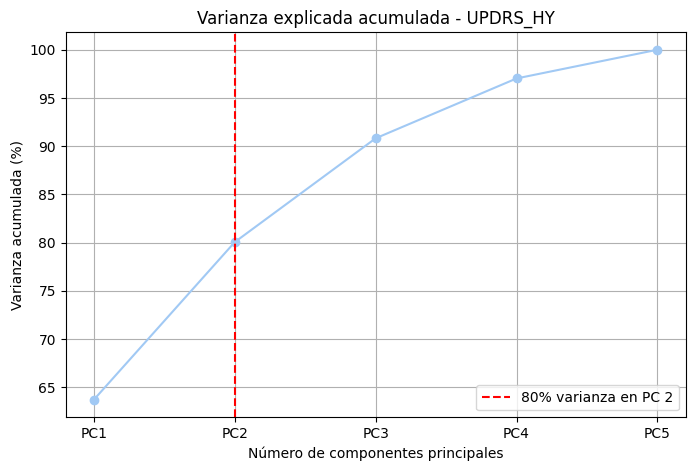

Varianza explicada por componente:
PC1: 0.637
PC2: 0.163
PC3: 0.108
PC4: 0.062
PC5: 0.030

Dominio: Sintomas_Motores_Laterales
Para retener al menos 80% de varianza, necesitas 3 componentes.


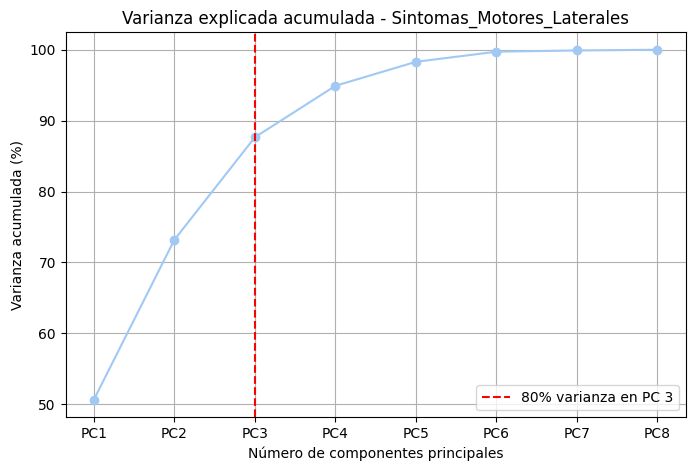

Varianza explicada por componente:
PC1: 0.506
PC2: 0.226
PC3: 0.145
PC4: 0.073
PC5: 0.034
PC6: 0.014
PC7: 0.002
PC8: 0.001

Dominio: SNAS
Para retener al menos 80% de varianza, necesitas 5 componentes.


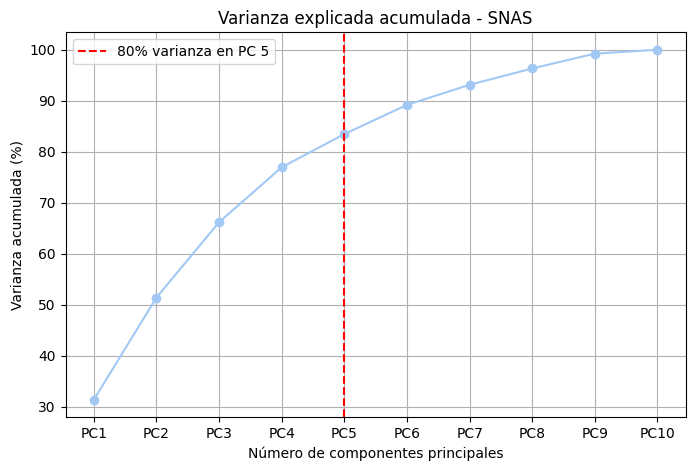

Varianza explicada por componente:
PC1: 0.313
PC2: 0.200
PC3: 0.148
PC4: 0.108
PC5: 0.065
PC6: 0.057
PC7: 0.039
PC8: 0.032
PC9: 0.029
PC10: 0.008
No se aplica PCA para SNAP (menos de 4 variables).
No se aplica PCA para Sintomas_Mixtos (menos de 4 variables).
No se aplica PCA para Neuropsiquiatria_Cognicion (menos de 4 variables).
No se aplica PCA para RBD (menos de 4 variables).
No se aplica PCA para MIBG_Global (menos de 4 variables).

Dominio: MIBG_segmentos
Para retener al menos 80% de varianza, necesitas 4 componentes.


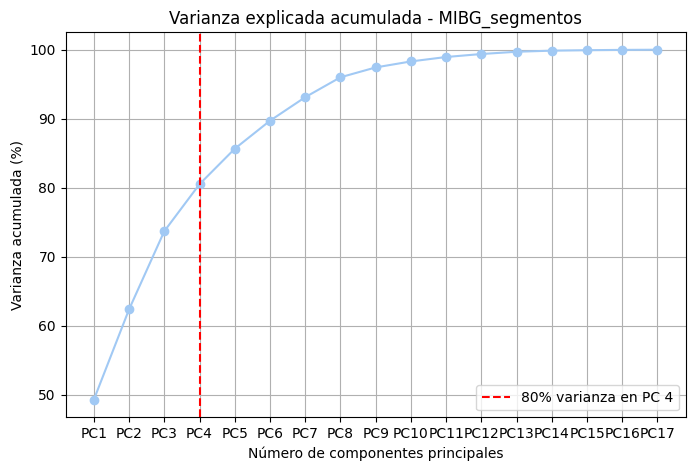

Varianza explicada por componente:
PC1: 0.493
PC2: 0.131
PC3: 0.113
PC4: 0.068
PC5: 0.051
PC6: 0.041
PC7: 0.034
PC8: 0.029
PC9: 0.014
PC10: 0.009
PC11: 0.006
PC12: 0.004
PC13: 0.003
PC14: 0.002
PC15: 0.001
PC16: 0.000
PC17: 0.000


In [796]:
umbrales = [0.8]

for dominio, variables in dominios.items():
    if len(variables) < 4:
        print(f"No se aplica PCA para {dominio} (menos de 4 variables).")
        continue

    print(f"\nDominio: {dominio}")
    X = df[variables].dropna()
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA()
    pca.fit(X_scaled)

    var_acum = np.cumsum(pca.explained_variance_ratio_)
    
    plt.figure(figsize=(8,5))
    plt.plot(var_acum*100, marker='o')
    plt.xlabel('Número de componentes principales')
    plt.ylabel('Varianza acumulada (%)')
    plt.title(f'Varianza explicada acumulada - {dominio}')
    plt.xticks(ticks=range(len(var_acum)), labels=[f'PC{i+1}' for i in range(len(var_acum))])
    
    for umbral in umbrales:
        n_comp = np.argmax(var_acum >= umbral) + 1
        print(f"Para retener al menos {int(umbral*100)}% de varianza, necesitas {n_comp} componentes.")
        plt.axvline(x=n_comp-1, color='r', linestyle='--', label=f'{int(umbral*100)}% varianza en PC {n_comp}')
    
    plt.legend()
    plt.grid(True)
    plt.show()
    
    print("Varianza explicada por componente:")
    for i, var in enumerate(pca.explained_variance_ratio_):
        print(f"PC{i+1}: {var:.3f}")


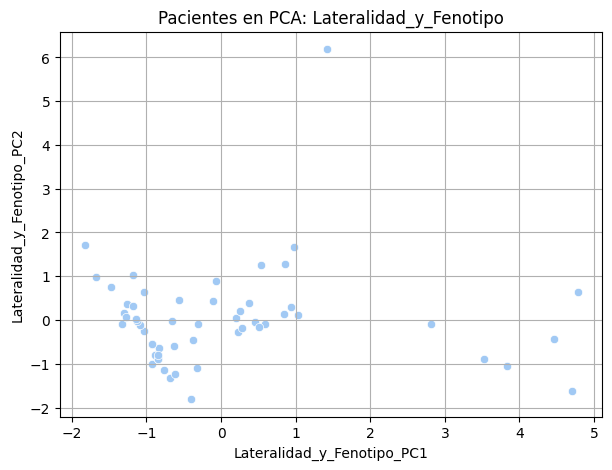

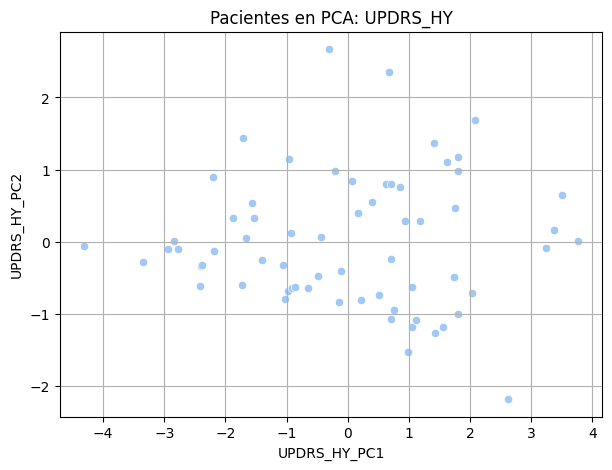

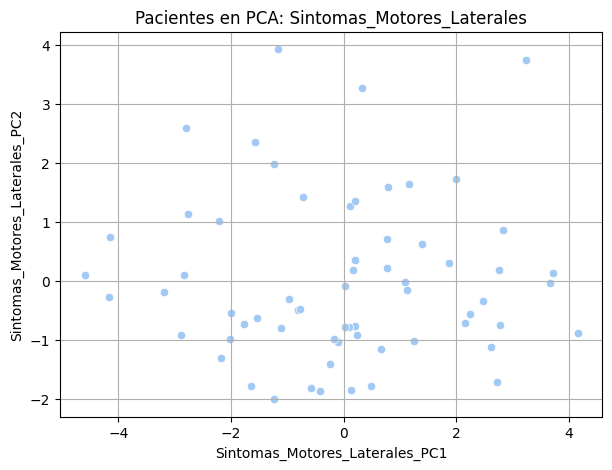

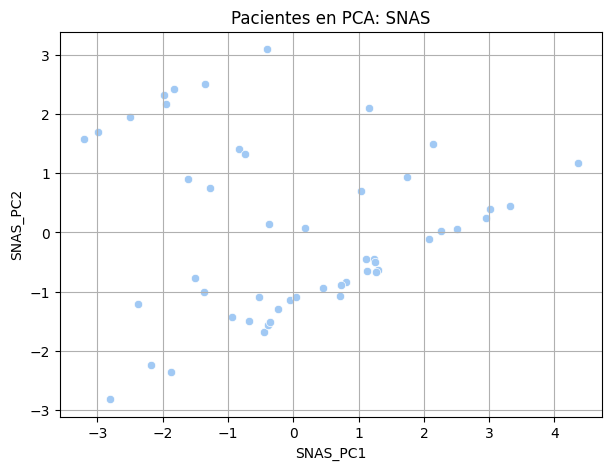

Dominio SNAP no tiene suficientes PCs para scatterplot.


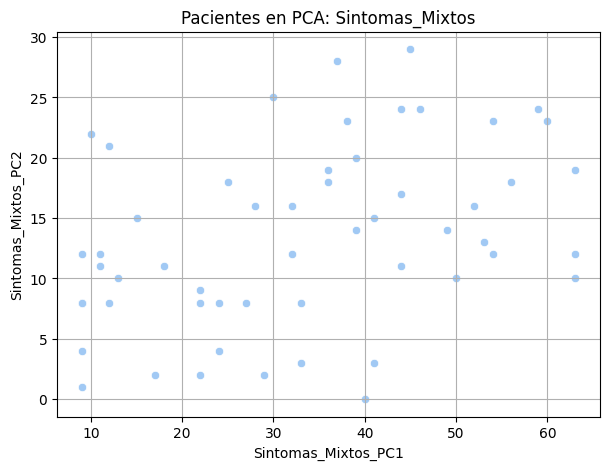

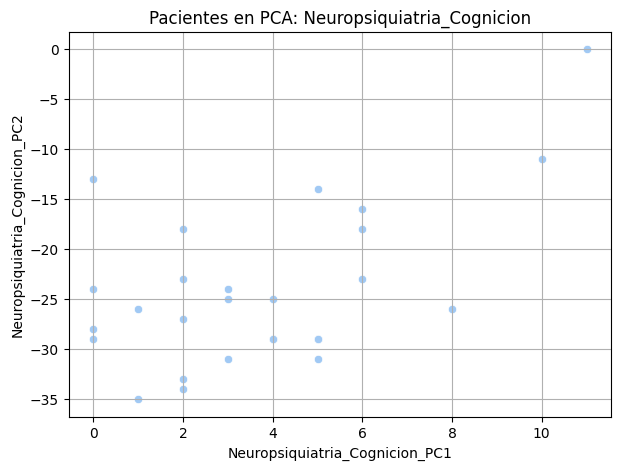

Dominio RBD no tiene suficientes PCs para scatterplot.


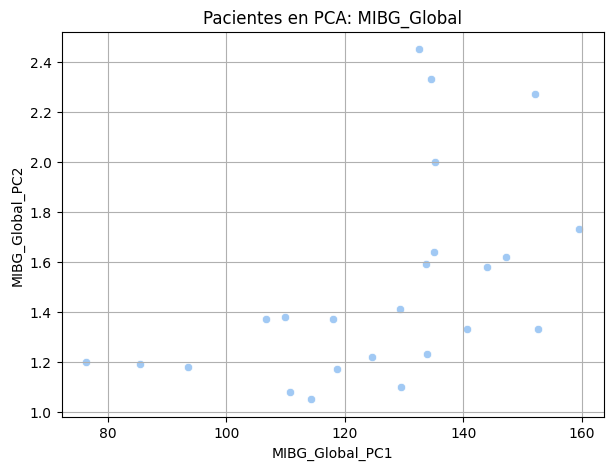

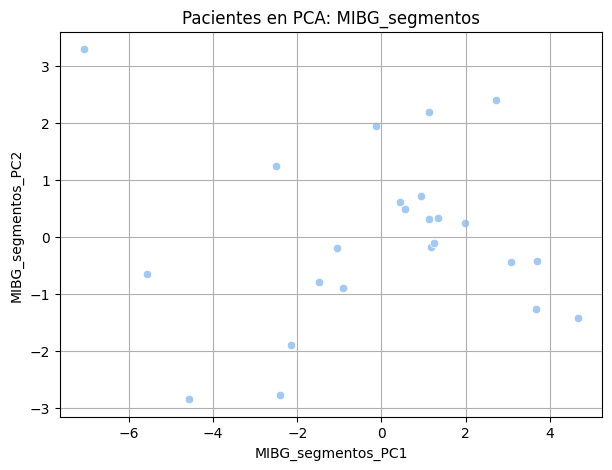

In [797]:
# Visualizar los primeros 2 PCs de cada dominio con PCA
for dominio, df_pca_dom in resultados_pca.items():
    # Saltar dominios sin PCA
    if isinstance(df_pca_dom, pd.Series) or df_pca_dom.shape[1] < 2:
        print(f"Dominio {dominio} no tiene suficientes PCs para scatterplot.")
        continue
    
    plt.figure(figsize=(7,5))
    sns.scatterplot(x=df_pca_dom.iloc[:,0], y=df_pca_dom.iloc[:,1])
    plt.title(f'Pacientes en PCA: {dominio}')
    plt.xlabel(f'{dominio}_PC1')
    plt.ylabel(f'{dominio}_PC2')
    plt.grid(True)
    plt.show()


Dominio: Lateralidad_y_Fenotipo
Se retienen 4 componentes para explicar 0.93 de varianza acumulada
Cargas principales:
                    PC1       PC2       PC3       PC4
side_onset     0.192060 -0.419364  0.533233  0.700965
more_affected  0.055920  0.678672 -0.323242  0.603486
TD             0.514260  0.334000  0.281167 -0.043674
AR            -0.173128  0.472260  0.717920 -0.276472
TD/AR         -0.549672  0.157328  0.098370  0.232773
TD/AR_ratio    0.602835  0.064810 -0.083882 -0.109203


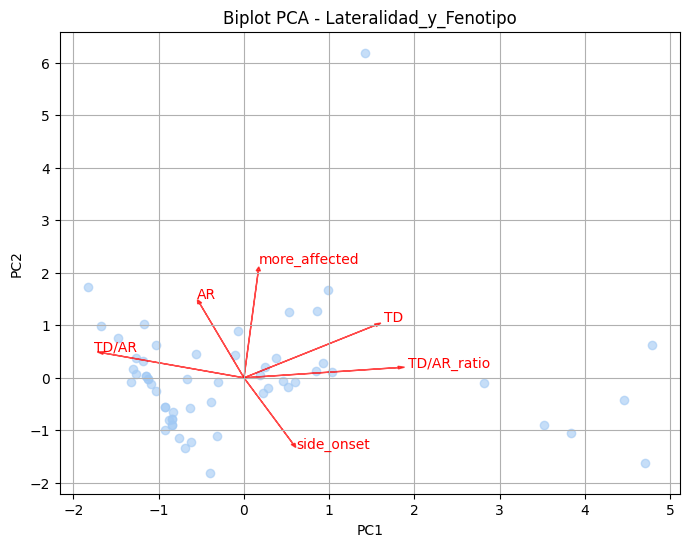


Dominio: UPDRS_HY
Se retienen 2 componentes para explicar 0.80 de varianza acumulada
Cargas principales:
                PC1       PC2
UPDRS_I    0.420025 -0.263975
UPDRS_II   0.517972 -0.080635
UPDRS_III  0.490144 -0.235316
UPDRS_IV   0.294661  0.931800
HY         0.477722 -0.013783


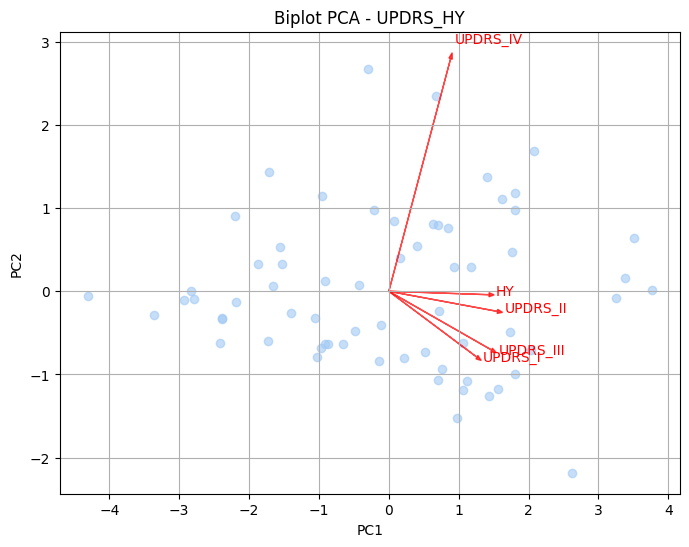


Dominio: Sintomas_Motores_Laterales
Se retienen 3 componentes para explicar 0.88 de varianza acumulada
Cargas principales:
                 PC1       PC2       PC3
Bradikin_R  0.387932  0.285168 -0.166457
Bradikin_L  0.407457 -0.333550 -0.066816
Rigidity_R  0.381162  0.307216 -0.227926
Rigidity_L  0.380660 -0.264975 -0.201509
Tremor_R    0.114023  0.489056  0.589731
Tremor_L    0.195001 -0.299316  0.719255
UPDRSIII_R  0.406300  0.416801  0.014514
UPDRSIII_L  0.420945 -0.374622  0.099745


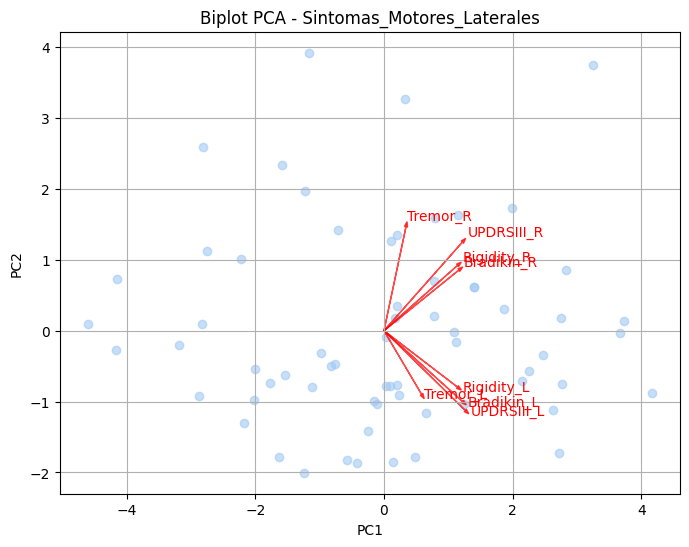


Dominio: SNAS
Se retienen 5 componentes para explicar 0.83 de varianza acumulada
Cargas principales:
                       PC1       PC2       PC3       PC4       PC5
OH_5min          -0.237968  0.515099  0.060091  0.076315  0.018833
OH_10min         -0.277487  0.522294 -0.075290 -0.032922 -0.102217
OH_20min         -0.286846  0.472231  0.090268 -0.137886  0.083933
ESC_aver_feet    -0.118831 -0.048234  0.608034  0.294920  0.649242
ESC_aver_hands   -0.064203 -0.093801  0.687943  0.028747 -0.481369
Vals_PRT_correct -0.187889 -0.119348 -0.300957  0.722542  0.122210
diff_SBP_II_late  0.450569  0.204667 -0.084158 -0.211290  0.372527
diff_DBP_II_late  0.400268  0.327494 -0.007542  0.369356 -0.003989
diff_SBP_IV       0.452525  0.124587  0.181953 -0.156960  0.138020
diff_DBP_IV       0.403163  0.221015  0.093695  0.398126 -0.395151


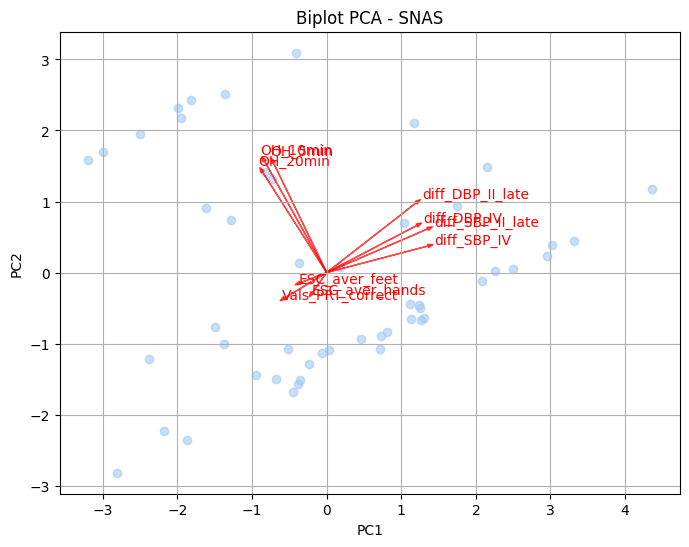


Dominio: MIBG_segmentos
Se retienen 4 componentes para explicar 0.81 de varianza acumulada
Cargas principales:
                          PC1       PC2       PC3       PC4
Apex                 0.260677 -0.238246  0.048628  0.420164
Apical anterior      0.219420 -0.335963  0.075758 -0.111980
Apical inferior      0.244804  0.044339 -0.151149  0.471717
Apical lateral       0.219456 -0.251075 -0.170059  0.213099
Apical septal        0.257346 -0.040059  0.044584  0.350860
Basal anterior       0.262761 -0.083632  0.355208 -0.216013
Basal anterolateral  0.235706 -0.005528 -0.236028 -0.363554
Basal anteroseptal   0.262386  0.083482  0.376203 -0.063444
Basal inferior       0.255947  0.216842 -0.111311 -0.264276
Basal inferolateral  0.217552 -0.207634 -0.375910 -0.083514
Basal inferoseptal   0.148982  0.465972 -0.056954  0.077574
Medio anterior       0.249554 -0.171009  0.371237 -0.240254
Medio anterolateral  0.269573 -0.161042 -0.193930 -0.264311
Medio anteroseptal   0.233198  0.189691  0.43940

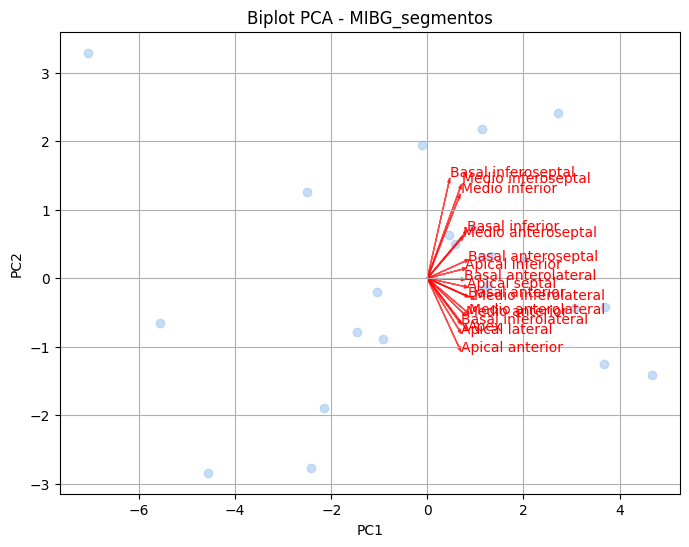

In [798]:
# Interpretar las cargas de cada componente

loadings_dict = {}

# Variables clínicas externas 
variables_externas = ['Study_age', 'EP_duration'] 

for dominio, variables in dominios.items():
    if len(variables) >= 4:
        print(f"\nDominio: {dominio}")
        
        X = df[variables].dropna()
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        # Determinar número de componentes necesarios (hasta 80% varianza)
        pca_full = PCA()
        pca_full.fit(X_scaled)
        var_acum = np.cumsum(pca_full.explained_variance_ratio_)
        n_comp = np.argmax(var_acum >= 0.8) + 1
        print(f"Se retienen {n_comp} componentes para explicar {var_acum[n_comp-1]:.2f} de varianza acumulada")

        # PCA final con componentes seleccionadas
        pca = PCA(n_components=n_comp)
        pcs = pca.fit_transform(X_scaled)

        # Guardar cargas
        loadings = pd.DataFrame(pca.components_.T, index=variables, columns=[f'PC{i+1}' for i in range(n_comp)])
        loadings_dict[dominio] = loadings
        print("Cargas principales:")
        print(loadings)

        # Biplot
        plt.figure(figsize=(8,6))
        plt.scatter(pcs[:,0], pcs[:,1], alpha=0.6)

        for i, var in enumerate(variables):
            plt.arrow(0, 0, loadings.iloc[i,0]*3, loadings.iloc[i,1]*3,
                      color='red', alpha=0.7, head_width=0.05)
            plt.text(loadings.iloc[i,0]*3.2, loadings.iloc[i,1]*3.2, var, color='red')

        plt.xlabel('PC1')
        plt.ylabel('PC2')
        plt.title(f'Biplot PCA - {dominio}')
        plt.grid(True)
        plt.show()


In [ ]:
# CORRELACIONES CON VARIABLES EXTERNAS A CADA DOMINIO

# Variables numéricas globales del df
variables_numericas = df.select_dtypes(include=[np.number, 'Int64', 'Float64']).columns.tolist()

correlaciones_externas = {}

for dominio, df_pca in resultados_pca.items():
    # print(f"\nCorrelaciones externas para dominio: {dominio}")
    
    vars_dominio = dominios[dominio]
    
    # Cambiar .difference() (que no existe para listas) por diferencia de sets
    vars_externas = list(set(variables_numericas) - set(vars_dominio))
    
    # Tomar filas comunes para evitar NaNs
    df_externas = df.loc[df_pca.index, vars_externas]
    
    # Concatenar PCs y variables externas
    df_corr = pd.concat([df_pca, df_externas], axis=1)
    
    # Calcular matriz correlación
    corr = df_corr.corr().loc[df_pca.columns, vars_externas]
    
    correlaciones_externas[dominio] = corr
    
    # Mostrar correlaciones fuertes > 0.5
    strong_corr = corr[(corr.abs() > 0.5)].stack().sort_values(ascending=False)
    
    # if not strong_corr.empty:
    #     print("Correlaciones fuertes (>|0.5|):")
    #     print(strong_corr)
    # else:
    #     print("No hay correlaciones fuertes (>|0.5|) para este dominio.")
        

for dominio, corr in correlaciones_externas.items():
    # Filtrar solo correlaciones significativas > 0.5 en valor absoluto
    corr_significativas = corr.where(corr.abs() > 0.5, np.nan)
    
    if corr_significativas.dropna(how='all').empty:
        # print(f"No hay correlaciones significativas > 0.5 para el dominio: {dominio}")
        continue
    
    # plt.figure(figsize=(20, 8))
    # sns.heatmap(corr_significativas, annot=True, fmt=".2f", cmap='coolwarm', center=0,
    #             cbar_kws={'label': 'Correlación'}, linewidths=0.5, linecolor='gray')
    # plt.title(f"Heatmap de correlaciones externas significativas (>|0.5|) - Dominio: {dominio}")
    # plt.tight_layout()
    # plt.show()


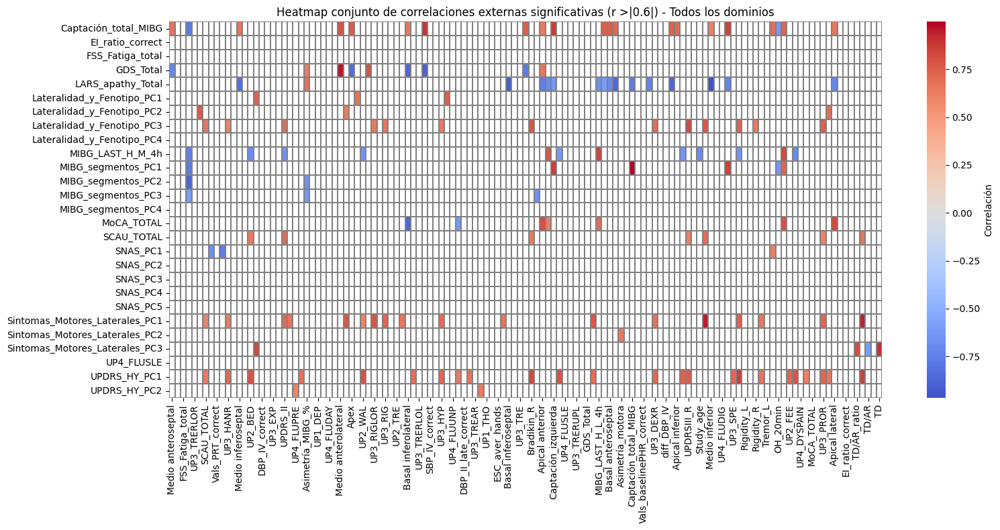

In [800]:
# Unir todas las correlaciones en un único DataFrame (union por índices y columnas)
all_corr = pd.concat(correlaciones_externas.values(), axis=0).sort_index()
all_corr = all_corr.loc[:, ~all_corr.columns.duplicated()]  # evitar columnas repetidas

# Filtrar correlaciones significativas (> 0.5)
all_corr_sign = all_corr.where(all_corr.abs() > 0.6, np.nan)

# Comprobar si hay correlaciones significativas
if all_corr_sign.dropna(how='all').empty:
    print("No hay correlaciones significativas > 0.5 en ningún dominio.")
else:
    plt.figure(figsize=(16, 8))  # Muy ancho para que se lea bien
    sns.heatmap(all_corr_sign, annot=False, fmt=".2f", cmap='coolwarm', center=0,
                cbar_kws={'label': 'Correlación'}, linewidths=0.2, linecolor='gray')
    plt.title("Heatmap conjunto de correlaciones externas significativas (r >|0.6|) - Todos los dominios")
    plt.tight_layout()
    plt.show()


In [801]:
#  TABLA DE LAS CORRELACIONES MAS RELEVANTES
variables_numericas = df.select_dtypes(include=[np.number, 'Int64', 'Float64']).columns.tolist()

correlaciones_externas = {}
lista_resumen = []

umbral_corr = 0.6  
top_n_por_dominio = 3  

for dominio, df_pca in resultados_pca.items():
    vars_dominio = dominios[dominio]
    vars_externas = list(set(variables_numericas) - set(vars_dominio))
    
    df_externas = df.loc[df_pca.index, vars_externas]
    df_corr = pd.concat([df_pca, df_externas], axis=1)
    corr = df_corr.corr().loc[df_pca.columns, vars_externas]
    
    strong_corr = corr[(corr.abs() > umbral_corr)].stack().sort_values(ascending=False)
    
    if strong_corr.empty:
        continue
    
    df_strong = strong_corr.reset_index()
    df_strong.columns = ['PC/Índice', 'Variable correlacionada', 'Correlación (r)']
    df_strong['Dominio'] = dominio
    df_strong['abs_corr'] = df_strong['Correlación (r)'].abs()
    
    df_strong = df_strong.loc[df_strong.groupby('PC/Índice')['abs_corr'].idxmax()]
    df_strong = df_strong.sort_values('abs_corr', ascending=False).head(top_n_por_dominio)
    
    lista_resumen.append(df_strong.drop(columns=['abs_corr']))

df_resumen = pd.concat(lista_resumen, ignore_index=True)


In [802]:
df_resumen

,PC/Índice,Variable correlacionada,Correlación (r),Dominio
0,Lateralidad_y_Fenotipo_PC3,UPDRSIII_R,0.817508,Lateralidad_y_Fenotipo
1,Lateralidad_y_Fenotipo_PC2,UPDRSIII_L,0.764284,Lateralidad_y_Fenotipo
2,Lateralidad_y_Fenotipo_PC1,Tremor_R,0.751392,Lateralidad_y_Fenotipo
3,UPDRS_HY_PC1,AR,0.858712,UPDRS_HY
4,UPDRS_HY_PC2,UP4_DYSDUR,0.633836,UPDRS_HY
5,Sintomas_Motores_Laterales_PC1,UPDRS_III,0.950296,Sintomas_Motores_Laterales
6,Sintomas_Motores_Laterales_PC3,TD,0.894210,Sintomas_Motores_Laterales
7,Sintomas_Motores_Laterales_PC2,Asimetría_motora,0.642443,Sintomas_Motores_Laterales
8,SNAS_PC1,Vals_baselineSBP_correct,-0.761767,SNAS
9,SCAU_TOTAL,UPDRS_II,0.703072,Sintomas_Mixtos


### 3.2- CLUSTERING K-MEANS


Dominio: Lateralidad_y_Fenotipo
Se retienen 4 componentes para explicar 0.93 de varianza acumulada


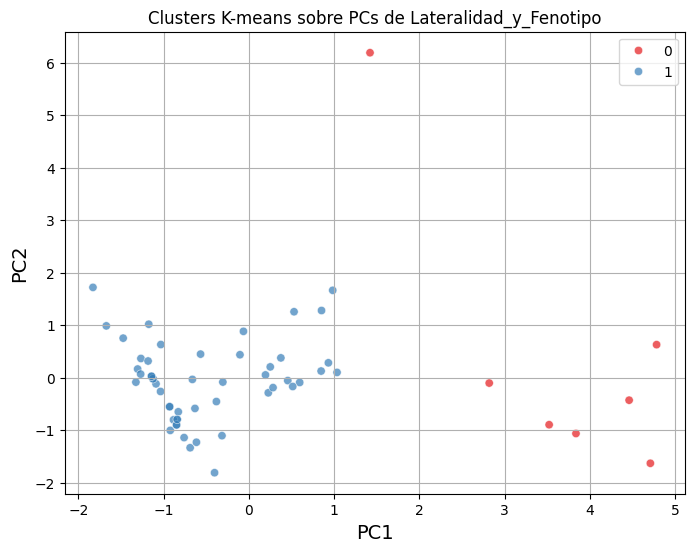

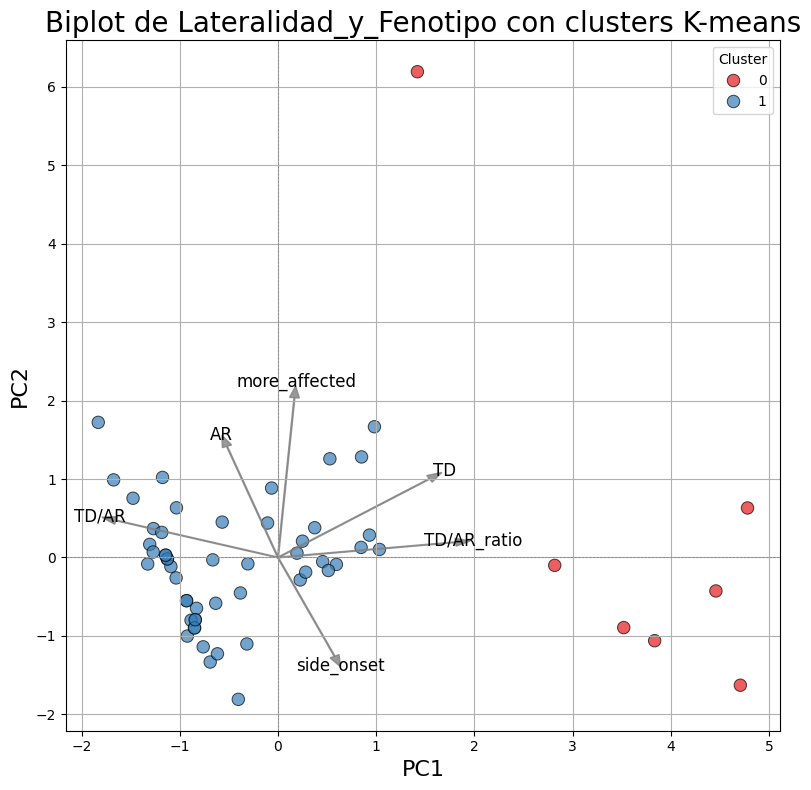


Comparación de variables clínicas entre clusters para Lateralidad_y_Fenotipo:
side_onset: Cluster 0 (n=7) = 1.57±0.53 | Cluster 1 (n=51) = 1.33±0.59 | p = 0.3065
more_affected: Cluster 0 (n=7) = 4.29±7.83 | Cluster 1 (n=51) = 1.63±0.60 | p = 0.4035
TD: Cluster 0 (n=7) = 2.19±0.98 | Cluster 1 (n=51) = 0.54±0.75 | p = 0.0038
AR: Cluster 0 (n=7) = 1.84±1.02 | Cluster 1 (n=51) = 2.56±0.96 | p = 0.1167
TD/AR: Cluster 0 (n=7) = 1.14±0.38 | Cluster 1 (n=51) = 2.00±0.00 | p = 0.0010
TD/AR_ratio: Cluster 0 (n=7) = 1.39±0.56 | Cluster 1 (n=51) = 0.21±0.27 | p = 0.0012
UPDRS_I: Cluster 0 (n=7) = 1.86±1.57 | Cluster 1 (n=50) = 2.94±2.21 | p = 0.1391
UPDRS_II: Cluster 0 (n=7) = 11.00±7.30 | Cluster 1 (n=50) = 13.54±6.85 | p = 0.4119
UPDRS_III: Cluster 0 (n=7) = 26.14±14.04 | Cluster 1 (n=50) = 29.36±10.94 | p = 0.5787
UPDRS_IV: Cluster 0 (n=7) = 2.86±4.26 | Cluster 1 (n=50) = 4.66±3.69 | p = 0.3206
HY: Cluster 0 (n=7) = 1.93±0.53 | Cluster 1 (n=50) = 2.35±0.59 | p = 0.0892
Bradikin_R: Cluster 0 (n

c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


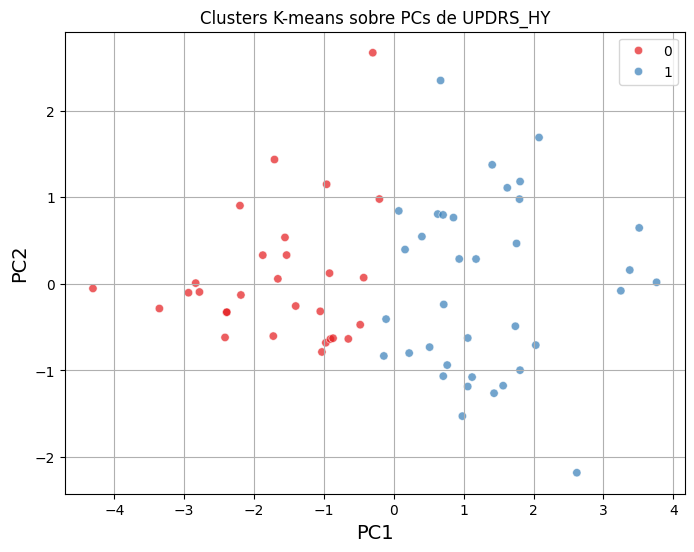

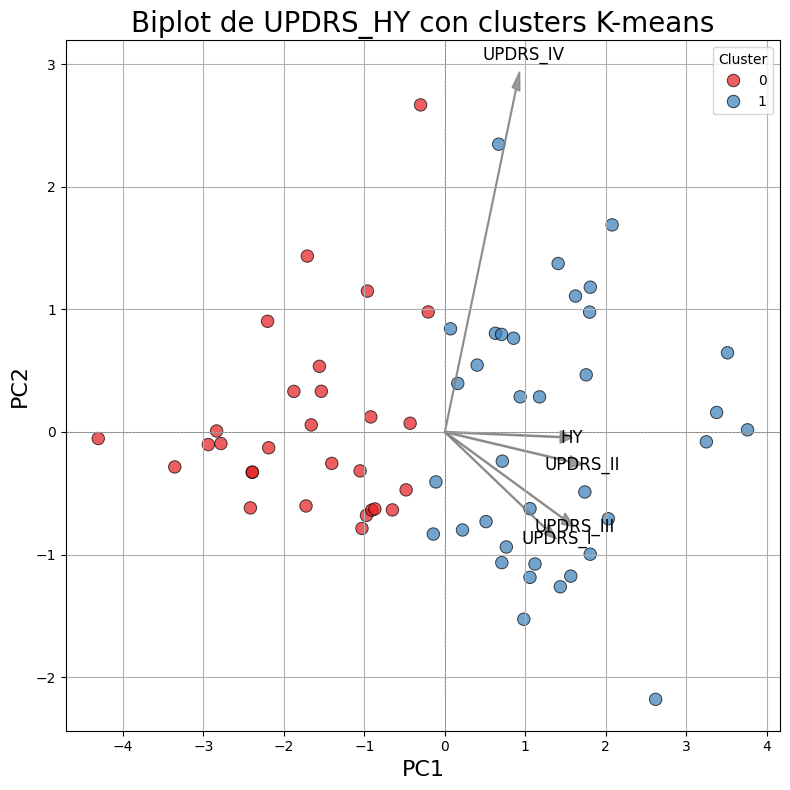


Comparación de variables clínicas entre clusters para UPDRS_HY:
side_onset: Cluster 0 (n=25) = 1.32±0.56 | Cluster 1 (n=35) = 1.49±0.56 | p = 0.2628
more_affected: Cluster 0 (n=27) = 1.70±0.54 | Cluster 1 (n=36) = 2.03±3.48 | p = 0.5861
TD: Cluster 0 (n=27) = 0.60±0.83 | Cluster 1 (n=35) = 0.93±1.05 | p = 0.1743
AR: Cluster 0 (n=27) = 1.45±0.74 | Cluster 1 (n=35) = 3.07±0.61 | p = 0.0000
TD/AR: Cluster 0 (n=26) = 1.77±0.43 | Cluster 1 (n=35) = 1.94±0.24 | p = 0.0706
TD/AR_ratio: Cluster 0 (n=26) = 0.65±1.27 | Cluster 1 (n=35) = 0.31±0.35 | p = 0.1879
UPDRS_I: Cluster 0 (n=29) = 1.21±1.26 | Cluster 1 (n=36) = 3.86±1.91 | p = 0.0000
UPDRS_II: Cluster 0 (n=29) = 6.38±3.82 | Cluster 1 (n=36) = 17.67±4.40 | p = 0.0000
UPDRS_III: Cluster 0 (n=29) = 17.28±8.21 | Cluster 1 (n=36) = 36.19±7.62 | p = 0.0000
UPDRS_IV: Cluster 0 (n=29) = 2.59±2.97 | Cluster 1 (n=36) = 5.50±3.69 | p = 0.0008
HY: Cluster 0 (n=29) = 1.67±0.66 | Cluster 1 (n=36) = 2.61±0.46 | p = 0.0000
Bradikin_R: Cluster 0 (n=28) =

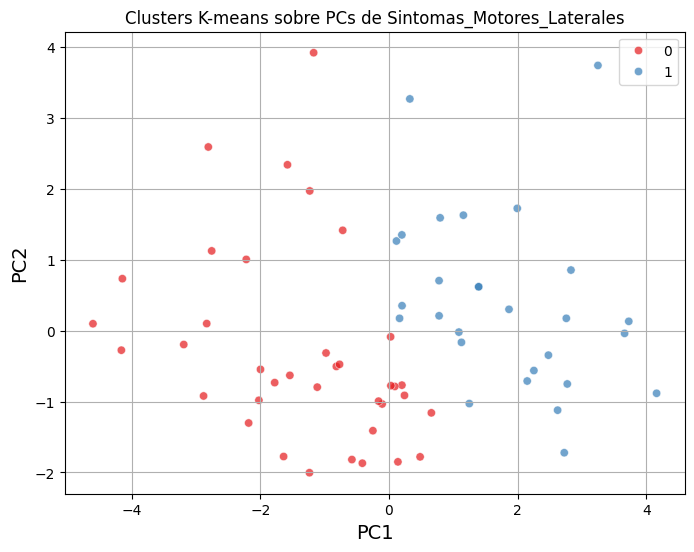

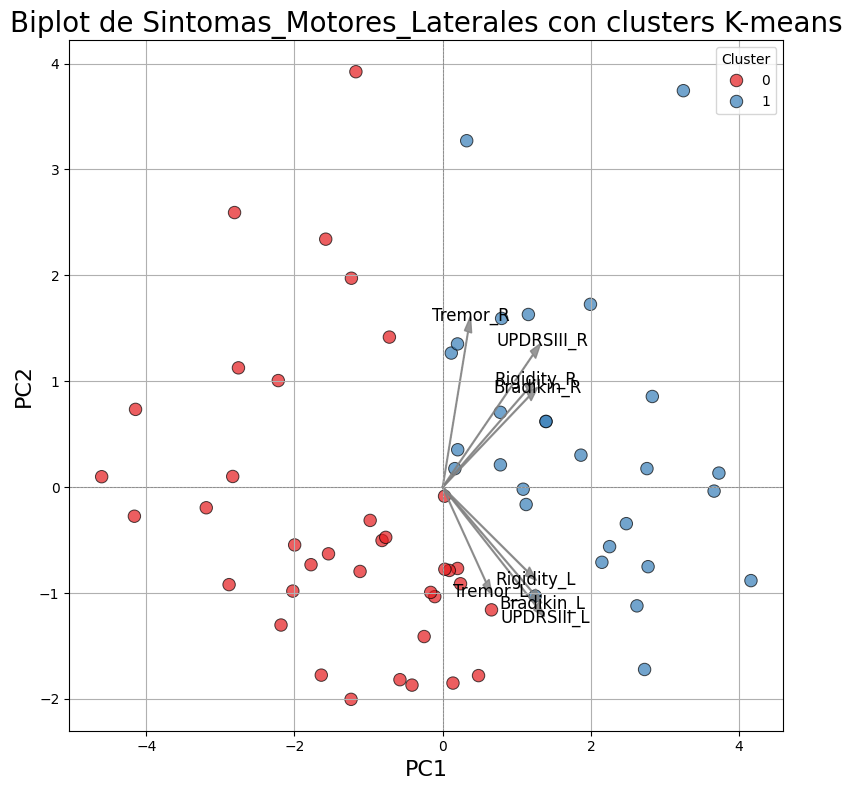


Comparación de variables clínicas entre clusters para Sintomas_Motores_Laterales:
side_onset: Cluster 0 (n=33) = 1.36±0.55 | Cluster 1 (n=27) = 1.41±0.64 | p = 0.7791
more_affected: Cluster 0 (n=36) = 1.72±0.51 | Cluster 1 (n=28) = 2.11±3.96 | p = 0.6131
TD: Cluster 0 (n=34) = 0.59±0.78 | Cluster 1 (n=28) = 0.95±1.12 | p = 0.1579
AR: Cluster 0 (n=34) = 1.69±0.73 | Cluster 1 (n=28) = 3.34±0.52 | p = 0.0000
TD/AR: Cluster 0 (n=33) = 1.82±0.39 | Cluster 1 (n=28) = 1.96±0.19 | p = 0.0637
TD/AR_ratio: Cluster 0 (n=33) = 0.42±0.60 | Cluster 1 (n=28) = 0.29±0.34 | p = 0.2863
UPDRS_I: Cluster 0 (n=37) = 1.73±1.66 | Cluster 1 (n=27) = 4.04±1.97 | p = 0.0000
UPDRS_II: Cluster 0 (n=37) = 8.62±6.13 | Cluster 1 (n=27) = 18.19±3.67 | p = 0.0000
UPDRS_III: Cluster 0 (n=37) = 19.73±8.79 | Cluster 1 (n=27) = 39.00±6.32 | p = 0.0000
UPDRS_IV: Cluster 0 (n=37) = 3.57±3.65 | Cluster 1 (n=27) = 5.07±3.65 | p = 0.1083
HY: Cluster 0 (n=37) = 1.92±0.76 | Cluster 1 (n=27) = 2.61±0.40 | p = 0.0000
Bradikin_R: 

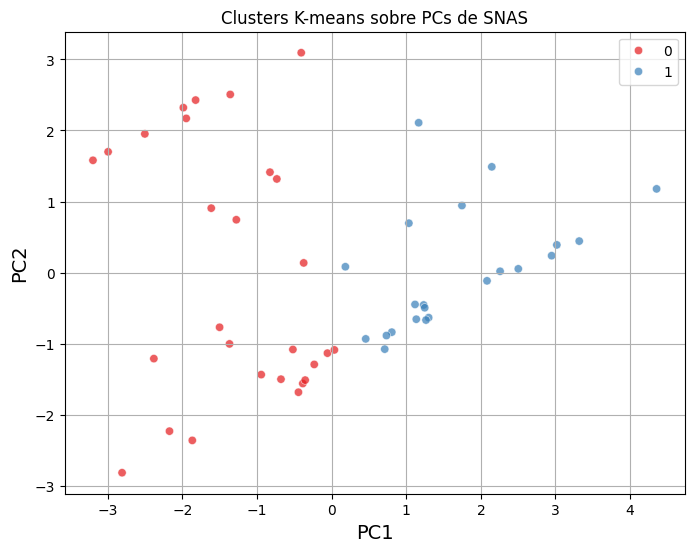

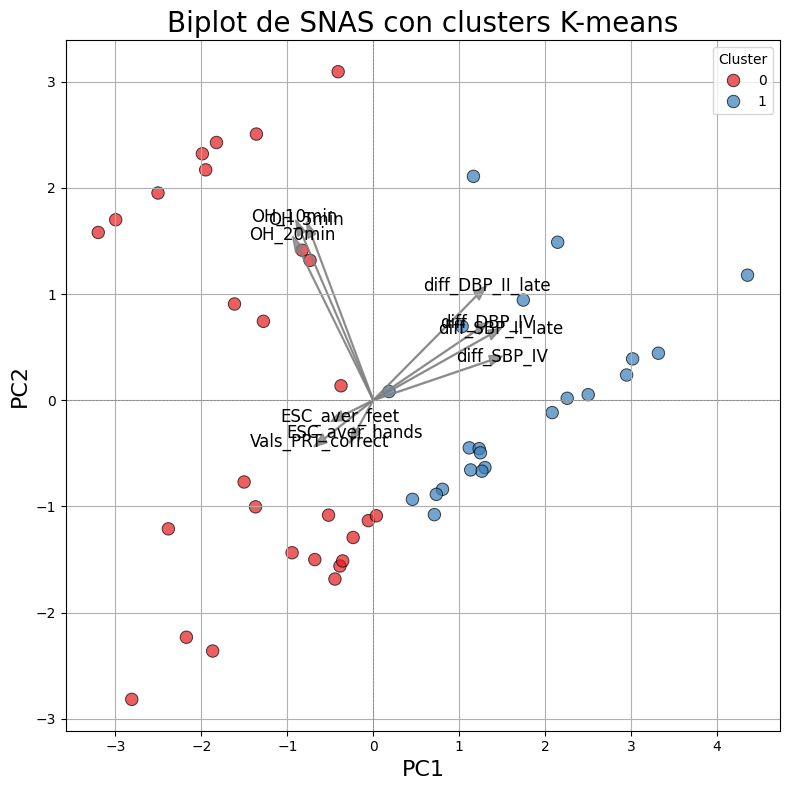


Comparación de variables clínicas entre clusters para SNAS:
side_onset: Cluster 0 (n=28) = 1.39±0.57 | Cluster 1 (n=20) = 1.35±0.59 | p = 0.8016
more_affected: Cluster 0 (n=27) = 1.48±0.64 | Cluster 1 (n=20) = 2.65±4.60 | p = 0.2733
TD: Cluster 0 (n=28) = 0.73±1.06 | Cluster 1 (n=22) = 0.85±0.90 | p = 0.6618
AR: Cluster 0 (n=28) = 2.50±0.96 | Cluster 1 (n=22) = 1.96±1.11 | p = 0.0803
TD/AR: Cluster 0 (n=28) = 1.86±0.36 | Cluster 1 (n=21) = 1.86±0.36 | p = 1.0000
TD/AR_ratio: Cluster 0 (n=28) = 0.32±0.50 | Cluster 1 (n=21) = 0.69±1.33 | p = 0.2457
UPDRS_I: Cluster 0 (n=27) = 2.63±1.76 | Cluster 1 (n=22) = 2.82±2.36 | p = 0.7577
UPDRS_II: Cluster 0 (n=27) = 13.67±7.07 | Cluster 1 (n=22) = 11.36±6.93 | p = 0.2574
UPDRS_III: Cluster 0 (n=27) = 29.70±11.47 | Cluster 1 (n=22) = 24.50±13.03 | p = 0.1499
UPDRS_IV: Cluster 0 (n=27) = 4.41±3.85 | Cluster 1 (n=22) = 4.14±3.78 | p = 0.8056
HY: Cluster 0 (n=27) = 2.43±0.55 | Cluster 1 (n=22) = 1.91±0.77 | p = 0.0116
Bradikin_R: Cluster 0 (n=27) = 

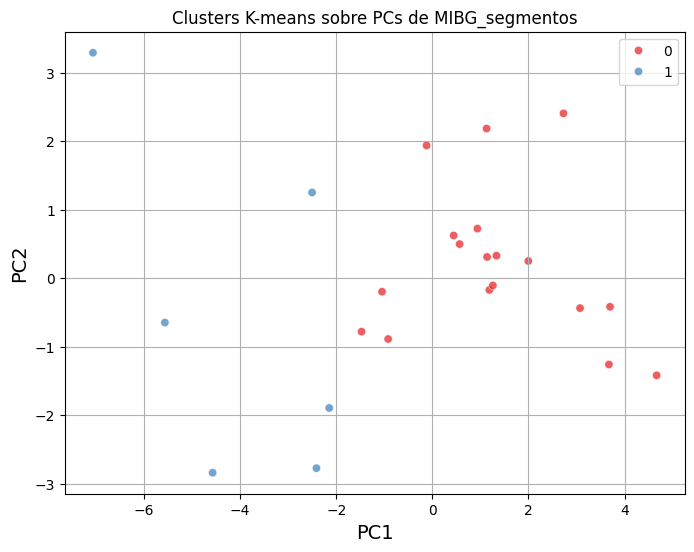

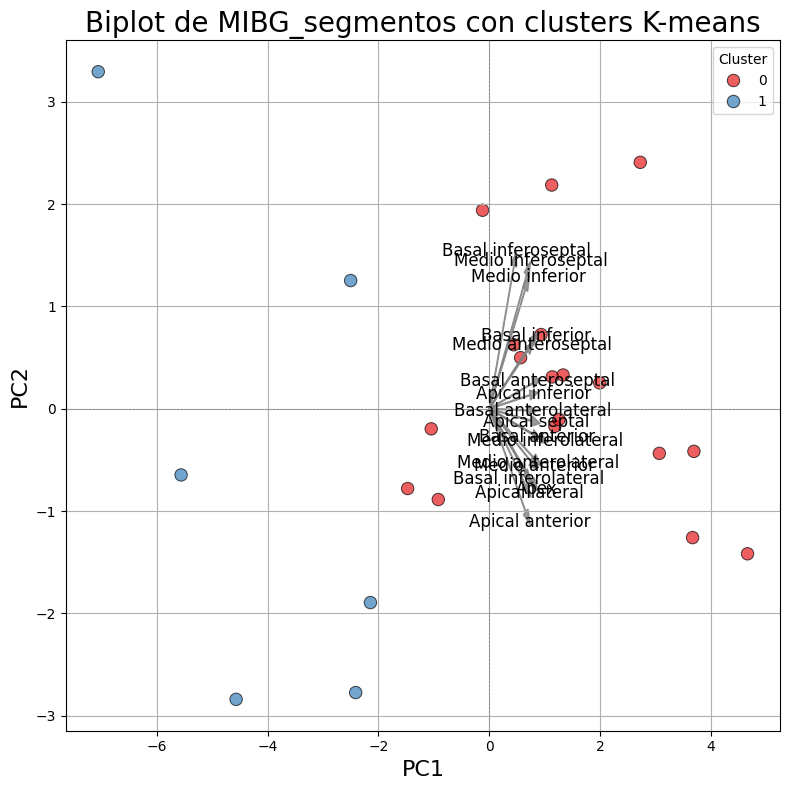


Comparación de variables clínicas entre clusters para MIBG_segmentos:
side_onset: Cluster 0 (n=17) = 1.41±0.62 | Cluster 1 (n=6) = 1.33±0.82 | p = 0.8361
more_affected: Cluster 0 (n=17) = 1.53±0.62 | Cluster 1 (n=6) = 1.50±0.55 | p = 0.9154
TD: Cluster 0 (n=17) = 0.95±1.19 | Cluster 1 (n=6) = 1.18±1.12 | p = 0.6722
AR: Cluster 0 (n=17) = 2.33±1.16 | Cluster 1 (n=6) = 2.63±0.93 | p = 0.5328
TD/AR: Cluster 0 (n=17) = 1.82±0.39 | Cluster 1 (n=6) = 1.67±0.52 | p = 0.5191
TD/AR_ratio: Cluster 0 (n=17) = 0.75±1.47 | Cluster 1 (n=6) = 0.48±0.48 | p = 0.5152
UPDRS_I: Cluster 0 (n=18) = 2.67±2.66 | Cluster 1 (n=6) = 2.83±1.72 | p = 0.8621
UPDRS_II: Cluster 0 (n=18) = 12.44±7.29 | Cluster 1 (n=6) = 15.17±2.64 | p = 0.1933
UPDRS_III: Cluster 0 (n=18) = 27.50±14.33 | Cluster 1 (n=6) = 31.67±9.05 | p = 0.4191
UPDRS_IV: Cluster 0 (n=18) = 4.22±3.90 | Cluster 1 (n=6) = 1.67±1.03 | p = 0.0194
HY: Cluster 0 (n=18) = 2.08±0.79 | Cluster 1 (n=6) = 2.42±0.58 | p = 0.2931
Bradikin_R: Cluster 0 (n=17) = 5.

c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
# SOLO PARA DOMINIOS CON PCA HECHO (MAS DE 3 VARIABLES)

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans



def plot_biplot_with_clusters(pcs, clusters, pca, feature_names, dominio):
    from matplotlib.patches import FancyArrow

    plt.figure(figsize=(8, 8))
    
    # Scatterplot de pacientes coloreados por cluster
    sns.scatterplot(x=pcs[:, 0], y=pcs[:, 1], hue=clusters, palette='Set1', s=80, alpha=0.7, edgecolor='k')
    
    # Añadir flechas (vectores de variables originales)
    for i, feature in enumerate(feature_names):
        x_vector = pca.components_[0, i]
        y_vector = pca.components_[1, i]

        arrow_length = 3
        plt.arrow(0, 0, 
                  arrow_length * x_vector, 
                  arrow_length * y_vector, 
                  color='gray', 
                  width=0.01, 
                  head_width=0.1, 
                  alpha=0.8)
        
        plt.text(arrow_length * x_vector * 1.1, 
                 arrow_length * y_vector * 1.1, 
                 feature, 
                 color='black', 
                 ha='center', va='center', fontsize=12)

    plt.xlabel('PC1',  fontsize=16)
    plt.ylabel('PC2',  fontsize=16)
    plt.title(f'Biplot de {dominio} con clusters K-means',fontsize=20)
    plt.axhline(0, color='grey', linewidth=0.5, linestyle='--')
    plt.axvline(0, color='grey', linewidth=0.5, linestyle='--')
    plt.grid(True)
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()



# Diccionario para guardar resultados de cargas
loadings_dict = {}

# Variables clínicas externas que quieras correlacionar (opcional)
variables_externas = ['Study_age', 'EP_duration']  # puedes cambiar estas

# Calculo PCA + k-means de cada dominio
for dominio, variables in dominios.items():
    if len(variables) >= 4:
        print(f"\nDominio: {dominio}")
        
        X = df[variables].dropna()
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        # Determinar número de componentes necesarios (hasta 80% varianza)
        pca_full = PCA()
        pca_full.fit(X_scaled)
        var_acum = np.cumsum(pca_full.explained_variance_ratio_)
        
        # Forzar mínimo 2 componentes
        n_comp = max(2, np.argmax(var_acum >= 0.8) + 1)
        print(f"Se retienen {n_comp} componentes para explicar {var_acum[n_comp-1]:.2f} de varianza acumulada")

        # PCA final con componentes seleccionadas
        pca = PCA(n_components=n_comp)
        pcs = pca.fit_transform(X_scaled)
        

        # Aplicar K-means sobre PCs retenidos
        k = 2  # dos clusters para brain-first y body-first
        kmeans = KMeans(n_clusters=k, random_state=42)
        clusters = kmeans.fit_predict(pcs)

        # Crear DataFrame con PCs y clusters
        pcs_df = pd.DataFrame(pcs, index=X.index, columns=[f'{dominio}_PC{i+1}' for i in range(n_comp)])
        pcs_df['cluster'] = clusters

        # Añadir clusters al DataFrame original
        df.loc[X.index, f'{dominio}_cluster'] = clusters

        # Visualización simple de clusters en el espacio de PCs 1 y 2
        plt.figure(figsize=(8,6))
        sns.scatterplot(x=pcs[:,0], y=pcs[:,1], hue=clusters, palette='Set1', alpha=0.7)
        plt.title(f'Clusters K-means sobre PCs de {dominio}')
        plt.xlabel('PC1',  fontsize=14)
        plt.ylabel('PC2',  fontsize=14)
        plt.grid(True)
        plt.show()
        
        # Biplot con flechas reales para interpretar componentes
        plot_biplot_with_clusters(pcs, clusters, pca, variables, dominio)
        
        import scipy.stats as stats

        # Variables clínicas que quieres comparar entre clusters
        variables_clinicas = ['side_onset', 'more_affected', 'TD', 'AR', 'TD/AR', 'TD/AR_ratio', 'UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY', 'Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 
                              'Tremor_R', 'Tremor_L', 'UPDRSIII_R', 'UPDRSIII_L','OH_5min', 'OH_10min', 'OH_20min', 'ESC_aver_feet', 'ESC_aver_hands', 'Vals_PRT_correct', 
                              'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV', 'EI_ratio_correct', 'FSS_Fatiga_total', 'SCAU_TOTAL',
                              'GDS_Total', 'LARS_apathy_Total', 'MoCA_TOTAL', 'UP4_FLUSLE','Captación_total_MIBG', 'MIBG_LAST_H_M_4h'
        ]
        # DataFrame para resumen estadístico
        resumen_clusters = []

        print(f"\nComparación de variables clínicas entre clusters para {dominio}:")

        for var in variables_clinicas:
            data_cluster0 = df.loc[pcs_df.index][pcs_df['cluster'] == 0][var].dropna()
            data_cluster1 = df.loc[pcs_df.index][pcs_df['cluster'] == 1][var].dropna()
            
            # Estadísticos descriptivos
            mean0, std0 = data_cluster0.mean(), data_cluster0.std()
            mean1, std1 = data_cluster1.mean(), data_cluster1.std()
            
            # Test estadístico: t-test de muestras independientes (o Mann-Whitney si no paramétrico)
            # Aquí se asume normalidad, pero puedes cambiar según convenga
            t_stat, p_val = stats.ttest_ind(data_cluster0, data_cluster1, equal_var=False)
            
            resumen_clusters.append({
                'Dominio': dominio,
                'Variable': var,
                'Cluster_0_mean': mean0,
                'Cluster_0_std': std0,
                'Cluster_1_mean': mean1,
                'Cluster_1_std': std1,
                'T-statistic': t_stat,
                'P-valor': p_val
            })
            
            print(f"{var}: Cluster 0 (n={len(data_cluster0)}) = {mean0:.2f}±{std0:.2f} | Cluster 1 (n={len(data_cluster1)}) = {mean1:.2f}±{std1:.2f} | p = {p_val:.4f}")

        # Convertir resumen a DataFrame
        df_resumen = pd.DataFrame(resumen_clusters)

        # Guardar resumen para análisis posterior o exportar
        df_resumen.to_csv(f'resumen_clusters_{dominio}.csv', index=False)
        
        # Filtrar variables con p-valor < 0.05
        variables_significativas = df_resumen[df_resumen['P-valor'] < 0.05].sort_values('P-valor')

        print(f"\nVariables discriminantes en dominio {dominio}:")
        print(variables_significativas[['Variable', 'Cluster_0_mean', 'Cluster_1_mean', 'P-valor']])
        
        
        umbrales = {}

        for idx, row in variables_significativas.iterrows():
            var = row['Variable']
            mean0 = row['Cluster_0_mean']
            mean1 = row['Cluster_1_mean']
            
            # Umbral simple entre medias
            umbral = (mean0 + mean1) / 2
            umbrales[var] = umbral
            print(f"Umbral para {var}: {umbral:.2f}")





In [804]:
dominios = {
    'Lateralidad_y_Fenotipo': ['side_onset', 'more_affected', 'TD', 'AR', 'TD/AR', 'TD/AR_ratio'],
    'UPDRS_HY': ['UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY'],
    'Sintomas_Motores_Laterales': ['Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L', 'UPDRSIII_R', 'UPDRSIII_L'],
    'SNAS': ['OH_5min', 'OH_10min', 'OH_20min', 'ESC_aver_feet', 'ESC_aver_hands', 'Vals_PRT_correct', 'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV'],
    'SNAP': ['EI_ratio_correct'],  # No PCA, solo una variable
    'Sintomas_Mixtos': ['FSS_Fatiga_total', 'SCAU_TOTAL'], # No PCA, solo dos variables
    'Neuropsiquiatria_Cognicion': ['GDS_Total', 'LARS_apathy_Total', 'MoCA_TOTAL'], # No PCA, solo 3 variables
    'RBD': ['UP4_FLUSLE'],  # No PCA, solo una variable
    'MIBG_Global': ['Captación_total_MIBG', 'MIBG_LAST_H_M_4h'], # No PCA, solo dos variables
    'MIBG_segmentos': ['Apex','Apical anterior', 'Apical inferior', 'Apical lateral', 'Apical septal', 'Basal anterior', 'Basal anterolateral', 'Basal anteroseptal', 'Basal inferior', 'Basal inferolateral', 'Basal inferoseptal',
                       'Medio anterior', 'Medio anterolateral', 'Medio anteroseptal','Medio inferior', 'Medio inferolateral', 'Medio inferoseptal']
}


=== Dominio: Lateralidad_y_Fenotipo ===
Se retienen 4 componentes para explicar 0.93 de varianza acumulada


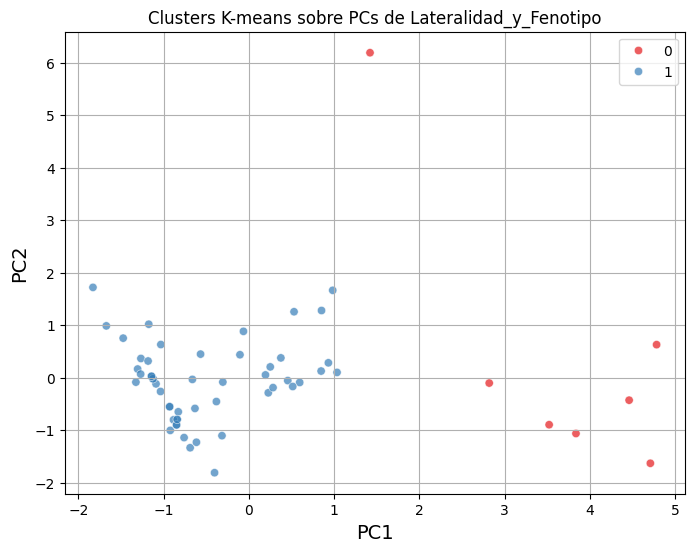

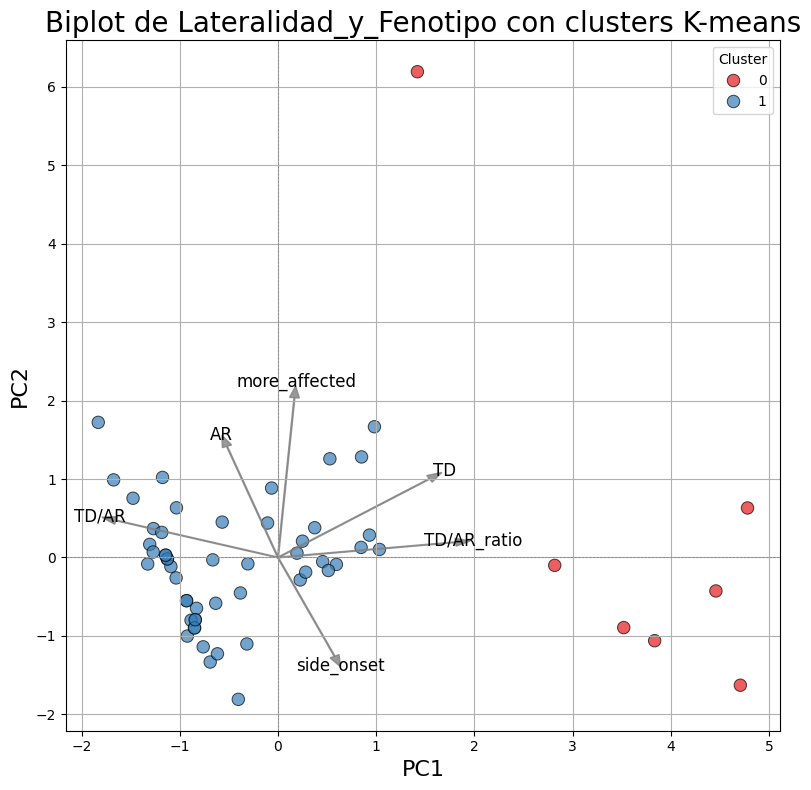


Comparación de variables clínicas entre clusters para Lateralidad_y_Fenotipo:
UPDRS_I: Cluster 0 (n=7) = 1.86±1.57 | Cluster 1 (n=50) = 2.94±2.21 | p = 0.1391
UPDRS_II: Cluster 0 (n=7) = 11.00±7.30 | Cluster 1 (n=50) = 13.54±6.85 | p = 0.4119
UPDRS_III: Cluster 0 (n=7) = 26.14±14.04 | Cluster 1 (n=50) = 29.36±10.94 | p = 0.5787
UPDRS_IV: Cluster 0 (n=7) = 2.86±4.26 | Cluster 1 (n=50) = 4.66±3.69 | p = 0.3206
HY: Cluster 0 (n=7) = 1.93±0.53 | Cluster 1 (n=50) = 2.35±0.59 | p = 0.0892
Bradikin_R: Cluster 0 (n=7) = 5.14±2.48 | Cluster 1 (n=51) = 5.84±2.79 | p = 0.5092
Bradikin_L: Cluster 0 (n=7) = 4.86±4.41 | Cluster 1 (n=51) = 6.94±2.30 | p = 0.2628
Rigidity_R: Cluster 0 (n=7) = 2.00±2.16 | Cluster 1 (n=51) = 2.59±1.65 | p = 0.5106
Rigidity_L: Cluster 0 (n=7) = 1.57±1.51 | Cluster 1 (n=51) = 2.98±1.53 | p = 0.0506
Tremor_R: Cluster 0 (n=7) = 3.86±3.13 | Cluster 1 (n=51) = 0.59±1.13 | p = 0.0327
Tremor_L: Cluster 0 (n=7) = 2.57±2.23 | Cluster 1 (n=51) = 0.98±1.50 | p = 0.1106
UPDRSIII_R:

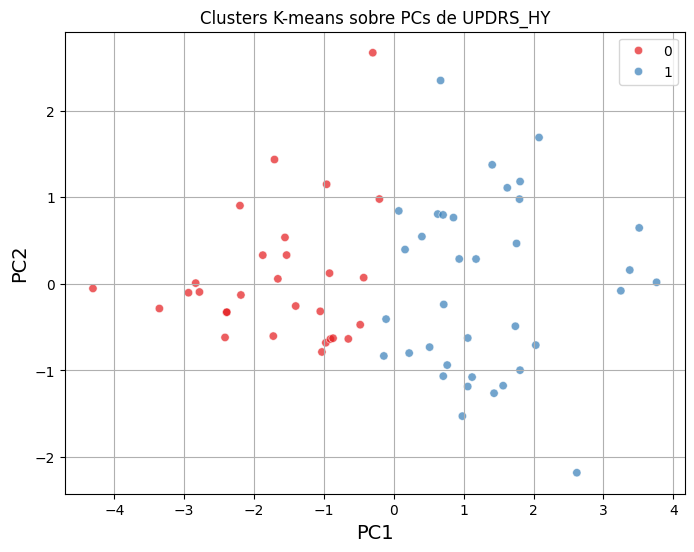

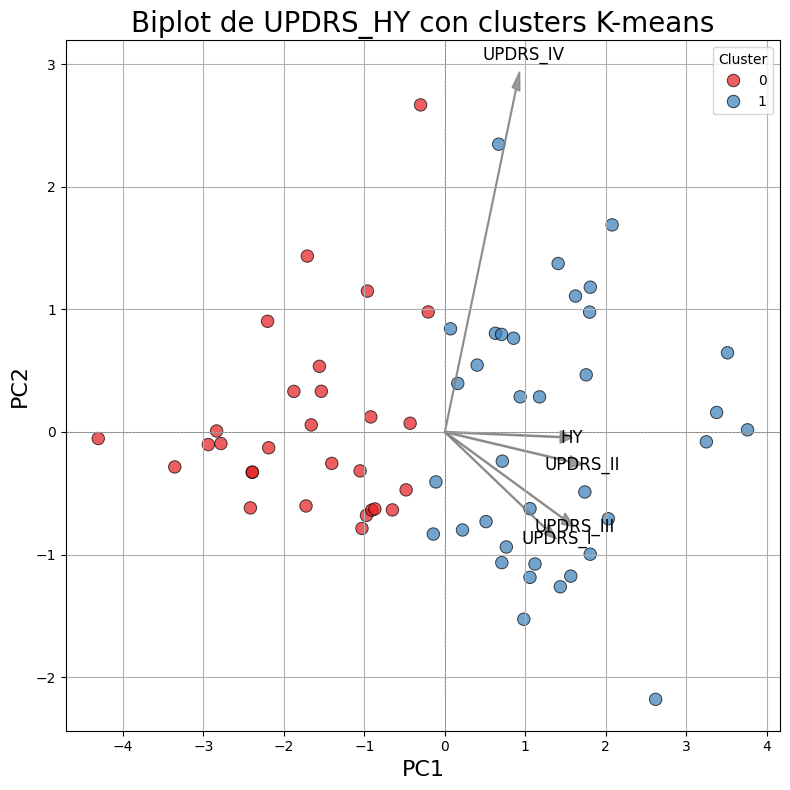


Comparación de variables clínicas entre clusters para UPDRS_HY:
side_onset: Cluster 0 (n=25) = 1.32±0.56 | Cluster 1 (n=35) = 1.49±0.56 | p = 0.2628
more_affected: Cluster 0 (n=27) = 1.70±0.54 | Cluster 1 (n=36) = 2.03±3.48 | p = 0.5861
TD: Cluster 0 (n=27) = 0.60±0.83 | Cluster 1 (n=35) = 0.93±1.05 | p = 0.1743
AR: Cluster 0 (n=27) = 1.45±0.74 | Cluster 1 (n=35) = 3.07±0.61 | p = 0.0000
TD/AR: Cluster 0 (n=26) = 1.77±0.43 | Cluster 1 (n=35) = 1.94±0.24 | p = 0.0706
TD/AR_ratio: Cluster 0 (n=26) = 0.65±1.27 | Cluster 1 (n=35) = 0.31±0.35 | p = 0.1879
Bradikin_R: Cluster 0 (n=28) = 3.18±2.18 | Cluster 1 (n=36) = 7.33±1.79 | p = 0.0000
Bradikin_L: Cluster 0 (n=28) = 4.82±2.65 | Cluster 1 (n=36) = 7.64±2.60 | p = 0.0001
Rigidity_R: Cluster 0 (n=28) = 1.18±1.19 | Cluster 1 (n=36) = 3.28±1.41 | p = 0.0000
Rigidity_L: Cluster 0 (n=28) = 1.86±1.60 | Cluster 1 (n=36) = 3.28±1.50 | p = 0.0006
Tremor_R: Cluster 0 (n=28) = 0.57±1.23 | Cluster 1 (n=36) = 1.28±2.02 | p = 0.0898
Tremor_L: Cluster 0

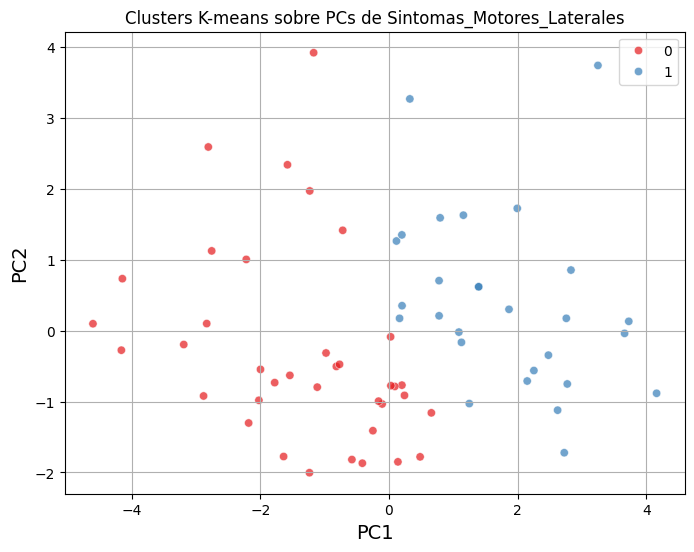

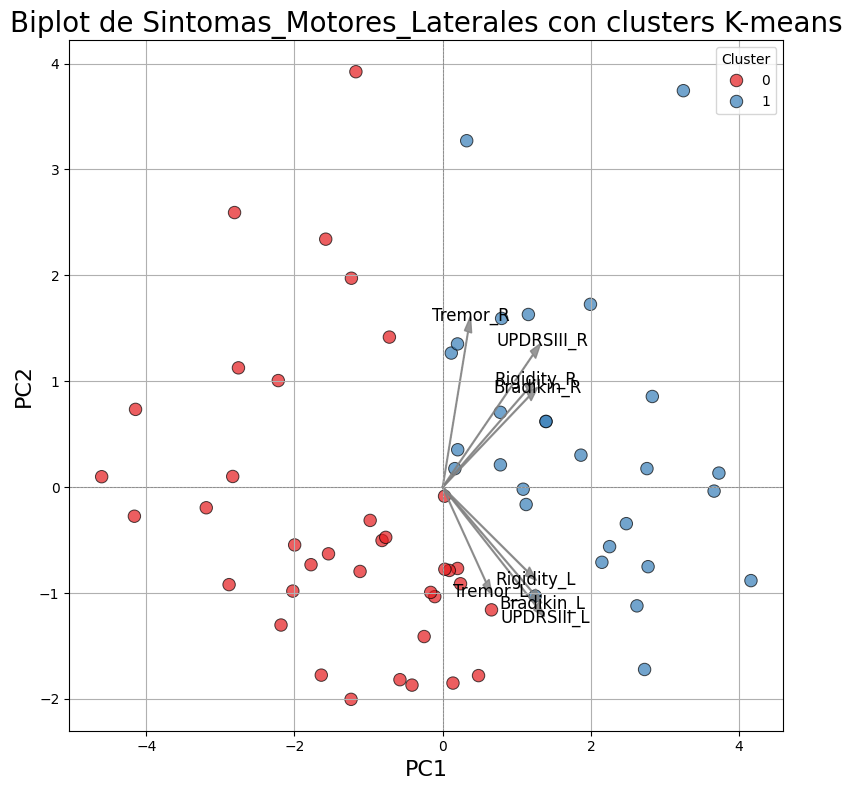


Comparación de variables clínicas entre clusters para Sintomas_Motores_Laterales:
side_onset: Cluster 0 (n=33) = 1.36±0.55 | Cluster 1 (n=27) = 1.41±0.64 | p = 0.7791
more_affected: Cluster 0 (n=36) = 1.72±0.51 | Cluster 1 (n=28) = 2.11±3.96 | p = 0.6131
TD: Cluster 0 (n=34) = 0.59±0.78 | Cluster 1 (n=28) = 0.95±1.12 | p = 0.1579
AR: Cluster 0 (n=34) = 1.69±0.73 | Cluster 1 (n=28) = 3.34±0.52 | p = 0.0000
TD/AR: Cluster 0 (n=33) = 1.82±0.39 | Cluster 1 (n=28) = 1.96±0.19 | p = 0.0637
TD/AR_ratio: Cluster 0 (n=33) = 0.42±0.60 | Cluster 1 (n=28) = 0.29±0.34 | p = 0.2863
UPDRS_I: Cluster 0 (n=37) = 1.73±1.66 | Cluster 1 (n=27) = 4.04±1.97 | p = 0.0000
UPDRS_II: Cluster 0 (n=37) = 8.62±6.13 | Cluster 1 (n=27) = 18.19±3.67 | p = 0.0000
UPDRS_III: Cluster 0 (n=37) = 19.73±8.79 | Cluster 1 (n=27) = 39.00±6.32 | p = 0.0000
UPDRS_IV: Cluster 0 (n=37) = 3.57±3.65 | Cluster 1 (n=27) = 5.07±3.65 | p = 0.1083
HY: Cluster 0 (n=37) = 1.92±0.76 | Cluster 1 (n=27) = 2.61±0.40 | p = 0.0000
OH_5min: Clu

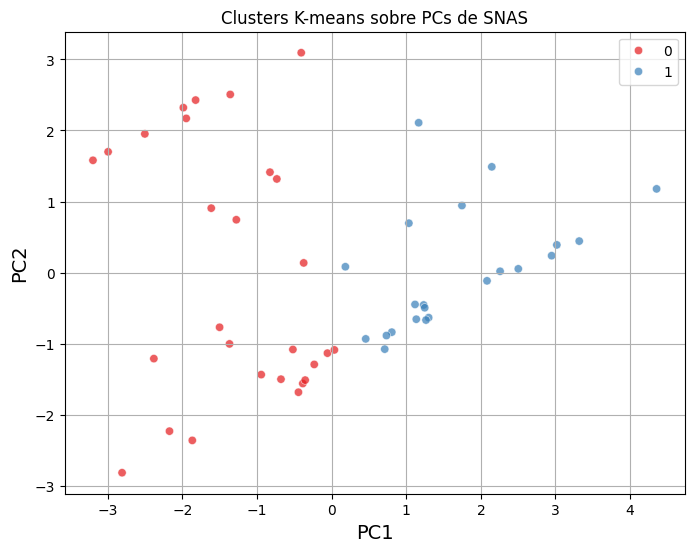

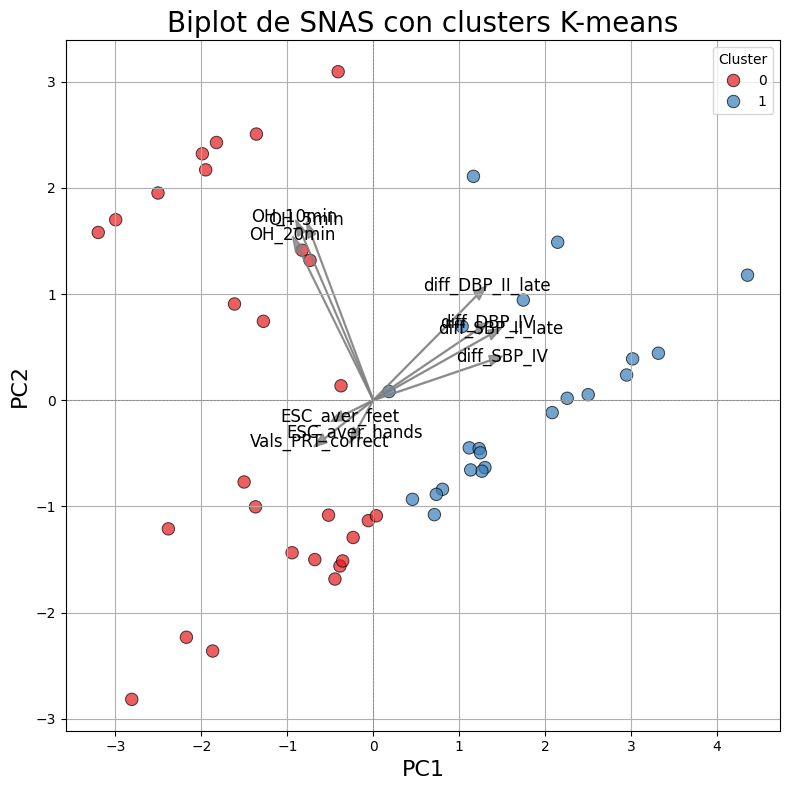


Comparación de variables clínicas entre clusters para SNAS:
side_onset: Cluster 0 (n=28) = 1.39±0.57 | Cluster 1 (n=20) = 1.35±0.59 | p = 0.8016
more_affected: Cluster 0 (n=27) = 1.48±0.64 | Cluster 1 (n=20) = 2.65±4.60 | p = 0.2733
TD: Cluster 0 (n=28) = 0.73±1.06 | Cluster 1 (n=22) = 0.85±0.90 | p = 0.6618
AR: Cluster 0 (n=28) = 2.50±0.96 | Cluster 1 (n=22) = 1.96±1.11 | p = 0.0803
TD/AR: Cluster 0 (n=28) = 1.86±0.36 | Cluster 1 (n=21) = 1.86±0.36 | p = 1.0000
TD/AR_ratio: Cluster 0 (n=28) = 0.32±0.50 | Cluster 1 (n=21) = 0.69±1.33 | p = 0.2457
UPDRS_I: Cluster 0 (n=27) = 2.63±1.76 | Cluster 1 (n=22) = 2.82±2.36 | p = 0.7577
UPDRS_II: Cluster 0 (n=27) = 13.67±7.07 | Cluster 1 (n=22) = 11.36±6.93 | p = 0.2574
UPDRS_III: Cluster 0 (n=27) = 29.70±11.47 | Cluster 1 (n=22) = 24.50±13.03 | p = 0.1499
UPDRS_IV: Cluster 0 (n=27) = 4.41±3.85 | Cluster 1 (n=22) = 4.14±3.78 | p = 0.8056
HY: Cluster 0 (n=27) = 2.43±0.55 | Cluster 1 (n=22) = 1.91±0.77 | p = 0.0116
Bradikin_R: Cluster 0 (n=27) = 

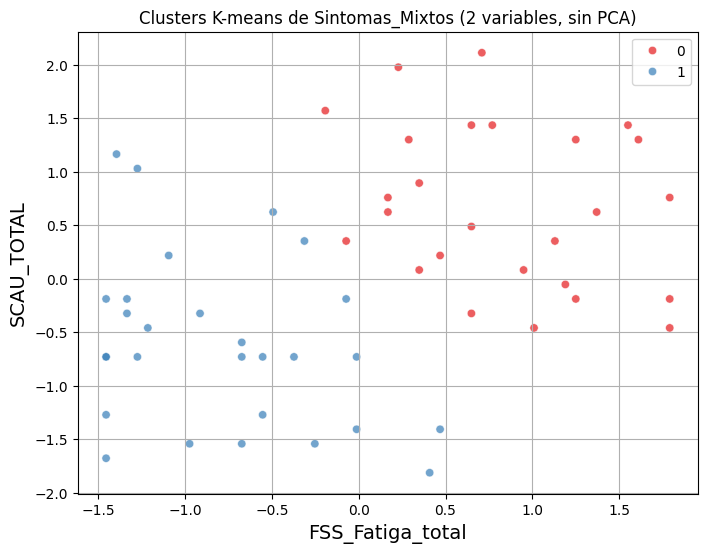


Comparación de variables clínicas entre clusters para Sintomas_Mixtos:
side_onset: Cluster 0 (n=24) = 1.58±0.50 | Cluster 1 (n=26) = 1.27±0.60 | p = 0.0509
more_affected: Cluster 0 (n=25) = 2.24±4.18 | Cluster 1 (n=27) = 1.67±0.55 | p = 0.5022
TD: Cluster 0 (n=26) = 0.99±1.09 | Cluster 1 (n=28) = 0.68±0.92 | p = 0.2609
AR: Cluster 0 (n=26) = 2.95±0.90 | Cluster 1 (n=28) = 1.85±1.00 | p = 0.0001
TD/AR: Cluster 0 (n=25) = 1.92±0.28 | Cluster 1 (n=28) = 1.79±0.42 | p = 0.1704
TD/AR_ratio: Cluster 0 (n=25) = 0.34±0.35 | Cluster 1 (n=28) = 0.60±1.23 | p = 0.2937
UPDRS_I: Cluster 0 (n=26) = 4.00±1.90 | Cluster 1 (n=28) = 1.82±1.74 | p = 0.0001
UPDRS_II: Cluster 0 (n=26) = 17.92±5.73 | Cluster 1 (n=28) = 8.54±4.82 | p = 0.0000
UPDRS_III: Cluster 0 (n=26) = 34.96±11.45 | Cluster 1 (n=28) = 22.25±10.44 | p = 0.0001
UPDRS_IV: Cluster 0 (n=26) = 5.15±3.87 | Cluster 1 (n=28) = 3.64±3.21 | p = 0.1267
HY: Cluster 0 (n=26) = 2.46±0.71 | Cluster 1 (n=28) = 2.02±0.60 | p = 0.0167
Bradikin_R: Cluster 0

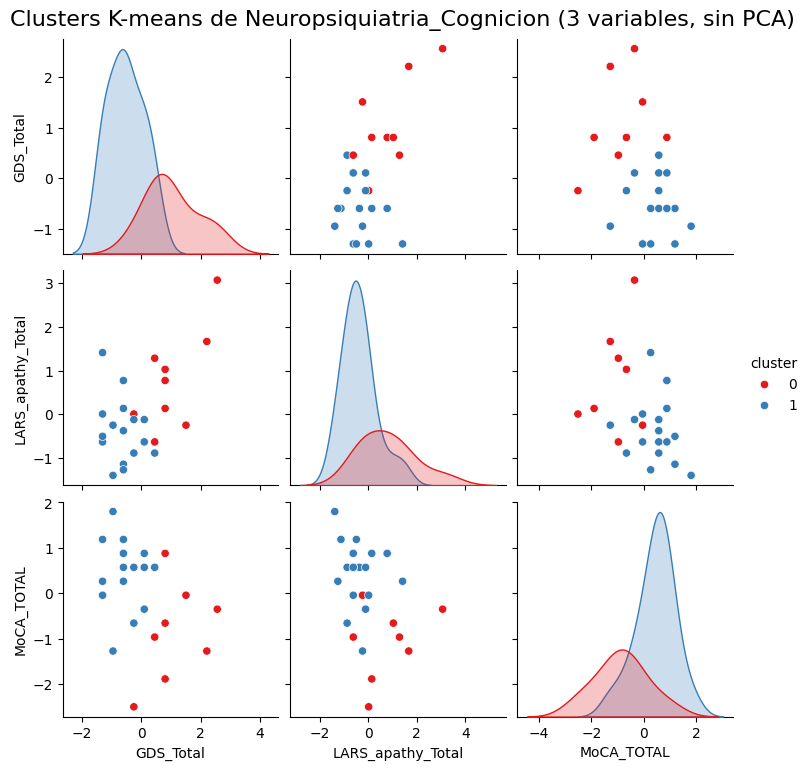


Comparación de variables clínicas entre clusters para Neuropsiquiatria_Cognicion:
side_onset: Cluster 0 (n=8) = 1.25±0.89 | Cluster 1 (n=17) = 1.35±0.49 | p = 0.7658
more_affected: Cluster 0 (n=9) = 1.33±0.71 | Cluster 1 (n=17) = 1.71±0.47 | p = 0.1805
TD: Cluster 0 (n=9) = 0.89±1.05 | Cluster 1 (n=18) = 0.56±0.77 | p = 0.4215
AR: Cluster 0 (n=9) = 3.10±0.88 | Cluster 1 (n=18) = 2.46±0.88 | p = 0.0916
TD/AR: Cluster 0 (n=9) = 1.78±0.44 | Cluster 1 (n=18) = 1.94±0.24 | p = 0.3130
TD/AR_ratio: Cluster 0 (n=9) = 0.37±0.46 | Cluster 1 (n=18) = 0.24±0.36 | p = 0.4795
UPDRS_I: Cluster 0 (n=8) = 4.25±2.43 | Cluster 1 (n=17) = 2.29±1.40 | p = 0.0629
UPDRS_II: Cluster 0 (n=8) = 17.50±5.26 | Cluster 1 (n=17) = 11.71±5.73 | p = 0.0248
UPDRS_III: Cluster 0 (n=8) = 34.25±8.35 | Cluster 1 (n=17) = 28.18±10.13 | p = 0.1325
UPDRS_IV: Cluster 0 (n=8) = 6.88±3.80 | Cluster 1 (n=17) = 5.00±3.97 | p = 0.2748
HY: Cluster 0 (n=8) = 2.62±0.44 | Cluster 1 (n=17) = 2.21±0.59 | p = 0.0634
Bradikin_R: Cluster 0

c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1114: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1114: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


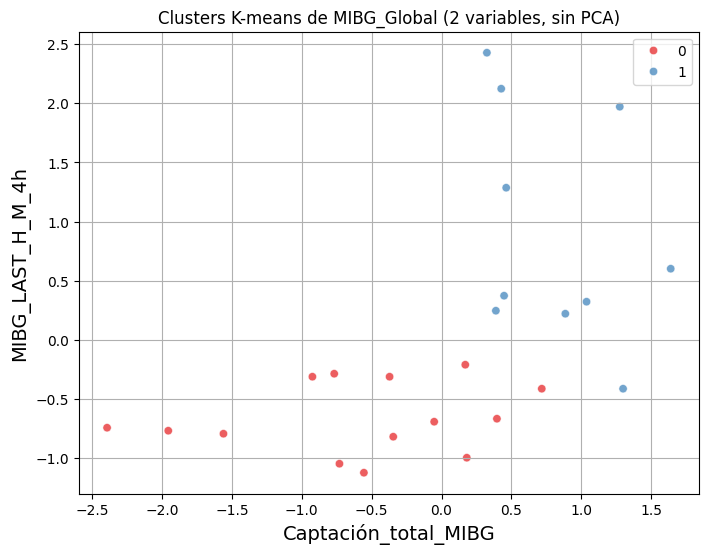


Comparación de variables clínicas entre clusters para MIBG_Global:
side_onset: Cluster 0 (n=14) = 1.43±0.65 | Cluster 1 (n=9) = 1.33±0.71 | p = 0.7487
more_affected: Cluster 0 (n=13) = 1.54±0.66 | Cluster 1 (n=10) = 1.50±0.53 | p = 0.8780
TD: Cluster 0 (n=14) = 1.07±1.03 | Cluster 1 (n=9) = 0.91±1.39 | p = 0.7705
AR: Cluster 0 (n=14) = 2.55±1.22 | Cluster 1 (n=9) = 2.19±0.88 | p = 0.4195
TD/AR: Cluster 0 (n=14) = 1.79±0.43 | Cluster 1 (n=9) = 1.78±0.44 | p = 0.9665
TD/AR_ratio: Cluster 0 (n=14) = 0.77±1.55 | Cluster 1 (n=9) = 0.54±0.77 | p = 0.6458
UPDRS_I: Cluster 0 (n=14) = 3.21±2.52 | Cluster 1 (n=10) = 2.00±2.21 | p = 0.2245
UPDRS_II: Cluster 0 (n=14) = 15.64±4.96 | Cluster 1 (n=10) = 9.60±6.98 | p = 0.0327
UPDRS_III: Cluster 0 (n=14) = 32.07±11.92 | Cluster 1 (n=10) = 23.60±13.79 | p = 0.1344
UPDRS_IV: Cluster 0 (n=14) = 3.71±3.79 | Cluster 1 (n=10) = 3.40±3.44 | p = 0.8346
HY: Cluster 0 (n=14) = 2.36±0.66 | Cluster 1 (n=10) = 1.90±0.81 | p = 0.1603
Bradikin_R: Cluster 0 (n=13) =

c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1114: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1114: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


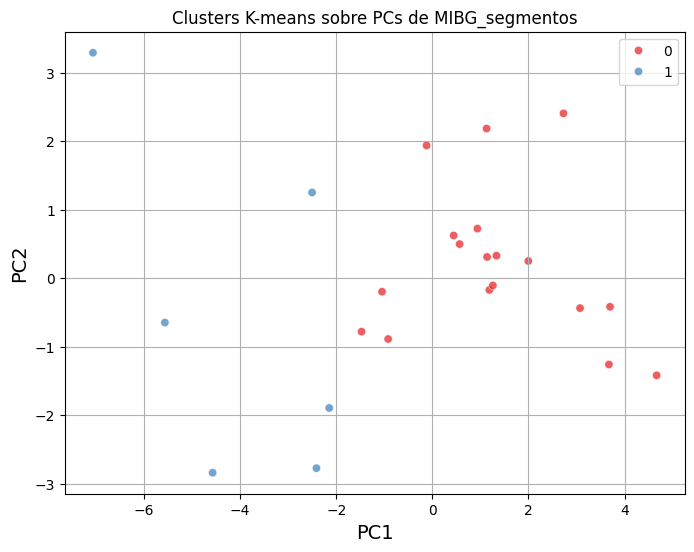

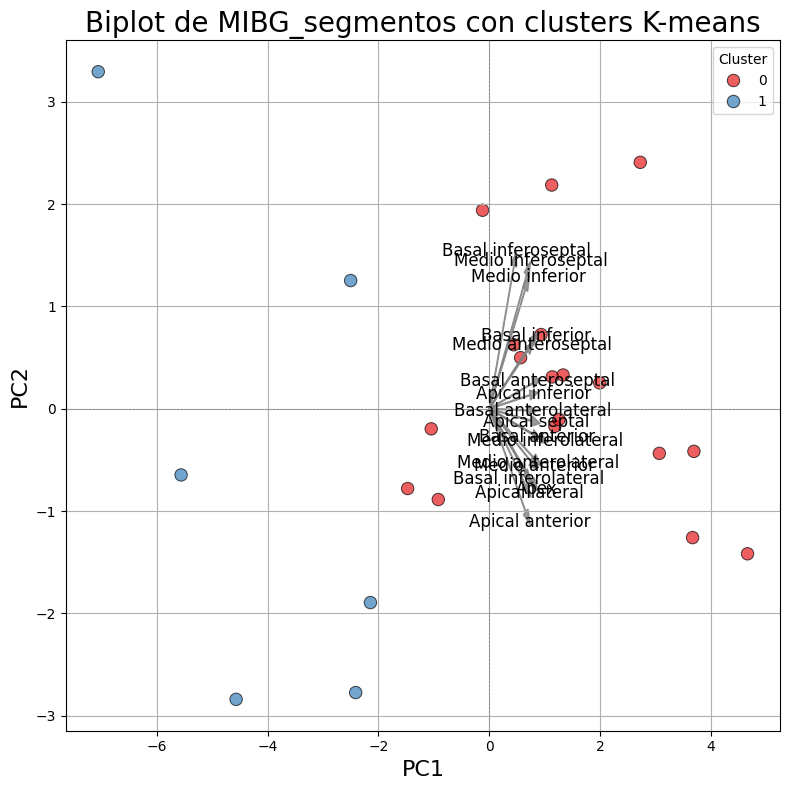


Comparación de variables clínicas entre clusters para MIBG_segmentos:
side_onset: Cluster 0 (n=17) = 1.41±0.62 | Cluster 1 (n=6) = 1.33±0.82 | p = 0.8361
more_affected: Cluster 0 (n=17) = 1.53±0.62 | Cluster 1 (n=6) = 1.50±0.55 | p = 0.9154
TD: Cluster 0 (n=17) = 0.95±1.19 | Cluster 1 (n=6) = 1.18±1.12 | p = 0.6722
AR: Cluster 0 (n=17) = 2.33±1.16 | Cluster 1 (n=6) = 2.63±0.93 | p = 0.5328
TD/AR: Cluster 0 (n=17) = 1.82±0.39 | Cluster 1 (n=6) = 1.67±0.52 | p = 0.5191
TD/AR_ratio: Cluster 0 (n=17) = 0.75±1.47 | Cluster 1 (n=6) = 0.48±0.48 | p = 0.5152
UPDRS_I: Cluster 0 (n=18) = 2.67±2.66 | Cluster 1 (n=6) = 2.83±1.72 | p = 0.8621
UPDRS_II: Cluster 0 (n=18) = 12.44±7.29 | Cluster 1 (n=6) = 15.17±2.64 | p = 0.1933
UPDRS_III: Cluster 0 (n=18) = 27.50±14.33 | Cluster 1 (n=6) = 31.67±9.05 | p = 0.4191
UPDRS_IV: Cluster 0 (n=18) = 4.22±3.90 | Cluster 1 (n=6) = 1.67±1.03 | p = 0.0194
HY: Cluster 0 (n=18) = 2.08±0.79 | Cluster 1 (n=6) = 2.42±0.58 | p = 0.2931
Bradikin_R: Cluster 0 (n=17) = 5.

c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [805]:
# PROCESO COMPLETO PARA TODOS LOS DOMINIOS

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scipy.stats as stats


def plot_biplot_with_clusters(pcs, clusters, pca, feature_names, dominio):
    plt.figure(figsize=(8, 8))
    sns.scatterplot(x=pcs[:, 0], y=pcs[:, 1], hue=clusters, palette='Set1', s=80, alpha=0.7, edgecolor='k')
    
    for i, feature in enumerate(feature_names):
        x_vector = pca.components_[0, i]
        y_vector = pca.components_[1, i]
        arrow_length = 3
        plt.arrow(0, 0, 
                  arrow_length * x_vector, 
                  arrow_length * y_vector, 
                  color='gray', 
                  width=0.01, 
                  head_width=0.1, 
                  alpha=0.8)
        plt.text(arrow_length * x_vector * 1.1, 
                 arrow_length * y_vector * 1.1, 
                 feature, 
                 color='black', 
                 ha='center', va='center', fontsize=12)
    plt.xlabel('PC1',  fontsize=16)
    plt.ylabel('PC2',  fontsize=16)
    plt.title(f'Biplot de {dominio} con clusters K-means', fontsize=20)
    plt.axhline(0, color='grey', linewidth=0.5, linestyle='--')
    plt.axvline(0, color='grey', linewidth=0.5, linestyle='--')
    plt.grid(True)
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()


# Variables clínicas externas para análisis
variables_externas = ['Study_age', 'EP_duration']  # ajustar si quieres


# Bucle para cada dominio
for dominio, variables in dominios.items():
    print(f"\n=== Dominio: {dominio} ===")
    if len(variables) < 2:
        print(f"Dominio {dominio} tiene menos de 2 variables. Se omite clustering.")
        continue

    X = df[variables].dropna()
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    k = 2  # número de clusters

    if len(variables) >= 4:
        # PCA + clustering
        pca_full = PCA()
        pca_full.fit(X_scaled)
        var_acum = np.cumsum(pca_full.explained_variance_ratio_)
        n_comp = max(2, np.argmax(var_acum >= 0.8) + 1)
        print(f"Se retienen {n_comp} componentes para explicar {var_acum[n_comp-1]:.2f} de varianza acumulada")
        pca = PCA(n_components=n_comp)
        pcs = pca.fit_transform(X_scaled)

        kmeans = KMeans(n_clusters=k, random_state=42)
        clusters = kmeans.fit_predict(pcs)

        pcs_df = pd.DataFrame(pcs, index=X.index, columns=[f'{dominio}_PC{i+1}' for i in range(n_comp)])
        pcs_df['cluster'] = clusters

        df.loc[X.index, f'{dominio}_cluster'] = clusters

        # Gráficos
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=pcs[:, 0], y=pcs[:, 1], hue=clusters, palette='Set1', alpha=0.7)
        plt.title(f'Clusters K-means sobre PCs de {dominio}')
        plt.xlabel('PC1', fontsize=14)
        plt.ylabel('PC2', fontsize=14)
        plt.grid(True)
        plt.show()

        plot_biplot_with_clusters(pcs, clusters, pca, variables, dominio)

    else:
        # Clustering directo sin PCA
        kmeans = KMeans(n_clusters=k, random_state=42)
        clusters = kmeans.fit_predict(X_scaled)
        df.loc[X.index, f'{dominio}_cluster'] = clusters

        if len(variables) == 2:
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=clusters, palette='Set1', alpha=0.7)
            plt.title(f'Clusters K-means de {dominio} (2 variables, sin PCA)')
            plt.xlabel(variables[0], fontsize=14)
            plt.ylabel(variables[1], fontsize=14)
            plt.grid(True)
            plt.show()

        elif len(variables) == 3:
            print(f"Dominio {dominio} con 3 variables, mostrando pairplot.")
            X_pairplot = pd.DataFrame(X_scaled, columns=variables, index=X.index)
            X_pairplot['cluster'] = clusters
            sns.pairplot(X_pairplot, hue='cluster', palette='Set1', diag_kind='kde')
            plt.suptitle(f'Clusters K-means de {dominio} (3 variables, sin PCA)', fontsize=16, y=1.02)
            plt.show()

    # Análisis estadístico entre clusters
    todas_las_variables_clinicas = ['side_onset', 'more_affected', 'TD', 'AR', 'TD/AR', 'TD/AR_ratio', 'UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY',
    'Bradikin_R', 'Bradikin_L', 'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L', 'UPDRSIII_R', 'UPDRSIII_L',
    'OH_5min', 'OH_10min', 'OH_20min', 'ESC_aver_feet', 'ESC_aver_hands', 'Vals_PRT_correct',
    'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV', 'EI_ratio_correct', 'FSS_Fatiga_total',
    'SCAU_TOTAL', 'GDS_Total', 'LARS_apathy_Total', 'MoCA_TOTAL', 'UP4_FLUSLE', 'Captación_total_MIBG', 'MIBG_LAST_H_M_4h',
    'Study_age', 'EP_duration']

    # Quitar las variables que se usaron para clusterizar este dominio
    variables_clinicas = [v for v in todas_las_variables_clinicas if v not in variables]

    resumen_clusters = []
    print(f"\nComparación de variables clínicas entre clusters para {dominio}:")

    for var in variables_clinicas:
        data_cluster0 = df.loc[X.index][df.loc[X.index, f'{dominio}_cluster'] == 0][var].dropna()
        data_cluster1 = df.loc[X.index][df.loc[X.index, f'{dominio}_cluster'] == 1][var].dropna()

        mean0, std0 = data_cluster0.mean(), data_cluster0.std()
        mean1, std1 = data_cluster1.mean(), data_cluster1.std()

        t_stat, p_val = stats.ttest_ind(data_cluster0, data_cluster1, equal_var=False)

        resumen_clusters.append({
            'Dominio': dominio,
            'Variable': var,
            'Cluster_0_mean': mean0,
            'Cluster_0_std': std0,
            'Cluster_1_mean': mean1,
            'Cluster_1_std': std1,
            'T-statistic': t_stat,
            'P-valor': p_val
        })

        print(f"{var}: Cluster 0 (n={len(data_cluster0)}) = {mean0:.2f}±{std0:.2f} | "
              f"Cluster 1 (n={len(data_cluster1)}) = {mean1:.2f}±{std1:.2f} | p = {p_val:.4f}")

    df_resumen = pd.DataFrame(resumen_clusters)
    df_resumen.to_csv(f'resumen_clusters_{dominio}.csv', index=False)

    variables_significativas = df_resumen[df_resumen['P-valor'] < 0.05].sort_values('P-valor')

    print(f"\nVariables discriminantes en dominio {dominio}:")
    print(variables_significativas[['Variable', 'Cluster_0_mean', 'Cluster_1_mean', 'P-valor']])

    umbrales = {}
    for idx, row in variables_significativas.iterrows():
        var = row['Variable']
        mean0 = row['Cluster_0_mean']
        mean1 = row['Cluster_1_mean']
        umbral = (mean0 + mean1) / 2
        umbrales[var] = umbral
        print(f"Umbral para {var}: {umbral:.2f}")


Dominio: Lateralidad_y_Fenotipo

Dominio: UPDRS_HY

Dominio: Sintomas_Motores_Laterales

Dominio: SNAS

Dominio: SNAP
Dominio SNAP (1 variable):
Umbral propuesto entre clusters: 601958797.207
Cluster 0: n=47, media=2675578.414, std=18342675.667
Cluster 1: n=12, media=1201242016.000, std=128870479.355


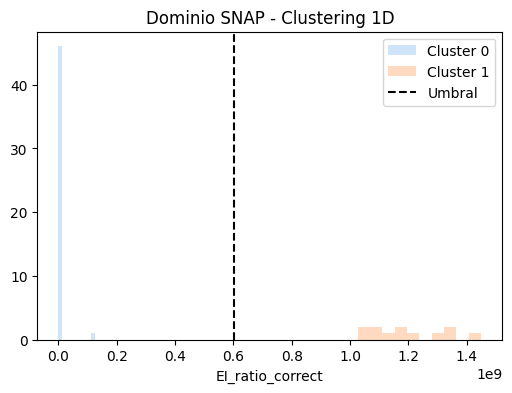


Comparación de variables clínicas externas entre clusters en dominio SNAP:
side_onset: Cluster0 mean=1.39, Cluster1 mean=1.36, p=0.9000
more_affected: Cluster0 mean=2.00, Cluster1 mean=1.67, p=0.5050
TD: Cluster0 mean=0.84, Cluster1 mean=0.52, p=0.1866
AR: Cluster0 mean=2.37, Cluster1 mean=2.61, p=0.4407
TD/AR: Cluster0 mean=1.85, Cluster1 mean=1.92, p=0.4947
TD/AR_ratio: Cluster0 mean=0.50, Cluster1 mean=0.23, p=0.1115
UPDRS_I: Cluster0 mean=3.04, Cluster1 mean=2.17, p=0.0608
UPDRS_II: Cluster0 mean=13.16, Cluster1 mean=12.50, p=0.7252
UPDRS_III: Cluster0 mean=28.36, Cluster1 mean=29.25, p=0.7954
UPDRS_IV: Cluster0 mean=4.33, Cluster1 mean=4.67, p=0.7946
HY: Cluster0 mean=2.23, Cluster1 mean=2.29, p=0.7478
Bradikin_R: Cluster0 mean=5.67, Cluster1 mean=6.08, p=0.6468
Bradikin_L: Cluster0 mean=6.44, Cluster1 mean=7.50, p=0.1830
Rigidity_R: Cluster0 mean=2.47, Cluster1 mean=2.75, p=0.6212
Rigidity_L: Cluster0 mean=2.67, Cluster1 mean=3.33, p=0.1577
Tremor_R: Cluster0 mean=1.16, Cluster1

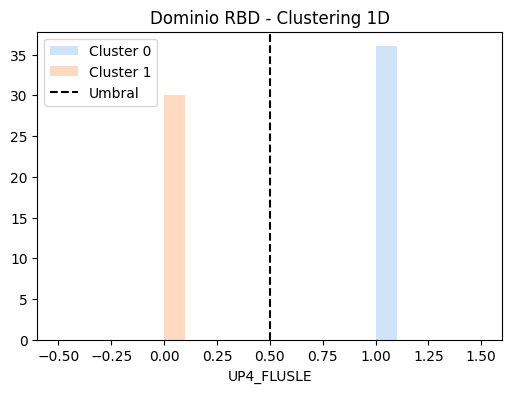


Comparación de variables clínicas externas entre clusters en dominio RBD:
side_onset: Cluster0 mean=1.38, Cluster1 mean=1.37, p=0.9367
more_affected: Cluster0 mean=2.18, Cluster1 mean=1.57, p=0.3322
TD: Cluster0 mean=0.77, Cluster1 mean=0.71, p=0.8020
AR: Cluster0 mean=2.54, Cluster1 mean=2.28, p=0.3296
TD/AR: Cluster0 mean=1.91, Cluster1 mean=1.86, p=0.5159
TD/AR_ratio: Cluster0 mean=0.30, Cluster1 mean=0.41, p=0.4233
UPDRS_I: Cluster0 mean=3.18, Cluster1 mean=2.17, p=0.0543
UPDRS_II: Cluster0 mean=14.47, Cluster1 mean=10.60, p=0.0259
UPDRS_III: Cluster0 mean=29.79, Cluster1 mean=25.67, p=0.1839
UPDRS_IV: Cluster0 mean=5.09, Cluster1 mean=3.20, p=0.0435
HY: Cluster0 mean=2.28, Cluster1 mean=2.13, p=0.4177
Bradikin_R: Cluster0 mean=5.83, Cluster1 mean=5.23, p=0.4023
Bradikin_L: Cluster0 mean=6.89, Cluster1 mean=5.97, p=0.2140
Rigidity_R: Cluster0 mean=2.77, Cluster1 mean=2.00, p=0.0703
Rigidity_L: Cluster0 mean=3.06, Cluster1 mean=2.27, p=0.0651
Tremor_R: Cluster0 mean=1.00, Cluster1 

In [806]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scipy.stats as stats


def plot_biplot_with_clusters(pcs, clusters, pca, feature_names, dominio):
    plt.figure(figsize=(8, 8))
    sns.scatterplot(x=pcs[:, 0], y=pcs[:, 1], hue=clusters, palette='Set1', s=80, alpha=0.7, edgecolor='k')
    
    for i, feature in enumerate(feature_names):
        x_vector = pca.components_[0, i]
        y_vector = pca.components_[1, i]
        arrow_length = 3
        plt.arrow(0, 0, 
                  arrow_length * x_vector, 
                  arrow_length * y_vector, 
                  color='gray', 
                  width=0.01, 
                  head_width=0.1, 
                  alpha=0.8)
        plt.text(arrow_length * x_vector * 1.1, 
                 arrow_length * y_vector * 1.1, 
                 feature, 
                 color='black', 
                 ha='center', va='center', fontsize=12)
    plt.xlabel('PC1',  fontsize=16)
    plt.ylabel('PC2',  fontsize=16)
    plt.title(f'Biplot de {dominio} con clusters K-means', fontsize=20)
    plt.axhline(0, color='grey', linewidth=0.5, linestyle='--')
    plt.axvline(0, color='grey', linewidth=0.5, linestyle='--')
    plt.grid(True)
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()


# Lista completa de variables clínicas externas (según lo dado)
variables_clinicas = ['side_onset', 'more_affected', 'TD', 'AR', 'TD/AR', 'TD/AR_ratio', 'UPDRS_I', 'UPDRS_II', 'UPDRS_III', 'UPDRS_IV', 'HY', 'Bradikin_R', 'Bradikin_L', 
                     'Rigidity_R', 'Rigidity_L', 'Tremor_R', 'Tremor_L', 'UPDRSIII_R', 'UPDRSIII_L','OH_5min', 'OH_10min', 'OH_20min', 'ESC_aver_feet', 'ESC_aver_hands', 'Vals_PRT_correct', 
                     'diff_SBP_II_late', 'diff_DBP_II_late', 'diff_SBP_IV', 'diff_DBP_IV', 'EI_ratio_correct', 'FSS_Fatiga_total', 'SCAU_TOTAL',
                     'GDS_Total', 'LARS_apathy_Total', 'MoCA_TOTAL', 'UP4_FLUSLE','Captación_total_MIBG', 'MIBG_LAST_H_M_4h'
                    ]

# Bucle para cada dominio
for dominio, variables in dominios.items():
    print(f"\nDominio: {dominio}")
    
    X = df[variables].dropna()
    
    # Excluir variables del dominio actual de variables clínicas externas
    vars_externas = [v for v in variables_clinicas if v not in variables]
    
    if len(variables) == 1:
        # Clustering 1D con KMeans para dominio con una variable
        X_vals = X.values.reshape(-1, 1)
        
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_vals)
        
        kmeans_1d = KMeans(n_clusters=2, random_state=42)
        clusters_1d = kmeans_1d.fit_predict(X_scaled)
        
        # Guardar clusters en df
        df.loc[X.index, f'{dominio}_cluster'] = clusters_1d
        
        # Calcular umbral como promedio de centroides en escala original
        centroides_scaled = kmeans_1d.cluster_centers_.flatten()
        centroides_original = scaler.inverse_transform(centroides_scaled.reshape(-1,1)).flatten()
        umbral = centroides_original.mean()
        
        print(f"Dominio {dominio} (1 variable):")
        print(f"Umbral propuesto entre clusters: {umbral:.3f}")
        
        # Estadísticas descriptivas por cluster en escala original
        for c in [0, 1]:
            cluster_vals = X.loc[clusters_1d == c][variables[0]]
            mean_c = cluster_vals.mean()
            std_c = cluster_vals.std()
            n_c = cluster_vals.shape[0]
            print(f"Cluster {c}: n={n_c}, media={mean_c:.3f}, std={std_c:.3f}")
        
        # Visualización simple
        plt.figure(figsize=(6,4))
        plt.hist(X.loc[clusters_1d == 0][variables[0]], alpha=0.5, label='Cluster 0')
        plt.hist(X.loc[clusters_1d == 1][variables[0]], alpha=0.5, label='Cluster 1')
        plt.axvline(umbral, color='k', linestyle='--', label='Umbral')
        plt.title(f'Dominio {dominio} - Clustering 1D')
        plt.xlabel(variables[0])
        plt.legend()
        plt.show()
        
        # Test estadístico simple entre clusters para variables externas
        print(f"\nComparación de variables clínicas externas entre clusters en dominio {dominio}:")

        # Crear lista resultados para tabla
        resultados_vars = []
        
        for var_ext in vars_externas:
            data_c0 = df.loc[X.index][df.loc[X.index, f'{dominio}_cluster'] == 0][var_ext].dropna()
            data_c1 = df.loc[X.index][df.loc[X.index, f'{dominio}_cluster'] == 1][var_ext].dropna()
            if len(data_c0) > 1 and len(data_c1) > 1:
                t_stat, p_val = stats.ttest_ind(data_c0, data_c1, equal_var=False)
                mean0 = data_c0.mean()
                mean1 = data_c1.mean()
                resultados_vars.append({
                    'Variable': var_ext,
                    'Cluster_0_mean': mean0,
                    'Cluster_1_mean': mean1,
                    'P-valor': p_val
                })
                print(f"{var_ext}: Cluster0 mean={mean0:.2f}, Cluster1 mean={mean1:.2f}, p={p_val:.4f}")
            else:
                print(f"{var_ext}: datos insuficientes para test estadístico.")
        
        # Crear DataFrame con resultados
        # Crear DataFrame con resultados
        df_resultados = pd.DataFrame(resultados_vars)

        # Filtrar solo variables significativas
        df_significativas = df_resultados[df_resultados['P-valor'] < 0.05].sort_values('P-valor')

        print("\nTabla resumen de variables discriminatorias (p < 0.05):")
        print(df_significativas.to_string(index=False))
        
    elif len(variables) < 2:
        print(f"Dominio {dominio} tiene menos de 2 variables y no se puede clusterizar.")
        continue
    
    else:
        # Aquí iría tu código para dominios con 2 o más variables (PCA + clustering)
        pass


## 5- CREO IMAGENES DE CAPTACION

Basal inferoseptal     106.38944
Basal anteroseptal     109.37532
Medio inferoseptal     111.76196
Basal inferolateral    113.21896
Medio inferior         114.52360
Medio inferolateral    118.40264
Apex                   118.67236
Apical inferior        119.61644
Apical septal          120.08252
Basal inferior         121.99884
Medio anteroseptal     124.46560
Basal anterior         130.82508
Medio anterior         136.82668
Apical anterior        139.04748
Basal anterolateral    140.78916
Apical lateral         143.64372
Medio anterolateral    147.91012
dtype: float64


C:\Users\angel\AppData\Local\Temp\ipykernel_11116\361107130.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=media_segmentos.values, y=media_segmentos.index, palette='rocket_r')


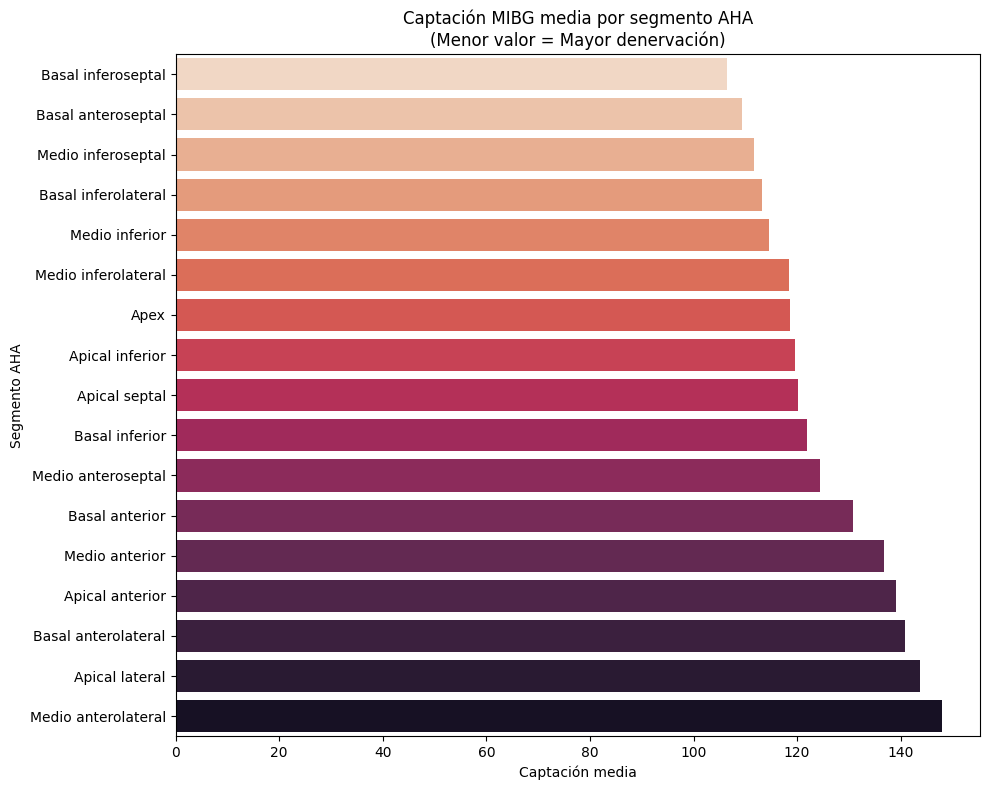

In [ ]:
# CREO IMAGENES DE CAPTACION

# Selecciono solo las columnas de los segmentos AHA
segmentos_aha = [
    'Apex',
    'Apical anterior', 'Apical inferior', 'Apical lateral', 'Apical septal',
    'Basal anterior', 'Basal anterolateral', 'Basal anteroseptal',
    'Basal inferior', 'Basal inferolateral', 'Basal inferoseptal',
    'Medio anterior', 'Medio anterolateral', 'Medio anteroseptal',
    'Medio inferior', 'Medio inferolateral', 'Medio inferoseptal'
]

# medias por segmento
media_segmentos = df_total[segmentos_aha].mean().sort_values()
print(media_segmentos)


plt.figure(figsize=(10, 8))
sns.barplot(x=media_segmentos.values, y=media_segmentos.index, palette='rocket_r')
plt.title('Captación MIBG media por segmento AHA\n(Menor valor = Mayor denervación)')
plt.xlabel('Captación media')
plt.ylabel('Segmento AHA')
plt.tight_layout()
plt.show()

In [808]:
# # Desviación estándar por segmento
# std_segmentos = df_total[segmentos_aha].std().sort_values()
# print(std_segmentos)

df_total['rango_segmentos'] = df_total[segmentos_aha].max(axis=1) - df_total[segmentos_aha].min(axis=1)
print(df_total['rango_segmentos'].describe())

count     25.000000
mean      93.862320
std       30.666244
min       54.377000
25%       66.182000
50%       90.055000
75%      107.227000
max      156.647000
Name: rango_segmentos, dtype: float64


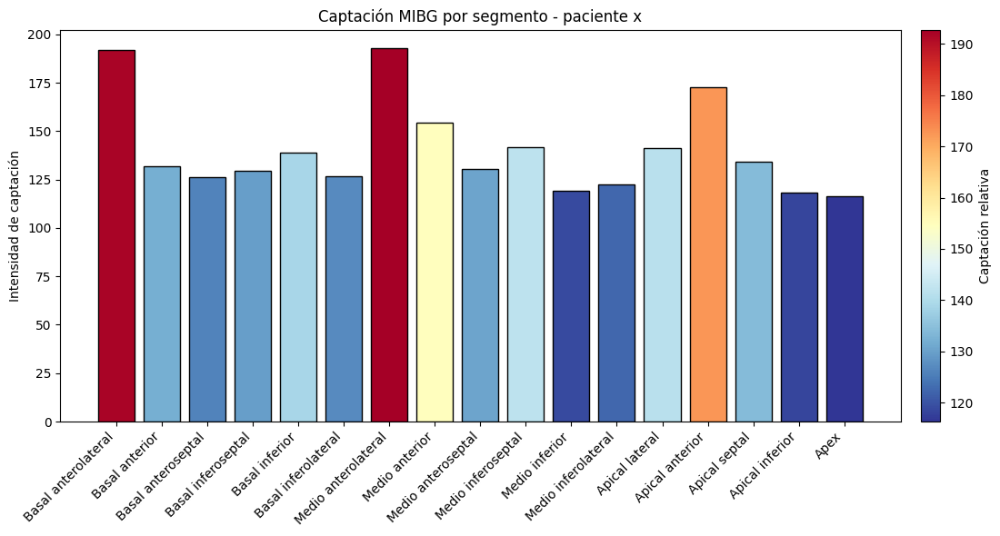

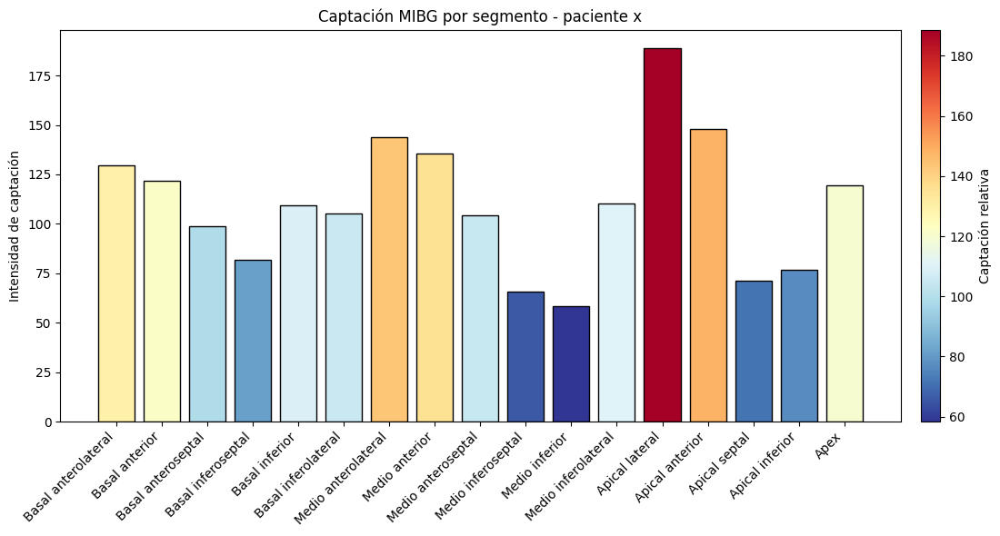

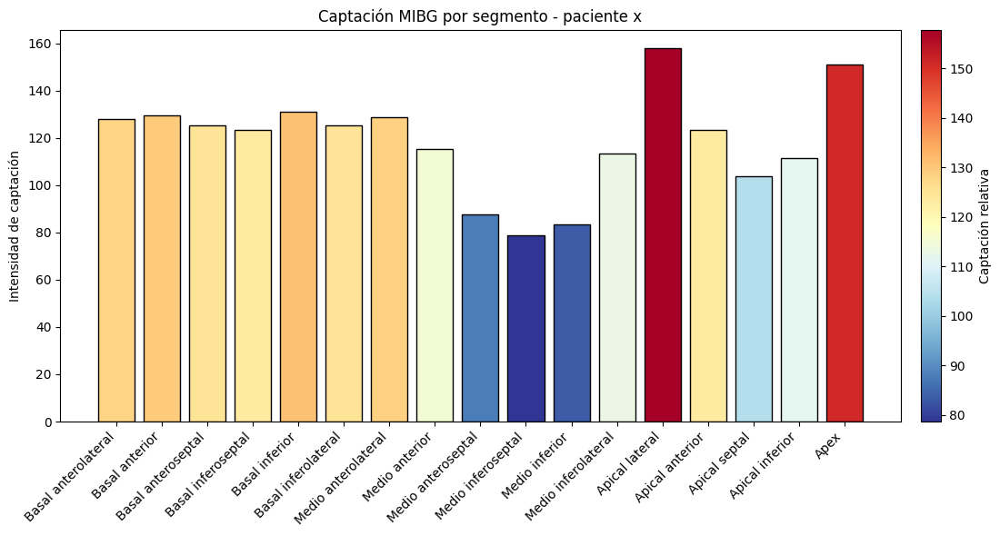

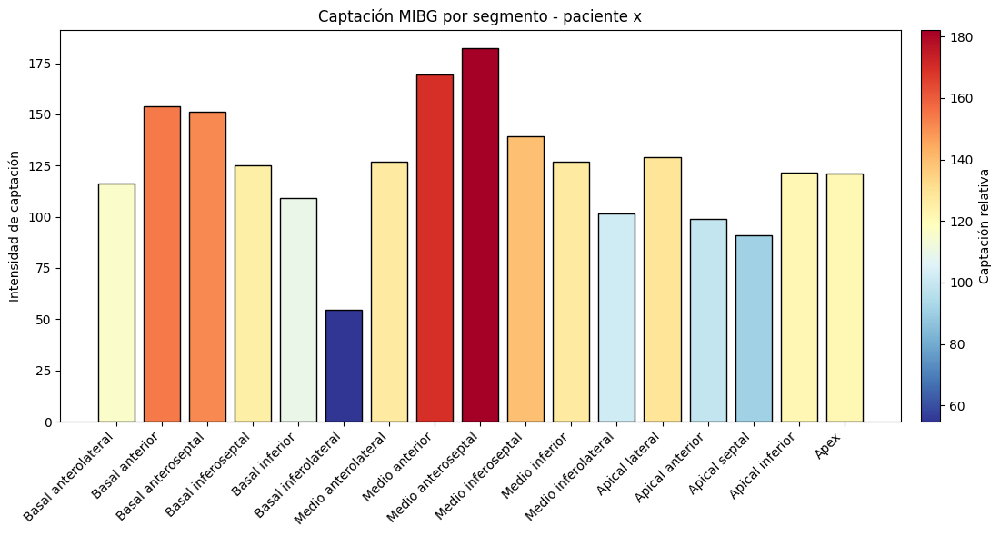

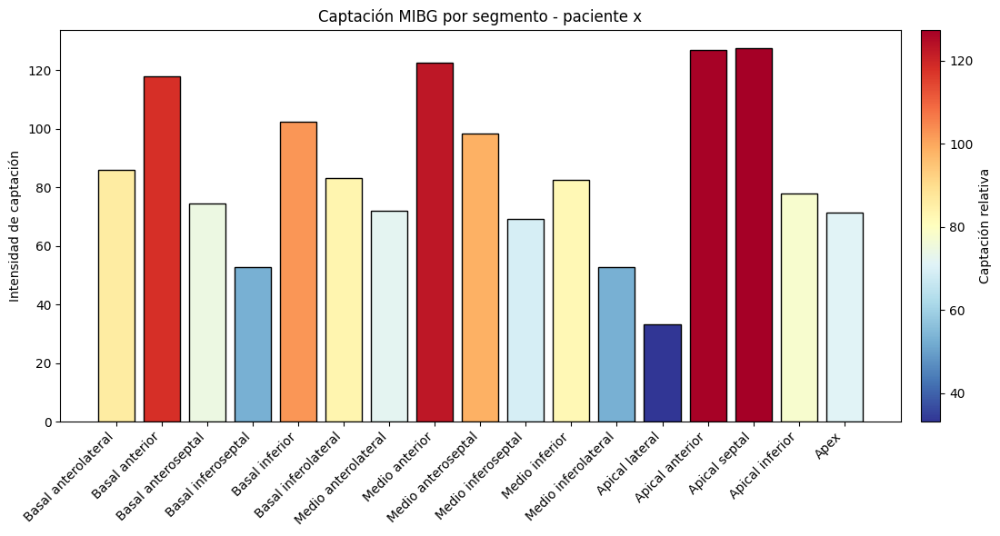

...

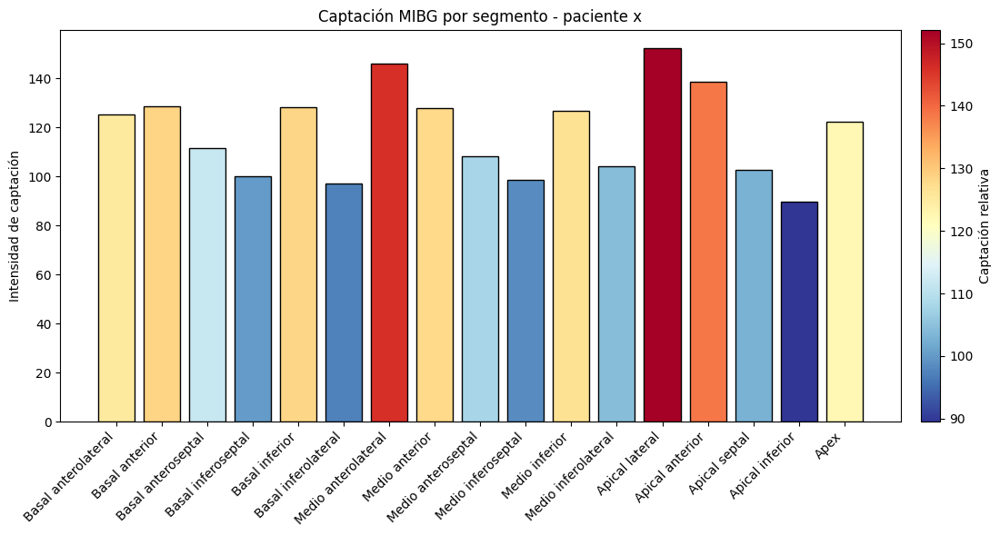

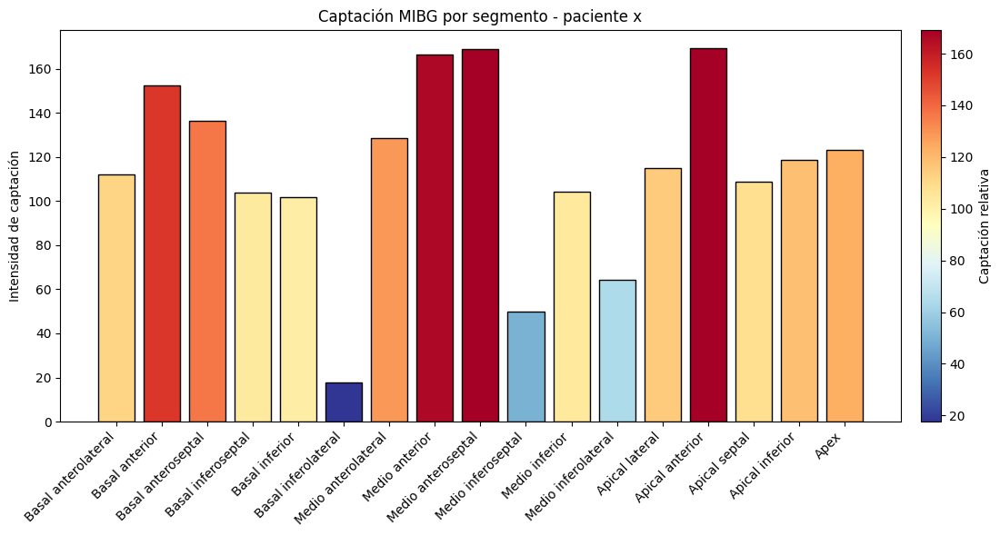

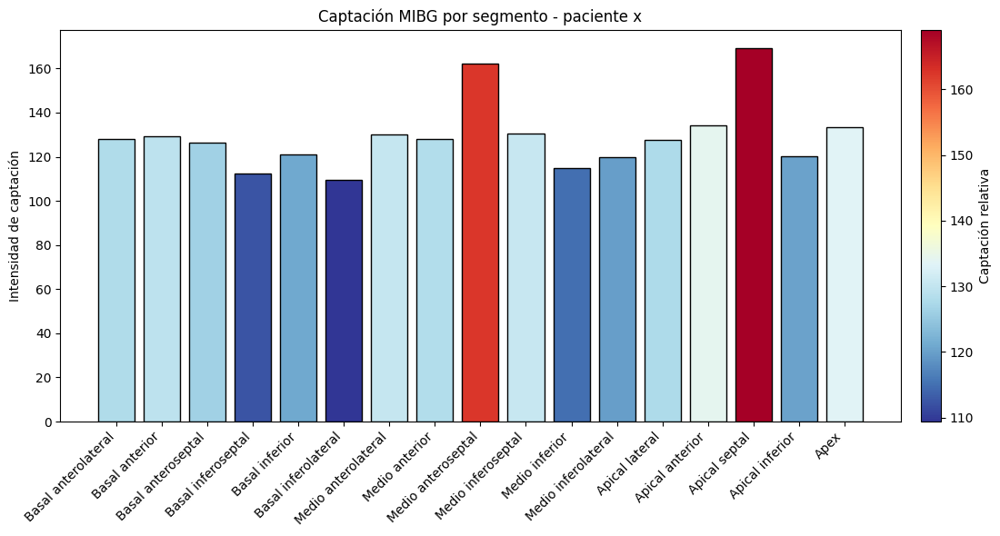

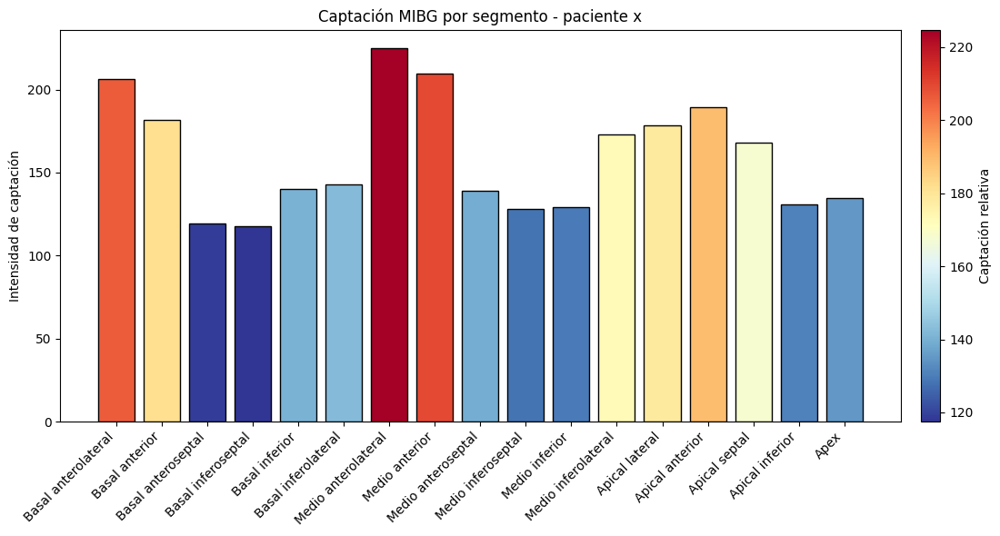

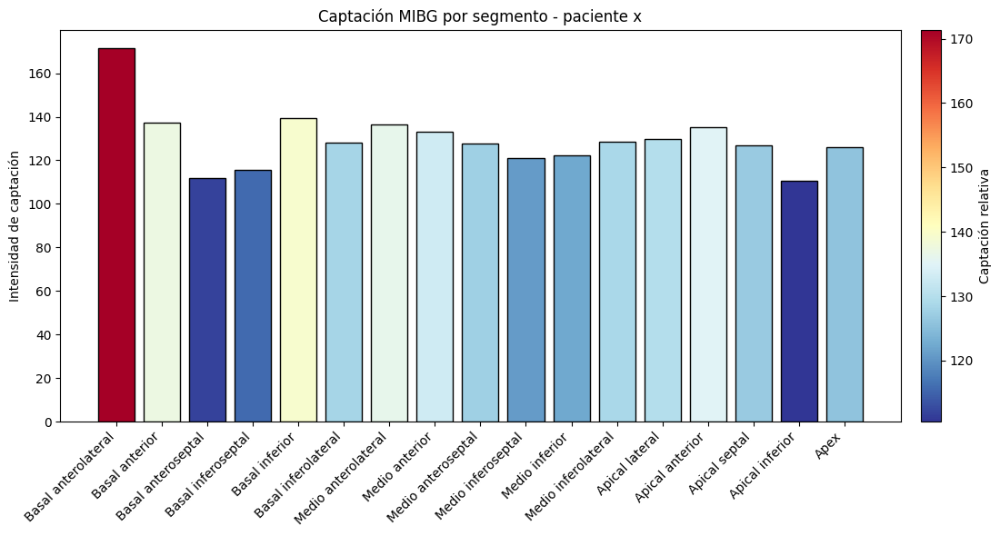

In [ ]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable, get_cmap

segmentos_aha = [
    'Basal anterolateral', 'Basal anterior', 'Basal anteroseptal', 'Basal inferoseptal',
    'Basal inferior', 'Basal inferolateral',
    'Medio anterolateral', 'Medio anterior', 'Medio anteroseptal', 'Medio inferoseptal',
    'Medio inferior', 'Medio inferolateral',
    'Apical lateral', 'Apical anterior', 'Apical septal', 'Apical inferior',
    'Apex'
]


def plot_barras_aha_normalizado_individual(df, paciente_cic):
    
    fila = df[df['CIC'] == paciente_cic]
    if fila.empty:
        print(f"Paciente CIC={paciente_cic} no encontrado.")
        return
    
    captaciones = fila[segmentos_aha].iloc[0]
    
    # Normalización individual (como en el AHA)
    norm = Normalize(vmin=captaciones.min(), vmax=captaciones.max())
    cmap = plt.colormaps['RdYlBu_r']
    colores = [cmap(norm(val)) for val in captaciones]

    fig, ax = plt.subplots(figsize=(12, 6))
    ax.bar(segmentos_aha, captaciones, color=colores, edgecolor='black')
    ax.set_xticks(range(len(segmentos_aha)))
    ax.set_xticklabels(segmentos_aha, rotation=45, ha='right')
    ax.set_ylabel('Intensidad de captación')
    ax.set_title(f'Captación MIBG por segmento - paciente x')

    # Colorbar con la misma escala del paciente
    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.02)
    cbar.set_label('Captación relativa')

    plt.tight_layout()
    plt.show()
    
# Bucle para graficar todos los pacientes
for paciente_cic in df_unido['CIC'].unique():
    plot_barras_aha_normalizado_individual(df_unido, paciente_cic)

In [810]:
# df_unido

In [811]:
df_unido_2=pd.merge(df_unido,df[['CIC','GRUPO']], on='CIC',how='left')
# df_unido_2

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


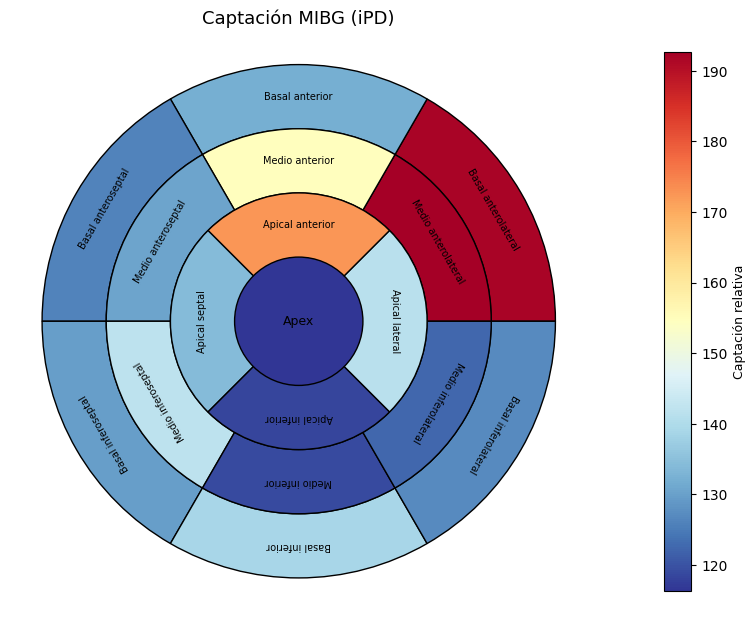

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


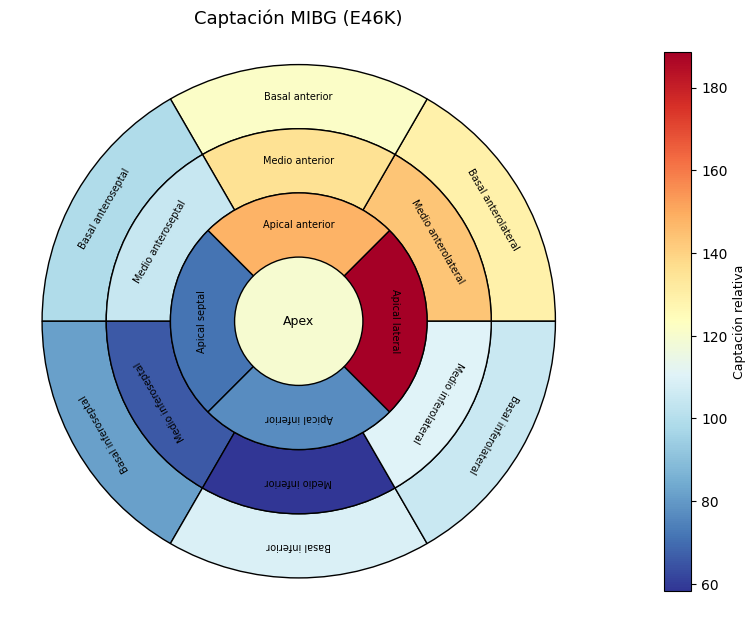

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


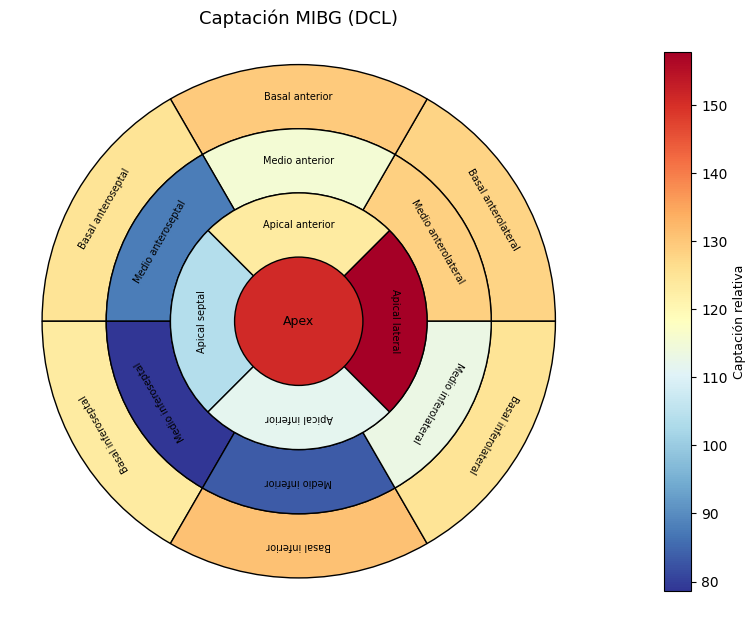

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


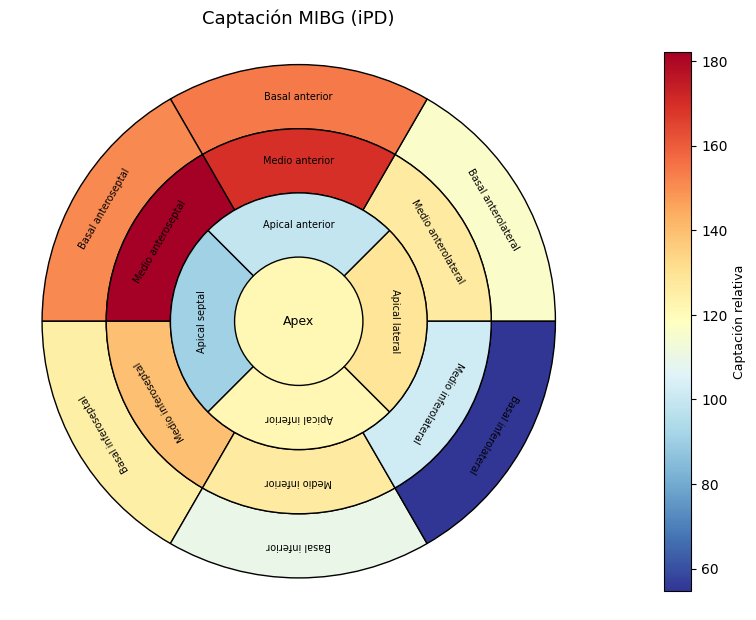

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


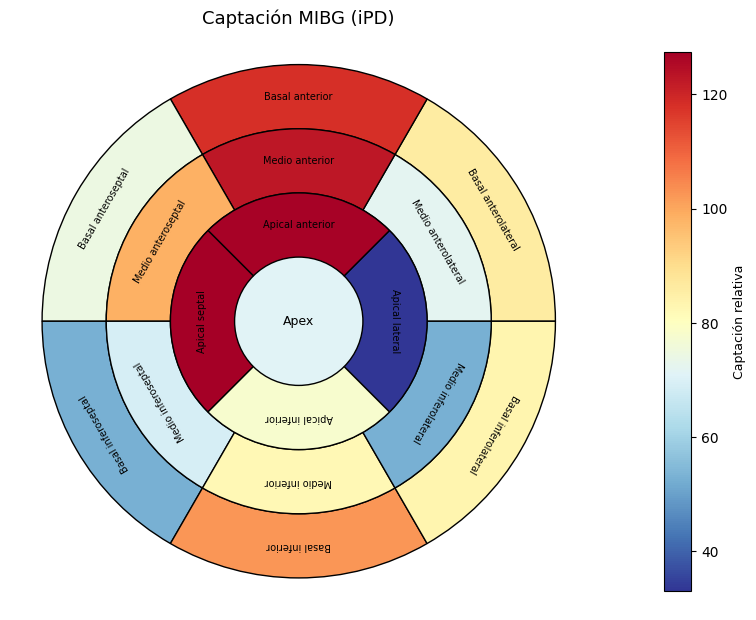

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


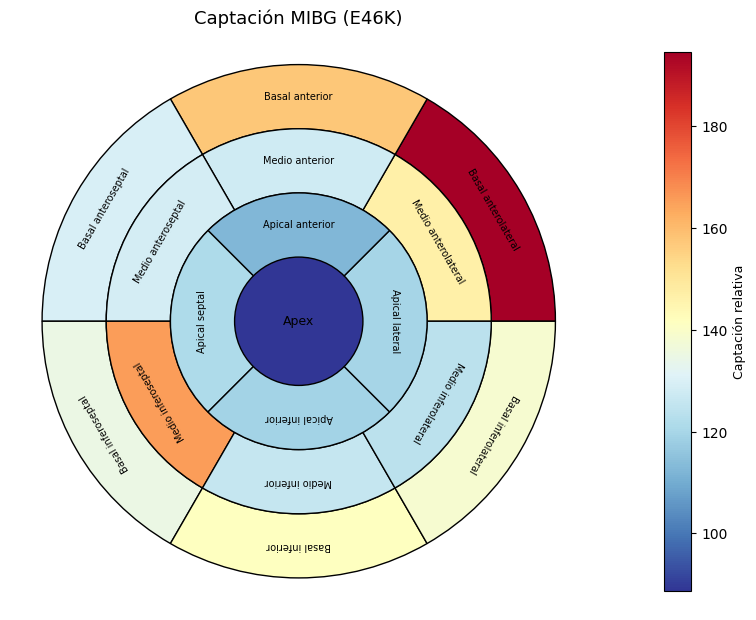

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


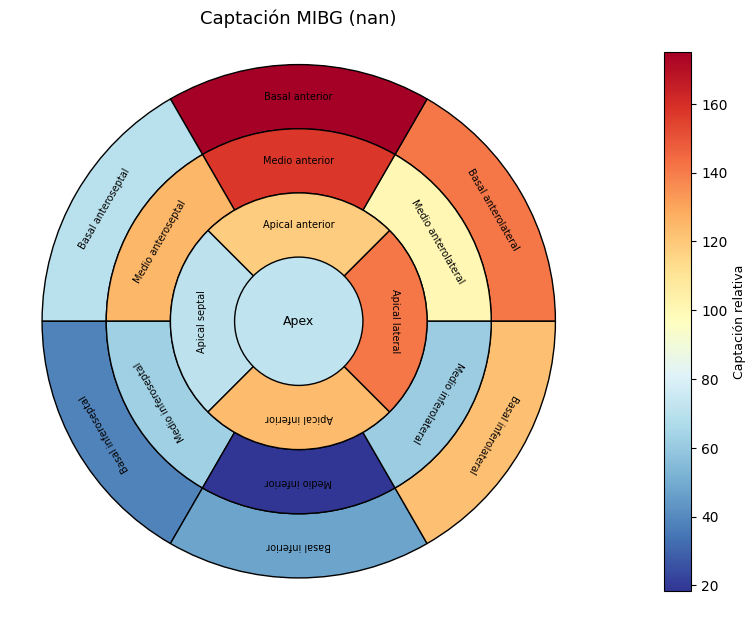

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


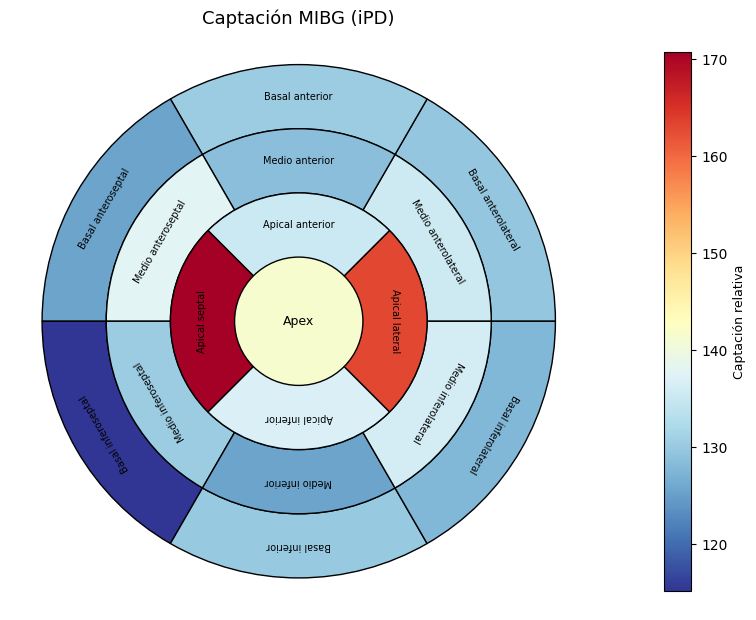

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


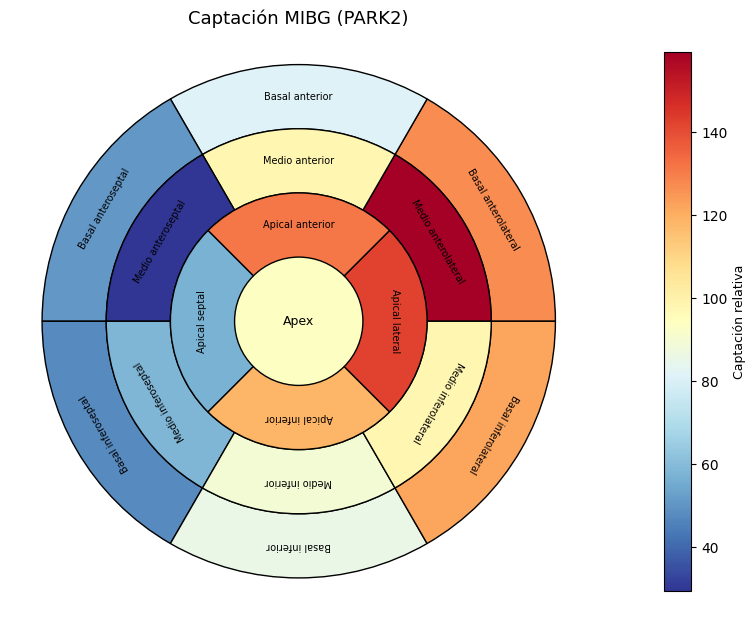

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


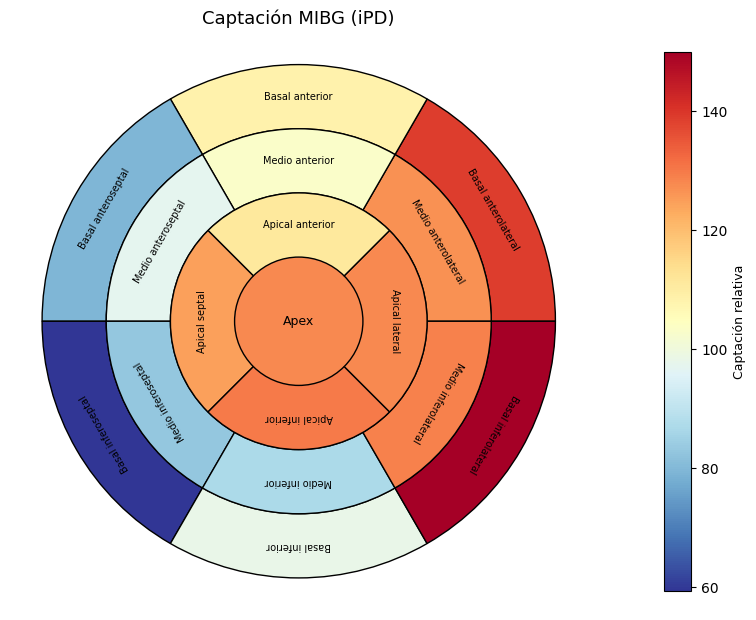

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


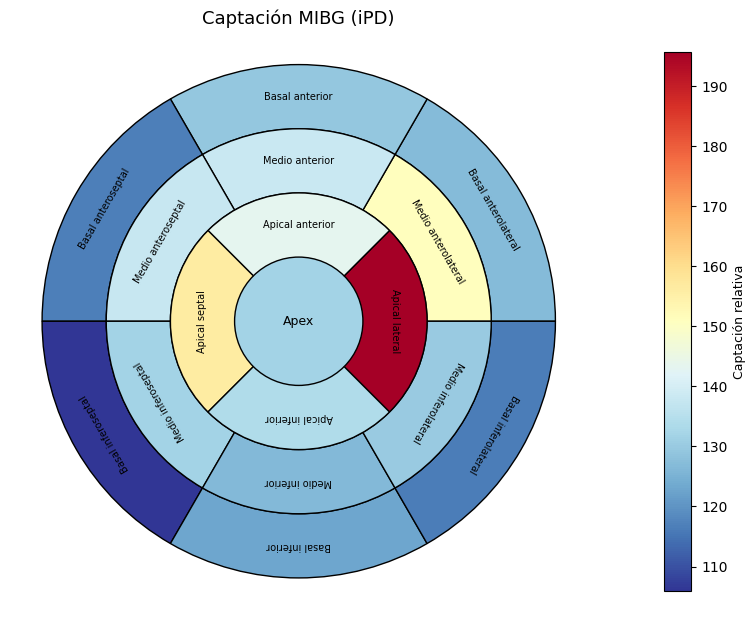

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


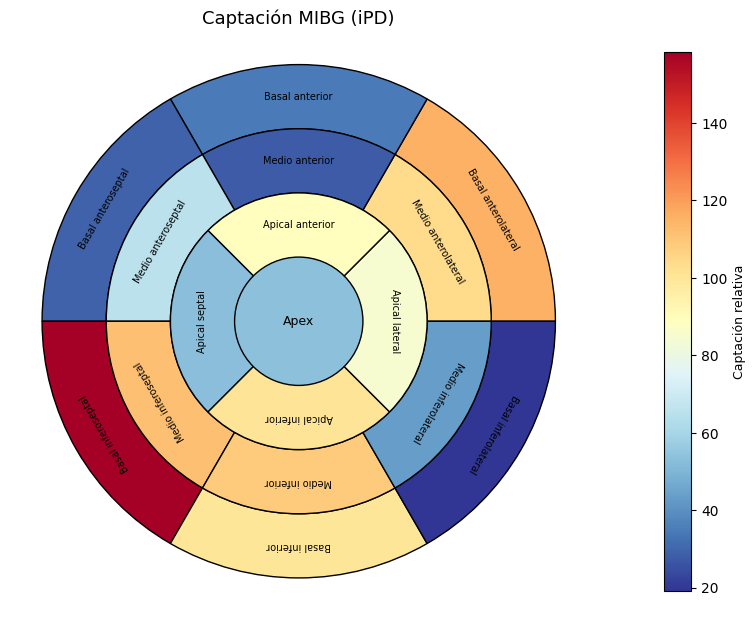

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


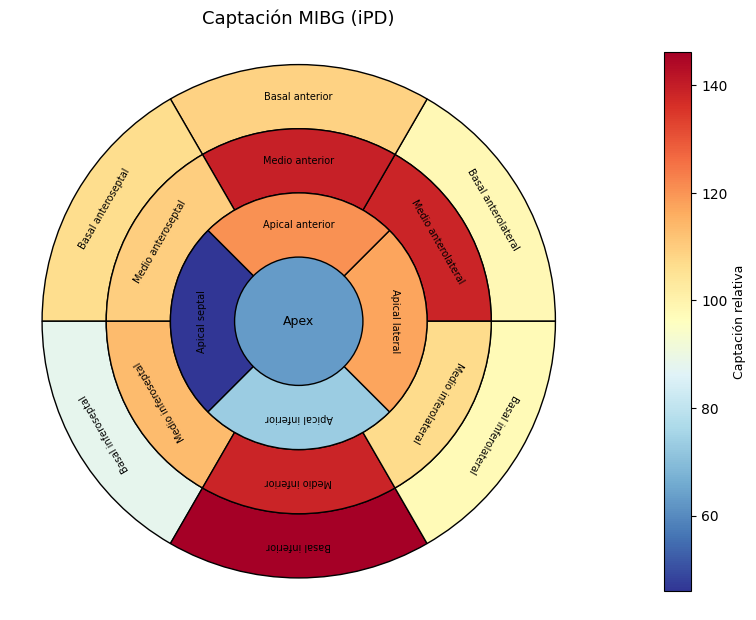

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


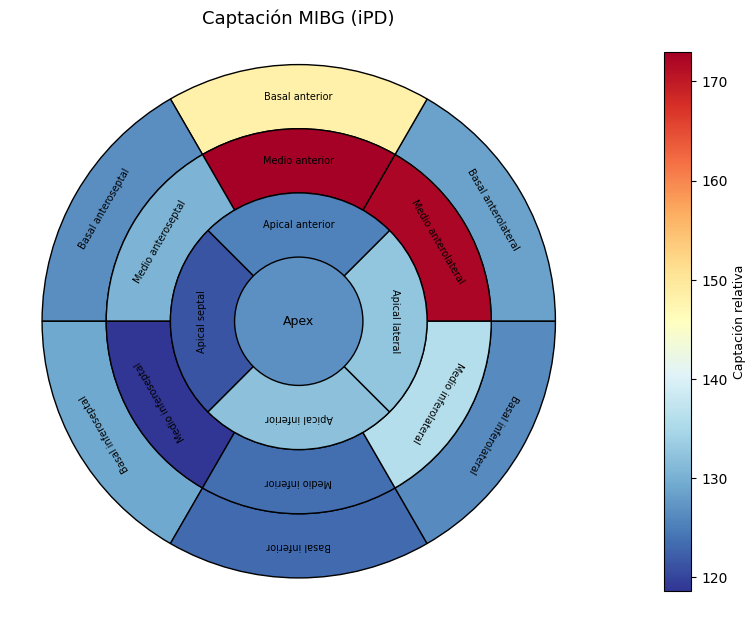

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


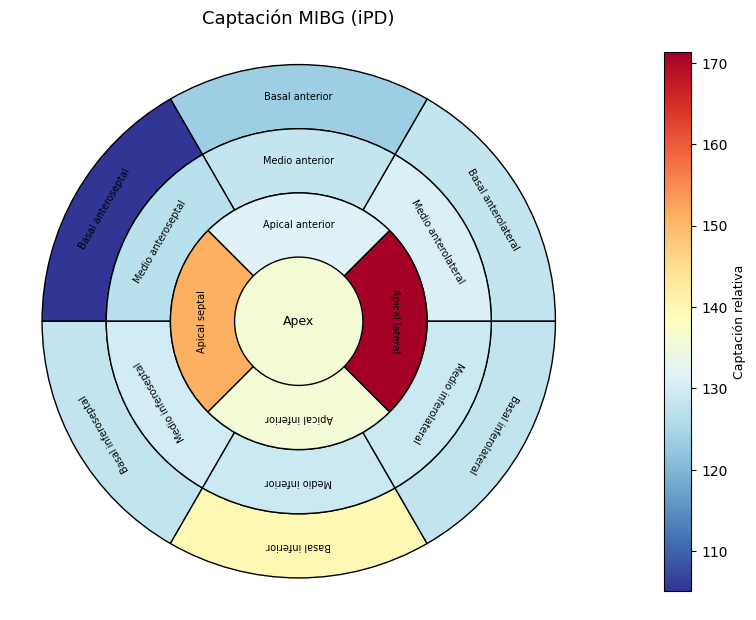

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


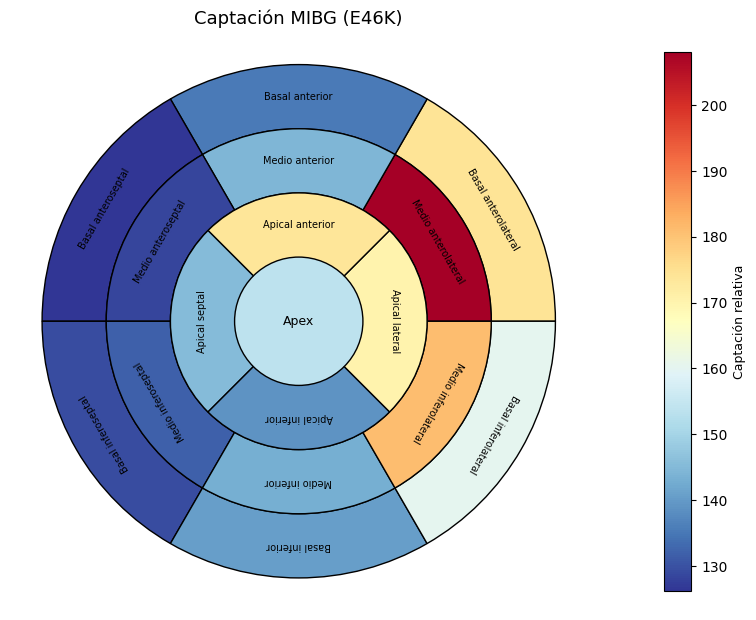

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


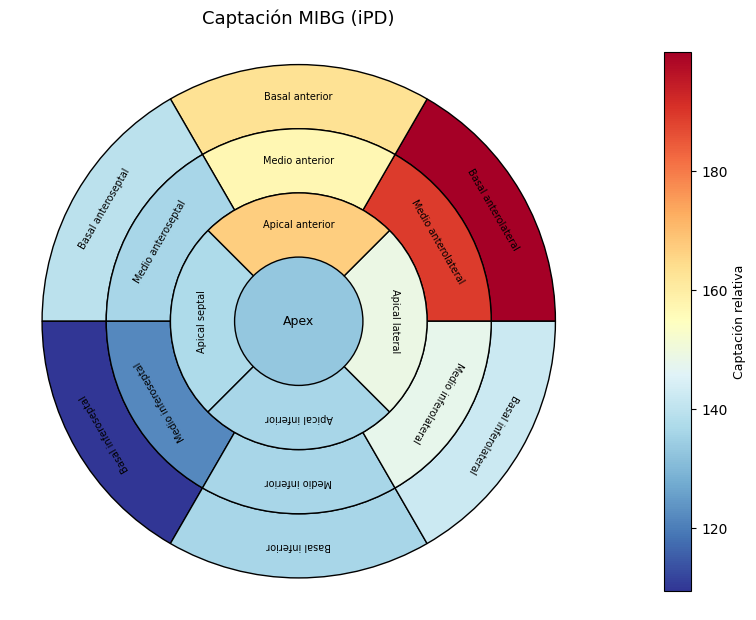

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


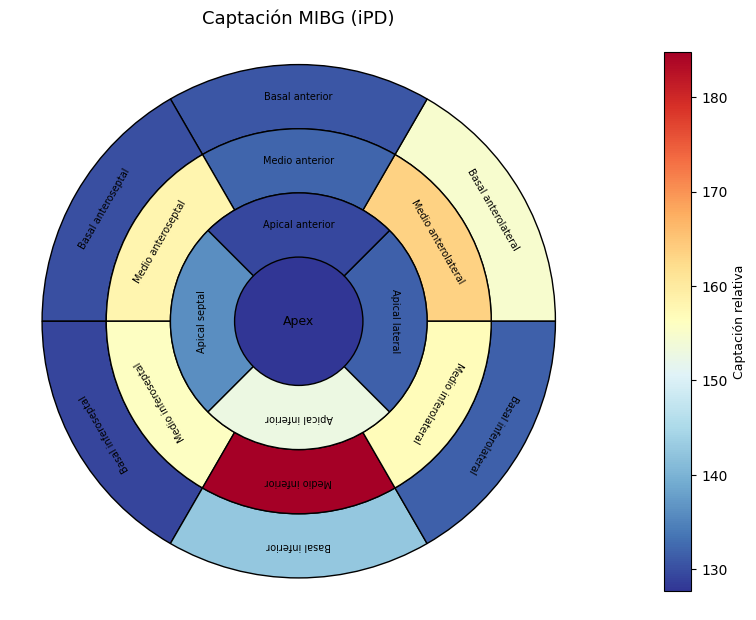

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


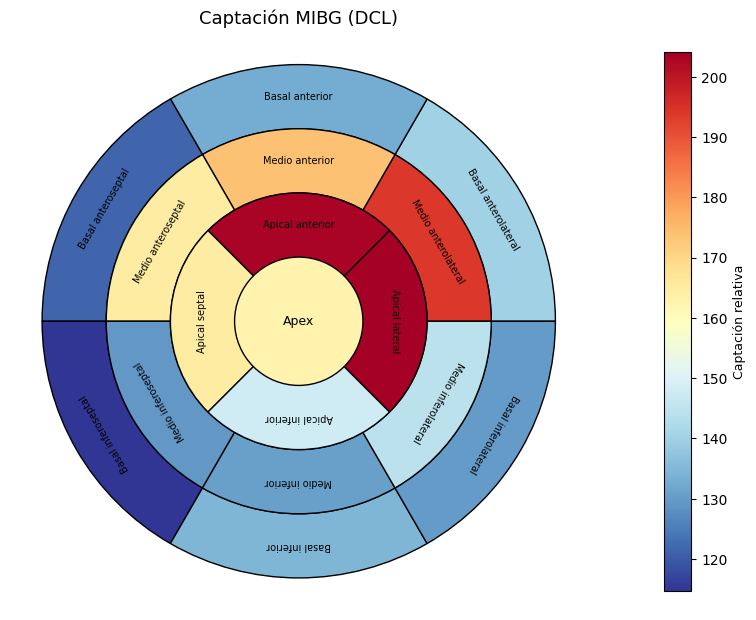

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


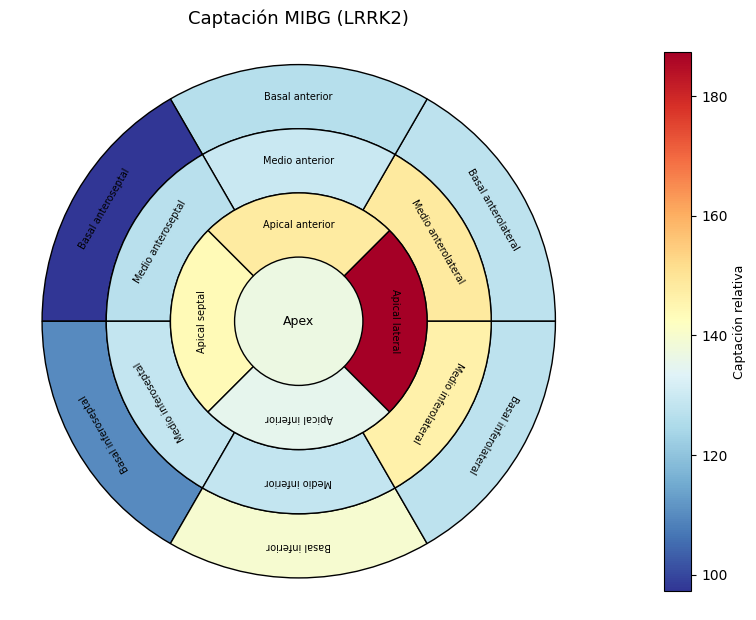

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


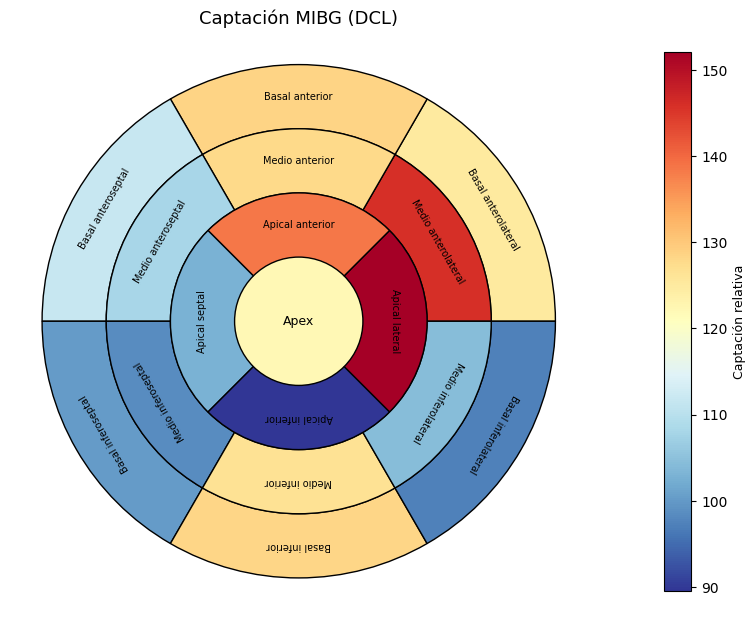

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


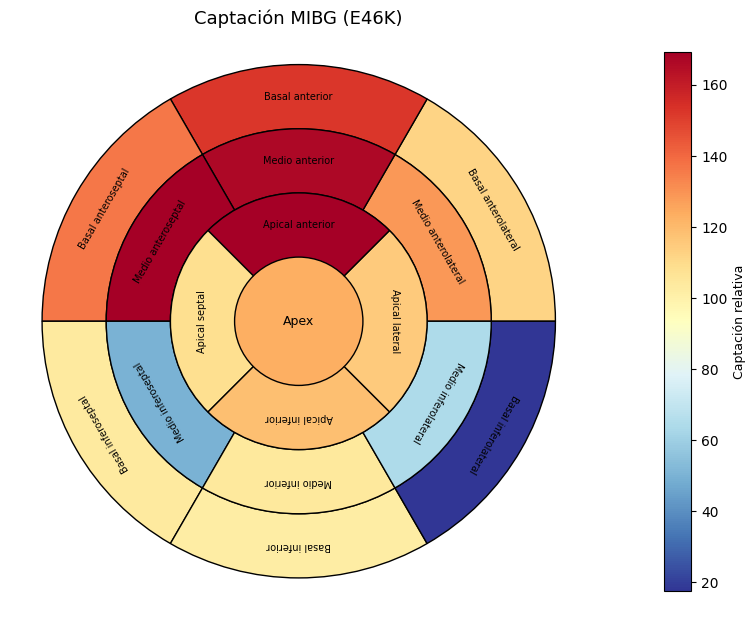

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


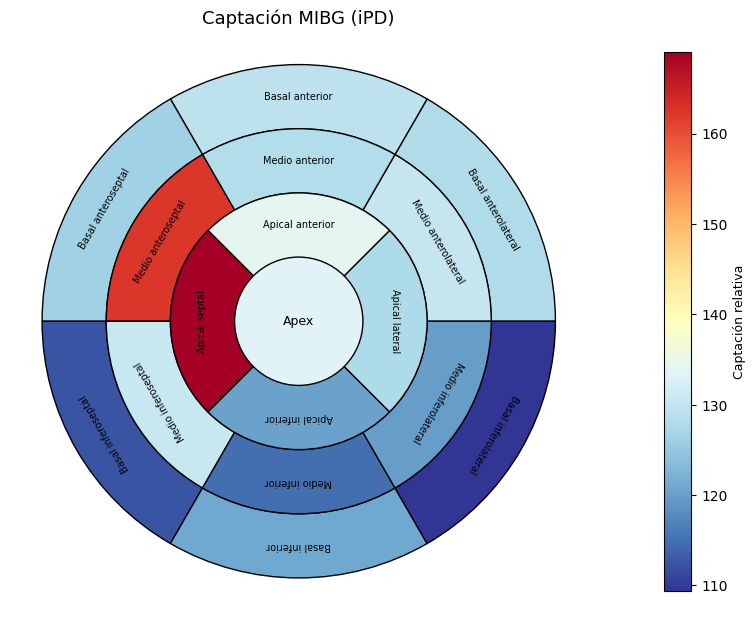

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


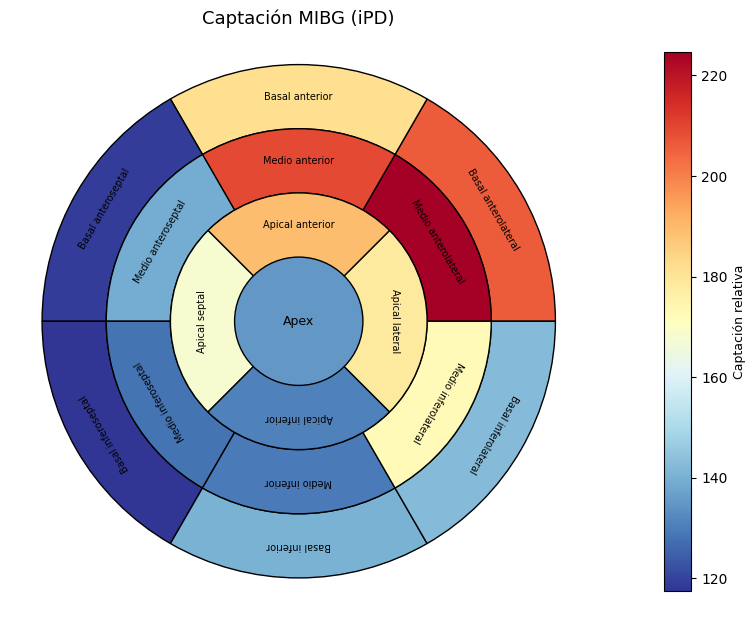

C:\Users\angel\AppData\Local\Temp\ipykernel_11116\11891477.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle((0, 0), radii['Apex'][1],


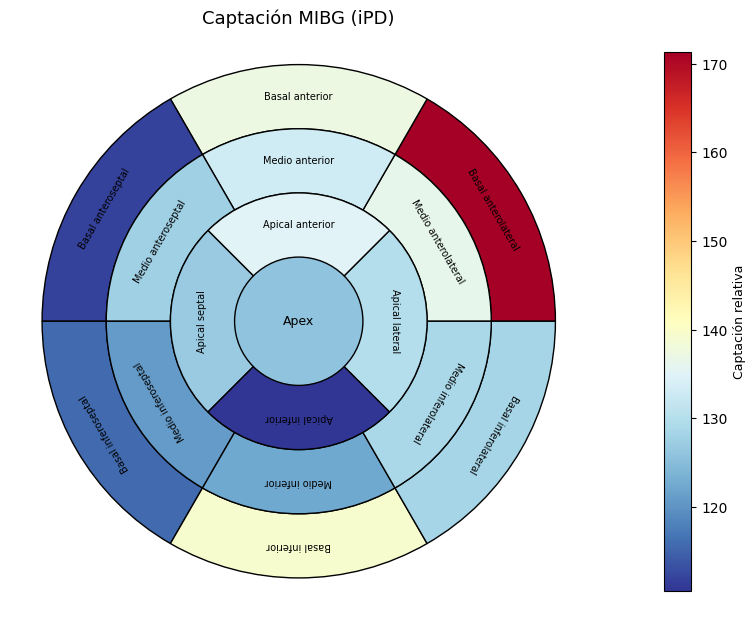

In [ ]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Segmentos del modelo AHA
segmentos_aha = [
    'Basal anterolateral', 'Basal anterior', 'Basal anteroseptal', 'Basal inferoseptal',
    'Basal inferior', 'Basal inferolateral',
    'Medio anterolateral', 'Medio anterior', 'Medio anteroseptal', 'Medio inferoseptal',
    'Medio inferior', 'Medio inferolateral',
    'Apical lateral', 'Apical anterior', 'Apical septal', 'Apical inferior',
    'Apex'
]

# Ángulos y radios
angles_6 = np.linspace(0, 2*np.pi, 7)[:-1]
centros_apical = np.deg2rad([45, 135, 225, 315])
width_apical = np.pi / 2

radii = {
    'Basal': (3, 4),
    'Medio': (2, 3),
    'Apical': (1, 2),
    'Apex': (0, 1)
}

def plot_sector(ax, theta_start, theta_end, r_inner, r_outer, color):
    ax.bar(x=(theta_start + theta_end)/2,
           height=r_outer - r_inner,
           width=theta_end - theta_start,
           bottom=r_inner,
           color=color,
           edgecolor='k',
           align='center')

def plot_paciente_aha(captaciones, paciente_id, grupo):
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    
    norm = Normalize(vmin=captaciones.min(), vmax=captaciones.max())
    cmap = plt.cm.RdYlBu_r

    # Basal
    for i in range(6):
        plot_sector(ax, angles_6[i], angles_6[i] + 2*np.pi/6,
                    radii['Basal'][0], radii['Basal'][1],
                    cmap(norm(captaciones[segmentos_aha[i]])))

    # Medio
    for i in range(6):
        plot_sector(ax, angles_6[i], angles_6[i] + 2*np.pi/6,
                    radii['Medio'][0], radii['Medio'][1],
                    cmap(norm(captaciones[segmentos_aha[6+i]])))

    # Apical
    for i, center in enumerate(centros_apical):
        theta_start = center - np.deg2rad(45) - width_apical/2
        theta_end = center - np.deg2rad(45) + width_apical/2
        plot_sector(ax, theta_start, theta_end,
                    radii['Apical'][0], radii['Apical'][1],
                    cmap(norm(captaciones[segmentos_aha[12 + i]])))

    # Apex
    circle = plt.Circle((0, 0), radii['Apex'][1],
                        color=cmap(norm(captaciones['Apex'])),
                        transform=ax.transData._b,
                        zorder=0, edgecolor='k', linewidth=1)
    ax.add_artist(circle)

    # Etiquetas
    label_angles_6 = angles_6 + np.pi/6
    label_angles_4 = centros_apical - np.deg2rad(45)

    for i in range(6):
        ax.text(label_angles_6[i], 3.5, segmentos_aha[i], ha='center', va='center', fontsize=7,
                rotation=np.degrees(label_angles_6[i]-np.pi/2))

    for i in range(6):
        ax.text(label_angles_6[i], 2.5, segmentos_aha[6+i], ha='center', va='center', fontsize=7,
                rotation=np.degrees(label_angles_6[i]-np.pi/2))

    for i in range(4):
        ax.text(label_angles_4[i], 1.5, segmentos_aha[12+i], ha='center', va='center', fontsize=7,
                rotation=np.degrees(label_angles_4[i]-np.pi/2))

    ax.text(0, 0, 'Apex', ha='center', va='center', fontsize=9)

    # Ajustes
    ax.set_ylim(0, 4.5)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.grid(False)
    ax.spines['polar'].set_visible(False)
    ax.xaxis.grid(False)
    plt.title(f'Captación MIBG ({grupo})', fontsize=13)

    # Colorbar
    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.1, shrink=0.7)
    cbar.set_label('Captación relativa', fontsize=9)

    plt.tight_layout()
    plt.show()
    # plt.savefig(f'captacion_CIC_{paciente_id}.png')  

for _, row in df_unido_2.iterrows():
    captaciones = row[segmentos_aha]
    cic = row['CIC']
    grupo = row['GRUPO']
    plot_paciente_aha(captaciones, cic, grupo)

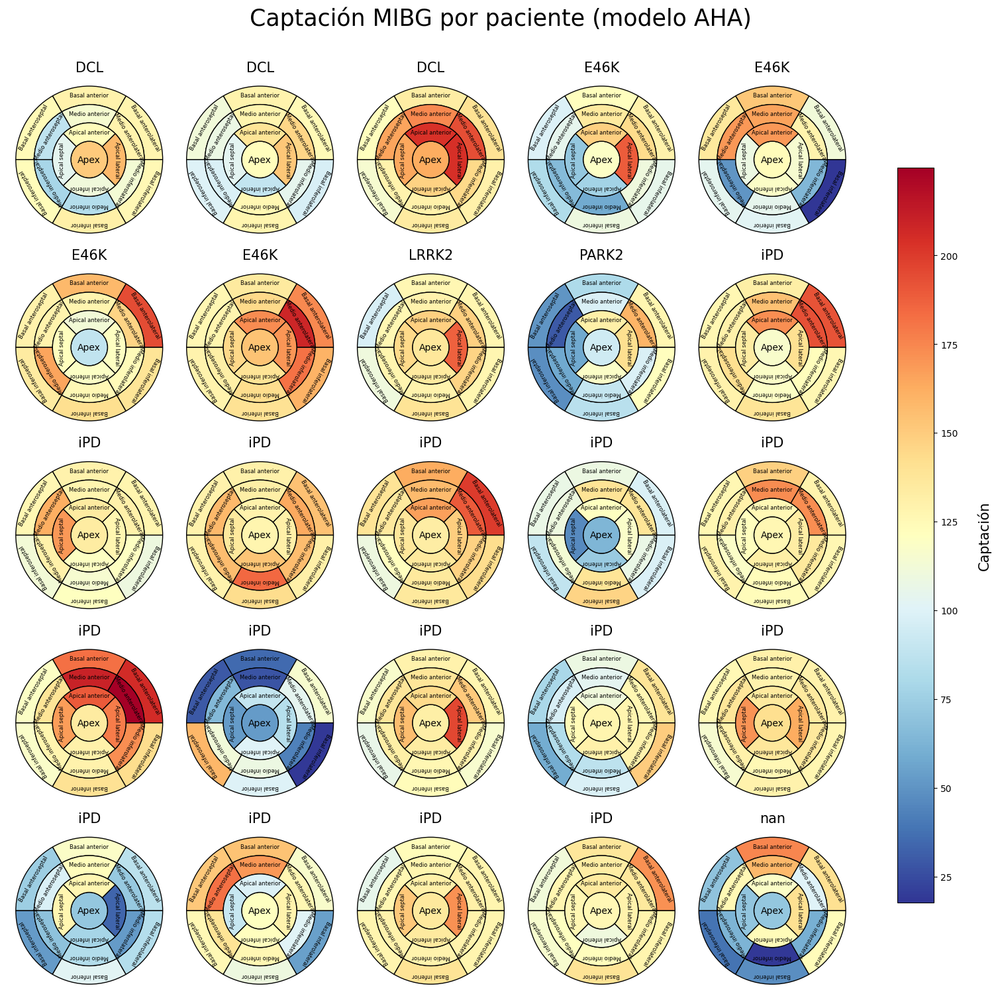

In [ ]:
def plot_todos_pacientes_aha(df_total, segmentos_aha):
    from matplotlib.cm import ScalarMappable
    from matplotlib.colors import Normalize
    
    # Ordenar por 'GRUPO' (puedes cambiar a otra columna si quieres)
    df_total = df_total.sort_values(by='GRUPO').reset_index(drop=True)
    

    angles_6 = np.linspace(0, 2*np.pi, 7)[:-1]
    centros_apical = np.deg2rad([45, 135, 225, 315])
    width_apical = np.pi / 2
    radii = {'Basal': (3, 4), 'Medio': (2, 3), 'Apical': (1, 2), 'Apex': (0, 1)}

    def plot_sector(ax, theta_start, theta_end, r_inner, r_outer, color):
        ax.bar((theta_start + theta_end)/2, r_outer - r_inner,
               width=theta_end - theta_start, bottom=r_inner,
               color=color, edgecolor='k', align='center')

    num_pacientes = len(df_total)
    ncols = 5
    nrows = int(np.ceil(num_pacientes / ncols))

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(ncols*3, nrows*3),
                             subplot_kw=dict(polar=True),
                             constrained_layout=True)

    axes = axes.flatten()

    all_values = df_total[segmentos_aha].values.flatten()
    norm = Normalize(vmin=np.min(all_values), vmax=np.max(all_values))
    cmap = plt.cm.RdYlBu_r

    for i, (_, row) in enumerate(df_total.iterrows()):
        ax = axes[i]
        captaciones = row[segmentos_aha]
        cic = row['CIC']
        grupo = row['GRUPO']

        # Basal
        for j in range(6):
            plot_sector(ax, angles_6[j], angles_6[j] + 2*np.pi/6,
                        radii['Basal'][0], radii['Basal'][1],
                        cmap(norm(captaciones[segmentos_aha[j]])))

        # Medio
        for j in range(6):
            plot_sector(ax, angles_6[j], angles_6[j] + 2*np.pi/6,
                        radii['Medio'][0], radii['Medio'][1],
                        cmap(norm(captaciones[segmentos_aha[6+j]])))

        # Apical
        for j, center in enumerate(centros_apical):
            theta_start = center - np.deg2rad(45) - width_apical/2
            theta_end = center - np.deg2rad(45) + width_apical/2
            plot_sector(ax, theta_start, theta_end,
                        radii['Apical'][0], radii['Apical'][1],
                        cmap(norm(captaciones[segmentos_aha[12 + j]])))

        # Apex
        circle = plt.Circle((0, 0), radii['Apex'][1],
                        facecolor=cmap(norm(captaciones['Apex'])),
                        edgecolor='k',
                        transform=ax.transData._b,
                        zorder=0, linewidth=1)
        ax.add_artist(circle)

        # Mostrar etiquetas solo en el primer subplot (seria con if i==0)
        if i <26 :
            label_angles_6 = angles_6 + np.pi/6
            label_angles_4 = centros_apical - np.deg2rad(45)

            for j in range(6):
                ax.text(label_angles_6[j], 3.5, segmentos_aha[j], ha='center', va='center', fontsize=6,
                        rotation=np.degrees(label_angles_6[j]-np.pi/2))
            for j in range(6):
                ax.text(label_angles_6[j], 2.5, segmentos_aha[6+j], ha='center', va='center', fontsize=6,
                        rotation=np.degrees(label_angles_6[j]-np.pi/2))
            for j in range(4):
                ax.text(label_angles_4[j], 1.5, segmentos_aha[12+j], ha='center', va='center', fontsize=6,
                        rotation=np.degrees(label_angles_4[j]-np.pi/2))
            ax.text(0, 0, 'Apex', ha='center', va='center', fontsize=10)

        ax.set_ylim(0, 4.5)
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.grid(False)
        ax.spines['polar'].set_visible(False)
        ax.xaxis.grid(False)
        ax.set_title(f'{grupo}', fontsize=15)

    # Eliminar subplots vacíos
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    # Colorbar general
    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=axes.tolist(), shrink=0.8, pad=0.05)
    cbar.set_label('\nCaptación', fontsize=15)

    plt.suptitle("Captación MIBG por paciente (modelo AHA)\n", fontsize=25)
    plt.show()
    
plot_todos_pacientes_aha(df_unido_2, segmentos_aha)
